# Projet 2 : Concevez une application au service de la santé publique

<img src= 'https://static.openfoodfacts.org/images/svg/openfoodfacts-logo-fr.svg' width=500/>

## Détails spécifiques pour le projet :

### __Scénario :__

L'agence "Santé publique France" a lancé un appel à projets pour trouver des idées innovantes d’applications en lien avec l'alimentation. Vous souhaitez y participer et proposer une idée d’application.

--------------------------------------------------------------------------------------------------------

Le jeu de données Open Food Facts est disponible sur le site officiel : https://world.openfoodfacts.org/

--------------------------------------------------------------------------------------------------------

Les variables sont définies à cette adresse : https://world.openfoodfacts.org/data/data-fields.txt

--------------------------------------------------------------------------------------------------------

__Les champs sont séparés en quatre sections :__

 - nom, date de modification, etc.
 - Un ensemble de tags : catégorie du produit, localisation, origine, etc.
 - Les ingrédients composant les produits et leurs additifs éventuels.
 - Des informations nutritionnelles : quantité en grammes d’un nutriment pour 100 grammes du produit.

<img src= 'https://static.data.gouv.fr/images/9d/7b312080fe4f58868a928bddbff30f.png' width=500/>

<img src= https://quoidansmonassiette.fr/wp-content/uploads/2018/05/Infographie-calcul-nutriscore-logo-nutritionnel-score-corrigé-scaled.jpg width=500/>

source : https://quoidansmonassiette.fr/comment-est-calcule-le-nutri-score-logo-nutritionnel/

### __Qu'est ce que le Nutriscore :__

Le Nutri-score est un système d'étiquetage nutritionnel à cinq niveaux, allant de A à E et du vert au rouge, établi en fonction de la valeur nutritionnelle d'un produit alimentaire. Il a pour but de favoriser le choix de produits plus sains d'un point de vue nutritionnel par les consommateurs et ainsi de participer à la lutte contre les maladies cardiovasculaires, l'obésité et le diabète de type 1.

Le score est calculé par un système de points, le score le plus faible étant le meilleur :

--------------------------------------------------------------------------------------------------------

__Eléments défavorables au score :__

apport calorique
teneur en sucre
teneur en graisses saturés
teneur en sel

--------------------------------------------------------------------------------------------------------

__Eléments favorables au score :__

teneur en fruits, légumes, légumineuses et oléagineux
teneur en fibres
teneur en protéines

--------------------------------------------------------------------------------------------------------

__Source :__
https://fr.wikipedia.org/wiki/Nutri-score

<img src= 'https://www.stylbio.fr/img/cms/images/gfx/logo-usda-organic.png' width=500/>

### __Qu'est ce que le Label Organic :__

Le label ORGANIC est une certification qui vous garantit qu'un produit est fabriqué avec le moins d'impact possible sur l'environnement tandis que le label BIO assure que les producteurs n'ont pas utilisé de pesticides ou autres produits chimiques pour cultiver leurs produits ou pour nourrir leurs animaux.

--------------------------------------------------------------------------------------------------------

Source : https://www.ams.usda.gov/rules-regulations/organic/labeling

# Mise en place du projet :

#### Import des librairies :

In [1]:
# Import des Librairies :

#Librairie d'analyse
import numpy as np
import pandas as pd

#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

#pd.options.display.max_columns = None
#pd.options.display.max_rows = None

#librairie de visualisation
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.figure_factory as ff
import plotly.express as px
import plotly.graph_objects as go

# Pour supprimer les warnings :
import sys
if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")

#### Import du CSV :

In [2]:
Data = pd.read_csv('P2_data_clean.csv')

In [3]:
Data = Data.dropna()

In [4]:
Data.head()

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr
0,http://world-fr.openfoodfacts.org/produit/0000...,Cauliflower,"Sainsbury's,by sainsbury's",Royaume-Uni,Fruits et Légumes,0.0,0.0,144.0,0.90,2.50,1.8,3.60,0.00000,-4.333333,5.0,A
1,http://world-fr.openfoodfacts.org/produit/0000...,Sweet 'N' Hot Salad Peppers,Mt. Olive,États-Unis,Inconnu,0.0,0.0,75.0,0.00,25.00,0.0,0.00,3.08356,-3.555556,2.0,B
2,http://world-fr.openfoodfacts.org/produit/0000...,Cornichons,Trader Joe's,États-Unis,Inconnu,2.0,0.0,79.0,0.00,3.08,0.8,0.77,0.56642,1.000000,5.0,C
3,http://world-fr.openfoodfacts.org/produit/0001...,Diced In Tomato Juice,Trader Joe's,États-Unis,Inconnu,2.0,0.0,427.0,6.78,4.24,1.7,1.69,1.50622,4.000000,6.0,A
4,http://world-fr.openfoodfacts.org/produit/0001...,Vindaloo Sauce,Kroger,États-Unis,Inconnu,2.0,0.0,372.0,3.80,0.00,1.3,8.86,0.00000,-5.000000,4.0,A


# Analyses univariés :

Pour notre analyse, nous allons faire des prints pour visualiser les données, puis nous utiliserons des graphiques pour une meilleure visualisation.

## Mesures statistiques

### Moyenne de chaque données :

La moyenne est la métrique évidente qui saute aux yeux. Son calcul est simple : additionner toutes les valeurs d’une feature et les diviser par le nombre d’observations.

Source : https://mrmint.fr/exploration-donnee-python

In [5]:
print(f"La moyenne du nombre d'additif est de : ", round(np.mean(Data.additives_n)))
print(f"La moyenne d'huile de palme est de :", round(np.mean(Data.ingredients_from_palm_oil_n)))
print(f"La moyenne d'énergie  est de :", round(np.mean(Data.energy_100g)))
print(f"La moyenne de graisse  est de :", round(np.mean(Data.fat_100g)))
print(f"La moyenne de sucre est de :", round(np.mean(Data.sugars_100g)))
print(f'La moyenne des fibres est de :', round(np.mean(Data.fiber_100g)))
print(f'La moyenne des protéines  est de :', round(np.mean(Data.proteins_100g)))
print(f'La moyenne de sel est de :', round(np.mean(Data.salt_100g)))
print(f'La moyenne pour la colonne de connaissance du produit est de :', round(np.mean(Data.Known)))

La moyenne du nombre d'additif est de :  2
La moyenne d'huile de palme est de : 0
La moyenne d'énergie  est de : 381
La moyenne de graisse  est de : 3
La moyenne de sucre est de : 7
La moyenne des fibres est de : 1
La moyenne des protéines  est de : 5
La moyenne de sel est de : 2
La moyenne pour la colonne de connaissance du produit est de : 5


On aurait pu utiliser la méthode du Data.describe(include='all'), mais j'ai une préférence pour celle-ci car je l'a trouve plus épuré.

### Médiane de chaque données :

La médiane est une valeur réelle m telle qu’il y ait au moins autant d’observations x_{i} inférieures ou égales à m que supérieure ou égales à m. En d’autres termes, il s’agit de trouver “le point central” des valeurs d’une feature donnée.

Source : https://mrmint.fr/exploration-donnee-python

In [6]:
print(f"La médiane du nombre d'additif est de : ", round(np.median(Data.additives_n)))
print(f"La médiane d'huile de palme est de :", round(np.median(Data.ingredients_from_palm_oil_n)))
print(f"La médiane d'énergie  est de :", round(np.median(Data.energy_100g)))
print(f"La médiane de graisse  est de :", round(np.median(Data.fat_100g)))
print(f"La médiane de sucre est de :", round(np.median(Data.sugars_100g)))
print(f'La médiane des fibres est de :', round(np.median(Data.fiber_100g)))
print(f'La médiane des protéines  est de :', round(np.median(Data.proteins_100g)))
print(f'La médiane de sel est de :', round(np.median(Data.salt_100g)))
print(f'La médiane pour la colonne de connaissance du produit est de :', round(np.median(Data.Known)))

La médiane du nombre d'additif est de :  1
La médiane d'huile de palme est de : 0
La médiane d'énergie  est de : 340
La médiane de graisse  est de : 1
La médiane de sucre est de : 4
La médiane des fibres est de : 0
La médiane des protéines  est de : 2
La médiane de sel est de : 1
La médiane pour la colonne de connaissance du produit est de : 5


## Mesures de dispersion des données

### Variance de chaque données :

La variance indique de quelle manière la série de données d’une feature se disperse autour de la moyenne. Une variance élevée indique que les valeurs sont très écartées les unes des autres et vice versa.

Source : https://mrmint.fr/exploration-donnee-python

In [7]:
print(f"La variance du nombre d'additif est de : ", round(np.var(Data.additives_n)))
print(f"La variance d'huile de palme est de :", round(np.var(Data.ingredients_from_palm_oil_n)))
print(f"La variance d'énergie  est de :", round(np.var(Data.energy_100g)))
print(f"La variance de graisse  est de :", round(np.var(Data.fat_100g)))
print(f"La variance de sucre est de :", round(np.var(Data.sugars_100g)))
print(f'La variance des fibres est de :', round(np.var(Data.fiber_100g)))
print(f'La variance des protéines  est de :', round(np.var(Data.proteins_100g)))
print(f'La variance de sel est de :', round(np.var(Data.salt_100g)))
print(f'La variance pour la colonne de connaissance du produit est de :', round(np.var(Data.Known)))

La variance du nombre d'additif est de :  5
La variance d'huile de palme est de : 0
La variance d'énergie  est de : 56371
La variance de graisse  est de : 19
La variance de sucre est de : 73
La variance des fibres est de : 5
La variance des protéines  est de : 38
La variance de sel est de : 54
La variance pour la colonne de connaissance du produit est de : 2


Ici on peut voir que l'énergie à une trés grosse variance, tandis que les autres sont plus ou moins modérés.

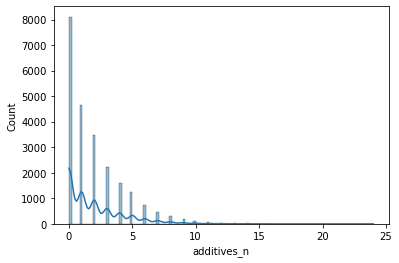

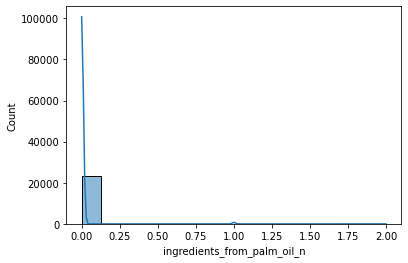

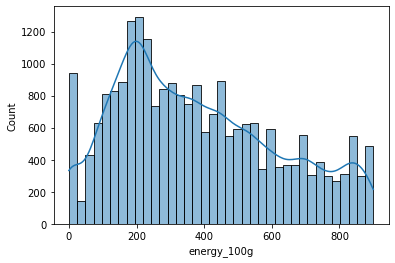

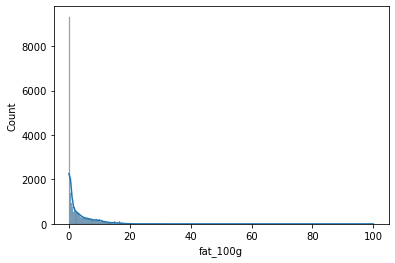

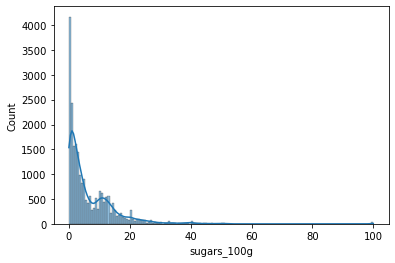

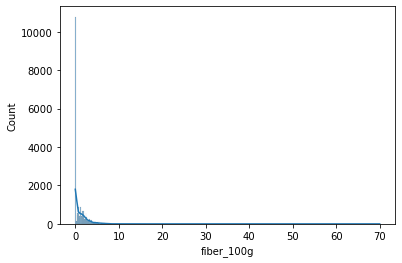

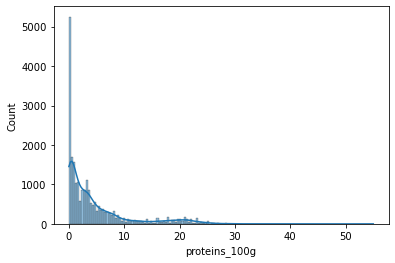

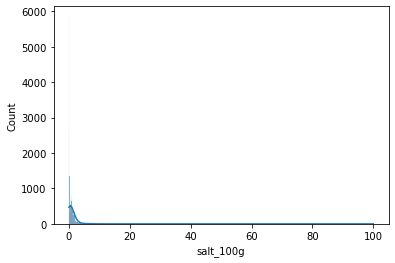

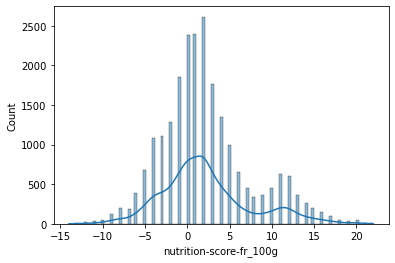

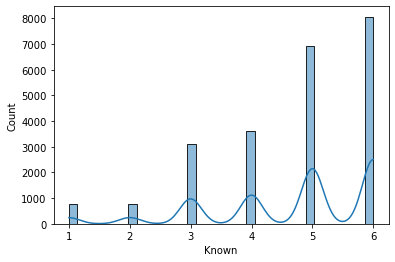

In [8]:
for var in Data.columns:
    if Data[var].dtypes == 'float64':
        sns.histplot(x=var, data=Data, kde=True) # kde permet d'analyser la densité
        plt.show()

On peut également voir qu'aucune de nos données ne suit une loi normale.

### L’écart-type (Standard Deviation)

L’écart type est aussi une mesure de dispersion des données. Il est tout simplement la racine carrée de la variance. On utilise souvent l’écart type que la variance pour mieux appréhender le degré de dispersion des données.

Source : https://mrmint.fr/exploration-donnee-python

In [9]:
print(f"L'écart-type' du nombre d'additif est de : ", round(np.std(Data.additives_n)))
print(f"L'écart-type d'huile de palme est de :", round(np.std(Data.ingredients_from_palm_oil_n)))
print(f"L'écart-type d'énergie  est de :", round(np.std(Data.energy_100g)))
print(f"L'écart-type de graisse  est de :", round(np.std(Data.fat_100g)))
print(f"L'écart-type de sucre est de :", round(np.std(Data.sugars_100g)))
print(f"L'écart-type des fibres est de :", round(np.std(Data.fiber_100g)))
print(f"L'écart-type des protéines  est de :", round(np.std(Data.proteins_100g)))
print(f"L'écart-type de sel est de :", round(np.std(Data.salt_100g)))
print(f"L'écart-type pour la colonne de connaissance du produit est de :", round(np.std(Data.Known)))

L'écart-type' du nombre d'additif est de :  2
L'écart-type d'huile de palme est de : 0
L'écart-type d'énergie  est de : 237
L'écart-type de graisse  est de : 4
L'écart-type de sucre est de : 9
L'écart-type des fibres est de : 2
L'écart-type des protéines  est de : 6
L'écart-type de sel est de : 7
L'écart-type pour la colonne de connaissance du produit est de : 1


Confirmation que l'énergie à une trés grosse variance ici.

### Boxplot de visualisation :

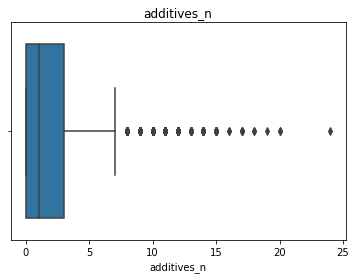

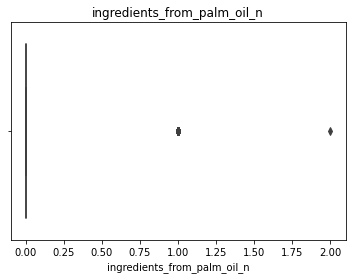

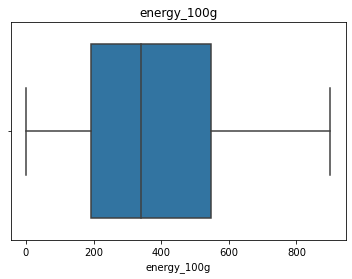

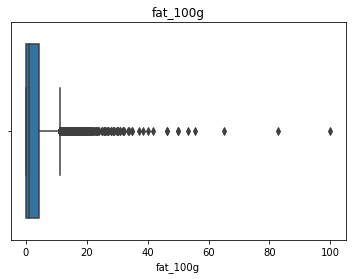

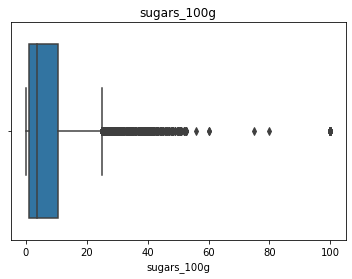

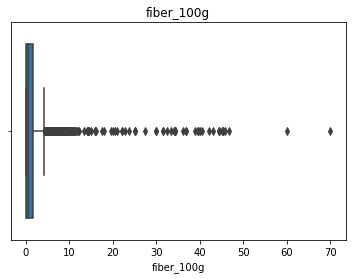

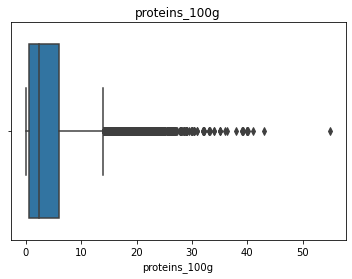

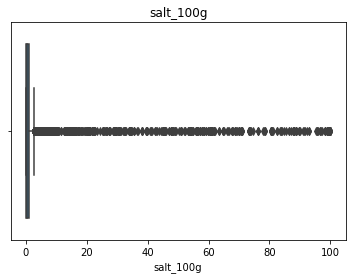

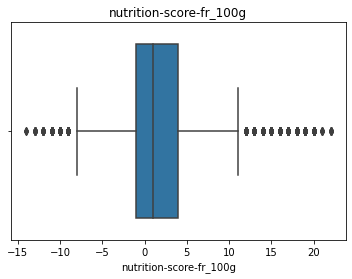

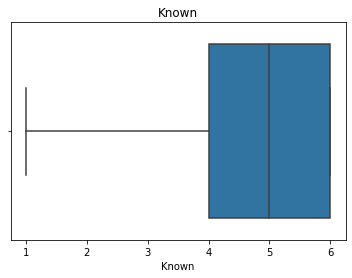

In [10]:
for k in Data.columns:
    if Data[k].dtypes == 'float64':
        sns.boxplot(x=k, data=Data)
        plt.title(k)
        plt.show()

On peut voir afficher des outliers, mais qui ne sont pas abbérents, car ils ont été filtré précedemment.

### Répartition du Nutriscore dans notre Jeu de données :

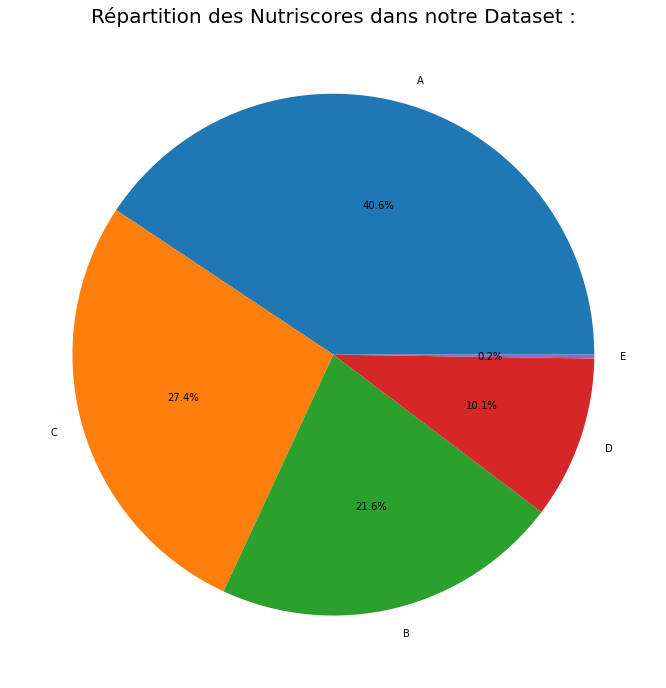

In [11]:
plt.figure(figsize=(12,12))

plt.title('Répartition des Nutriscores dans notre Dataset :', size=20)
wedges, texts, autotexts = plt.pie(Data['nutrition_grade_fr'].value_counts().values, 
        labels = Data['nutrition_grade_fr'].value_counts().index,
       autopct='%1.1f%%'
       )

On peut donc voir qu'une majorité de nos produits sont en catégorie A ou B donc c'est parfait.

#### Visualisation par pays :

### Countplot de visualisation des données :

#### Par pays :

In [12]:
DF_visu_pays = pd.DataFrame(data = Data.groupby("countries_fr").nutrition_grade_fr.value_counts())
DF_visu_pays.head(50)

nutrition_grade_fr
countries_fr                                       nutrition_grade_fr                    
Algérie,Belgique,Canada,France,Maroc,Suisse        C                                    1
Allemagne                                          A                                   64
                                                   B                                   51
                                                   C                                   36
                                                   D                                   36
                                                   E                                    1
Allemagne,Royaume-Uni                              A                                    1
Allemagne,Suisse                                   A                                   13
                                                   C                                    9
                                                   B                                    4
                                                   D                                    2
Allemagne,Suisse,Frankreich                        A                                    1
Andorre,Espagne                                    A                                    1
Australie                                          B                                    1
                                                   C                                    1
Autriche                                           C                                    1
Belgique                                           C                                   19
                                                   A                                    6
                                                   B                                    6
                                                   D                                    6
Belgique,France                                    A                                   14
                                                   C                                   13
                                                   B                                    7
                                                   D                                    2
Belgique,France,Allemagne,Italie,Pays-Bas,Espag... C                                    1
Belgique,France,Allemagne,Suisse                   B                                    1
Belgique,France,Espagne                            B                                    1
                                                   C                                    1
Belgique,France,La Réunion,Espagne,Suisse          C                                    1
Belgique,France,Luxembourg                         C                                    2
                                                   B                                    1
Belgique,France,Martinique,Suisse                  D                                    1
Belgique,France,Pays-Bas,Royaume-Uni               A                                    1
Belgique,France,Portugal                           D                                    1
Belgique,France,Royaume-Uni                        B                                    1
                                                   C                                    1
Belgique,France,Suisse                             A                                    3
                                                   C                                    2
                                                   D                                    1
Belgique,Pays-Bas                                  B                                    1
Belgique,Suisse                                    A                                    1
Brésil                                             A                                    1
Canada                                             A                                    2
                     

On peut voir qu'il y a des données pour lesquelles les produits se retrouvent dans plusieurs pays.

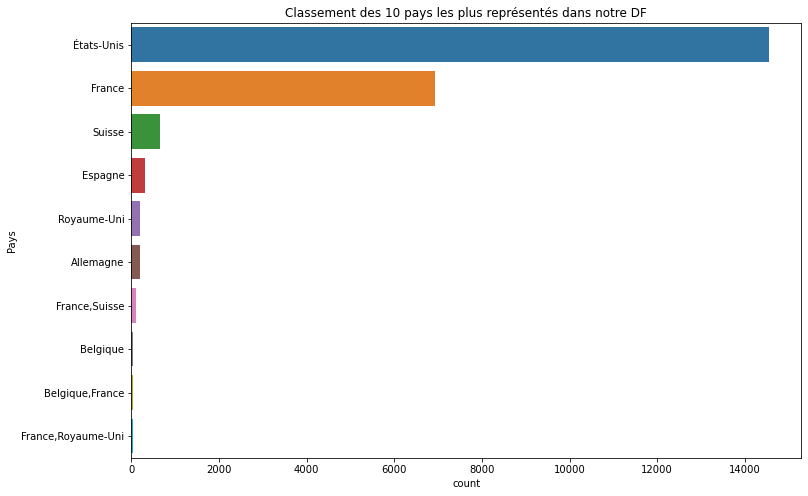

In [13]:
plt.figure(figsize=(12,8))
sns.countplot(y="countries_fr", data=Data, order=pd.value_counts(Data['countries_fr']).iloc[:10].index)
plt.ylabel("Pays")
plt.title("Classement des 10 pays les plus représentés dans notre DF")
plt.show()

On peut voir dans l'analyse que ce sont principalement des produits d'Europe, Suisse et des Etats-Unis.

#### Par product_name :

In [14]:
DF_visu_produit = pd.DataFrame(data = Data.groupby("product_name").nutrition_grade_fr.value_counts())
DF_visu_produit.head(50)

,,nutrition_grade_fr
product_name,nutrition_grade_fr,
100 % Pur Jus Pomme,A,1
Calamars à la Romaine surgelés,D,1
Clafoutis aux Cerises,C,1
Douceur du Matin,A,1
Knorr Suprême Rüebli Carotte à l'orange et aux croûtons Soupe,B,1
"Mixés, sans morceaux, fraise-framboise-cerise",C,1
"Poêlée aux marrons, pommes et figues, sauce miel - 4 épices",D,1
"0% Fat Greek Nonfat Yogurt, Strawberry Banana",D,1
"0% Fat Greek Nonfat Yogurt, Vanilla",D,1


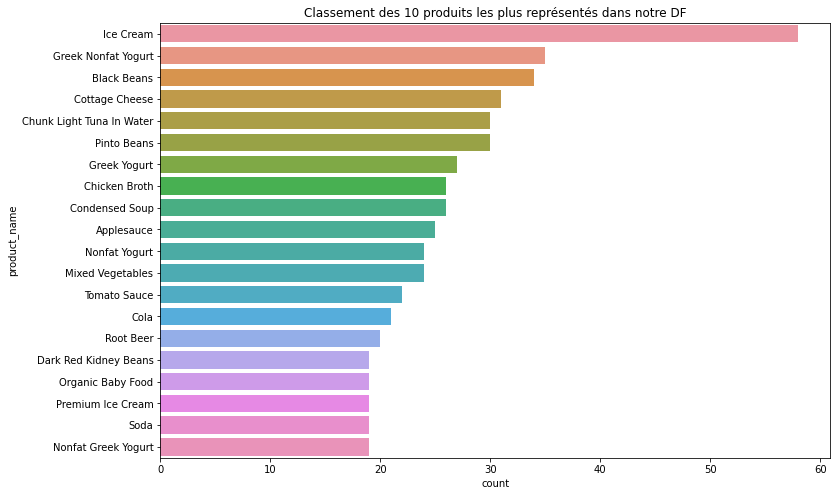

In [15]:
plt.figure(figsize=(12,8))
sns.countplot(y="product_name", data=Data, order=pd.value_counts(Data['product_name']).iloc[:20].index)
plt.ylabel("product_name")
plt.title("Classement des 10 produits les plus représentés dans notre DF")
plt.show()

#### Par brand :

In [16]:
DF_visu_marque = pd.DataFrame(data = Data.groupby("brands").nutrition_grade_fr.value_counts())
DF_visu_marque.head(50)

nutrition_grade_fr
brands                                    nutrition_grade_fr                    
Ahold                                     A                                  143
                                          B                                   91
                                          C                                   90
                                          D                                   60
                                          E                                    1
Aldi-Benner Company                       B                                   19
                                          C                                    7
                                          A                                    5
Alipende,//Propiedad de://,AhorraMas S.A. C                                   30
                                          A                                   23
                                          D                                    7
                                          B                                    6
Alnatura                                  A                                   44
                                          C                                   30
                                          D                                   24
                                          B                                   20
Amora                                     C                                    8
                                          A                                    7
                                          D                                    6
                                          B                                    5
Amy's                                     A                                   89
                                          C                                   60
                                          B                                   25
                                          D                                    2
Andros                                    A                                   85
                                          B                                   24
                                          C                                   18
                                          D                                    8
Anna's Best,Migros                        C                                   23
                                          A                                   22
                                          B                                   12
                                          D                                    6
Archer Farms                              A                                   51
                                          B                                   21
                                          C                                   20
                                          D                                   11
Arizona,  Ferolito Vultaggio & Sons       C                                   22
                                          A                                   17
                                          B                                   13
                                          D                                    1
Asda                                      C                                   24
                                          A                                   13
                                          B                                   12
                                          D                                    7
Auchan                                    A                                  238
                                          C                                  177
                                          B                                  125
                                          D                                   76
            

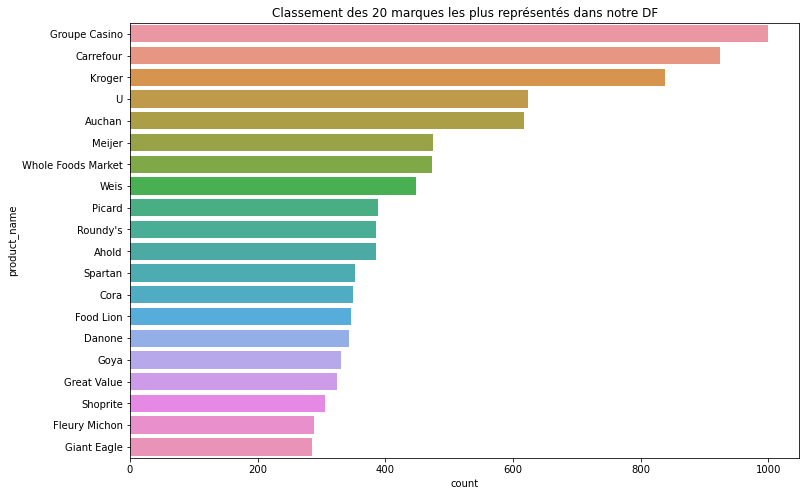

In [17]:
plt.figure(figsize=(12,8))
sns.countplot(y="brands", data=Data, order=pd.value_counts(Data['brands']).iloc[:20].index)
plt.ylabel("product_name")
plt.title("Classement des 20 marques les plus représentés dans notre DF")
plt.show()

On peut voir dans ce Top que la majorité vient de Grand Groupe de distribution.

#### Par groupe de produit :

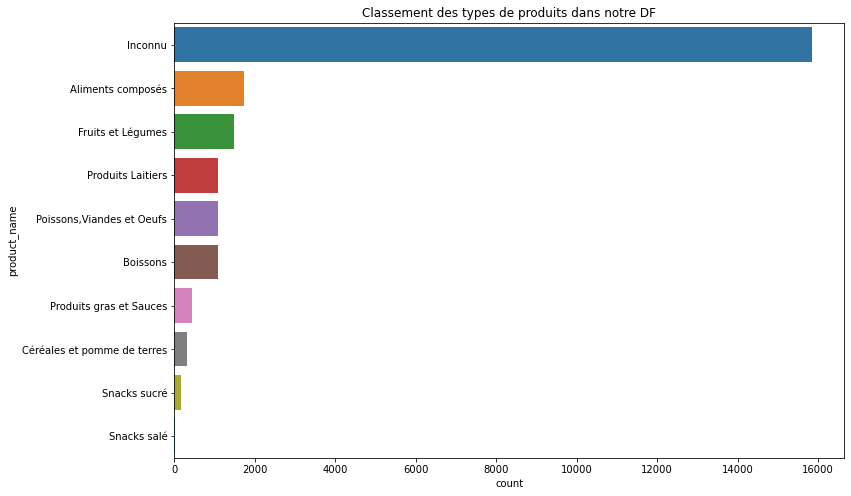

In [18]:
plt.figure(figsize=(12,8))
sns.countplot(y="pnns_groups_1", data=Data, order=pd.value_counts(Data['pnns_groups_1']).iloc[:10].index)
plt.ylabel("product_name")
plt.title("Classement des types de produits dans notre DF")
plt.show()

Inconnu corresponds à des données que nous ne possédons pas.

#### Par Nutriscore :

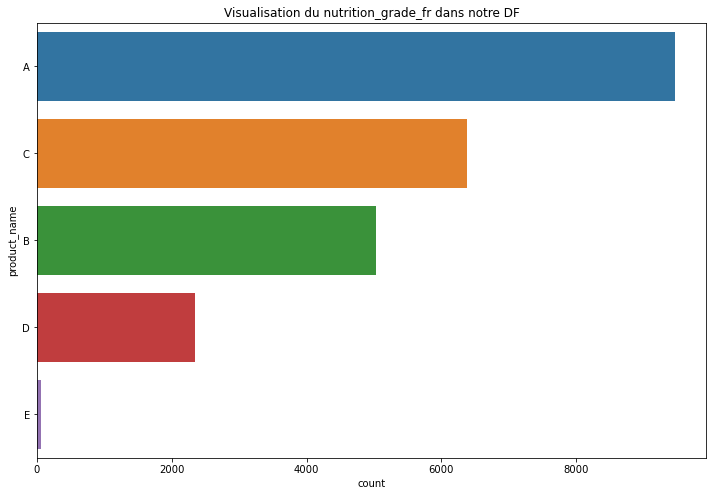

In [19]:
plt.figure(figsize=(12,8))
sns.countplot(y="nutrition_grade_fr", data=Data, order=pd.value_counts(Data['nutrition_grade_fr']).iloc[:20].index)
plt.ylabel("product_name")
plt.title("Visualisation du nutrition_grade_fr dans notre DF")
plt.show()

On a confirmation que la plupart des produits sont dans le nutriscore A B et C principalement.

## Test des hypothéses :

Pour nos tests, on va utiliser Pinguin qui nous permettra de faire nos test statistiques :

__Explication de Pinguin :__

Pingouin is an open-source statistical package written in Python 3 and based mostly on Pandas and NumPy. Some of its main features are listed below. For a full list of available functions, please refer to the API documentation.

ANOVAs: N-ways, repeated measures, mixed, ancova
Pairwise post-hocs tests (parametric and non-parametric) and pairwise correlations
Robust, partial, distance and repeated measures correlations
Linear/logistic regression and mediation analysis
Bayes Factors
Multivariate tests
Reliability and consistency
Effect sizes and power analysis
Parametric/bootstrapped confidence intervals around an effect size or a correlation coefficient
Circular statistics
Chi-squared tests
Plotting: Bland-Altman plot, Q-Q plot, paired plot, robust correlation…
Pingouin is designed for users who want simple yet exhaustive stats functions.

__Source :__

https://pingouin-stats.org

In [20]:
import pingouin as pg

### Test d'homoscédasticité :

L'homoscédasticité peut être vérifiée avec le test de :

- Levene (non sensible à la non-normalité )

- Barlett (à privilégier si la distribution est normale)

In [21]:
pg.homoscedasticity(Data, method='bartlett', alpha=0.05)# alpha = 0.05 pour vérifier l'hypothése

,T,pval,equal_var
bartlett,1.355965e+06,0.0,False


In [22]:
pg.homoscedasticity(Data, method='levene', alpha=0.05)# alpha = 0.05 pour vérifier l'hypothése

,W,pval,equal_var
levene,45028.557087,0.0,False


Ici, nous avons utilisé les 2 méthodes : Levene et bartlett, mais aucune n'est vérifié.

### QQ plot de visualisation :

Un graphique quantile-quantile est utilisé pour évaluer si nos données sont conformes ou non à une distribution particulière. Il peut être utilisé pour vérifier si l’ensemble de données donné est normalement distribué ou non.

##### Pour le nutri-score :

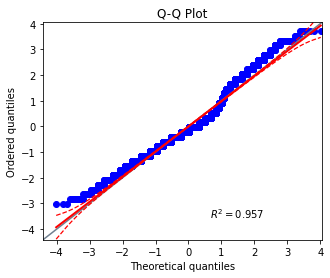

In [23]:
np.random.seed(1000)
x = np.random.normal(size=100)
ax = pg.qqplot(Data['nutrition-score-fr_100g'], dist='norm')

##### Pour les protéines :

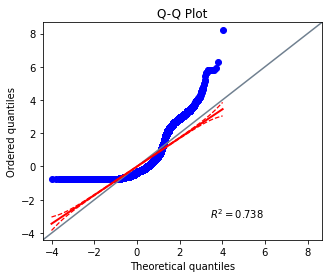

In [24]:
np.random.seed(1000)
x = np.random.normal(size=100)
ax = pg.qqplot(Data.proteins_100g, dist='norm')

##### Pour les fibres :

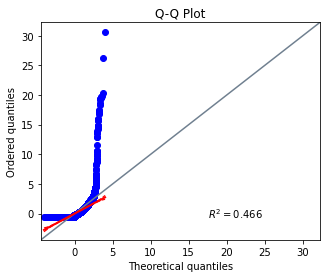

In [25]:
np.random.seed(1000)
x = np.random.normal(size=100)
ax = pg.qqplot(Data.fiber_100g, dist='norm')

##### Pour le sucre :

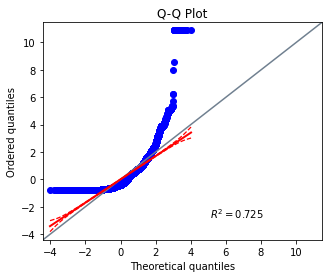

In [26]:
np.random.seed(1000)
x = np.random.normal(size=100)
ax = pg.qqplot(Data.sugars_100g, dist='norm')

##### Pour la graisse :

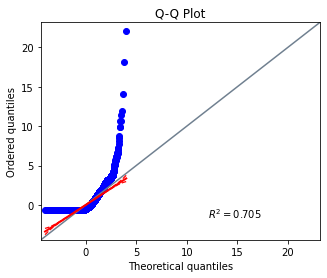

In [27]:
np.random.seed(1000)
x = np.random.normal(size=100)
ax = pg.qqplot(Data.fat_100g, dist='norm')

##### Pour le sel :

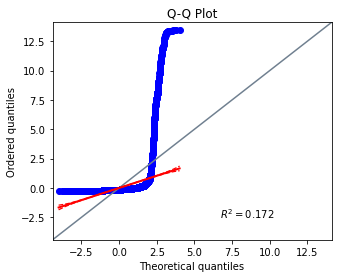

In [28]:
np.random.seed(1000)
x = np.random.normal(size=100)
ax = pg.qqplot(Data.salt_100g, dist='norm')

### Test de normalité  (colinéarité des variables) :

##### Test de normalité Shapiro :

In [29]:
print(f"C'est un test de normalité basé sur Shapiro :" )
pg.normality(Data, method='shapiro', alpha=0.05) # alpha = 0.05 pour vérifier l'hypothése

C'est un test de normalité basé sur Shapiro :


,W,pval,normal
additives_n,0.803727,0.0,False
ingredients_from_palm_oil_n,0.055982,0.0,False
energy_100g,0.955203,0.0,False
fat_100g,0.704903,0.0,False
sugars_100g,0.725585,0.0,False
fiber_100g,0.466851,0.0,False
proteins_100g,0.738210,0.0,False
salt_100g,0.171793,0.0,False
nutrition-score-fr_100g,0.957036,0.0,False
Known,0.845975,0.0,False


In [30]:
print(f"C'est un test de normalité basé sur l'Omnibus test :" )
pg.normality(Data, method='normaltest', alpha=0.05) # alpha = 0.05 pour vérifier l'hypothése

C'est un test de normalité basé sur l'Omnibus test :


,W,pval,normal
additives_n,7899.732087,0.0,False
ingredients_from_palm_oil_n,39010.432484,0.0,False
energy_100g,2293.348911,0.0,False
fat_100g,16353.632684,0.0,False
sugars_100g,16909.989585,0.0,False
fiber_100g,36625.942524,0.0,False
proteins_100g,8544.467746,0.0,False
salt_100g,34745.188189,0.0,False
nutrition-score-fr_100g,1740.831826,0.0,False
Known,2550.096725,0.0,False


##### test de normalité  jarque_bera

In [31]:
print(f"C'est un test de normalité basé sur Jarque Bera :" )
pg.normality(Data, method='jarque_bera', alpha=0.05) # alpha = 0.05 pour vérifier l'hypothése

C'est un test de normalité basé sur Jarque Bera :


,W,pval,normal
additives_n,2.781176e+04,0.0,False
ingredients_from_palm_oil_n,1.971048e+07,0.0,False
energy_100g,1.375757e+03,0.0,False
fat_100g,5.948605e+05,0.0,False
sugars_100g,4.624129e+05,0.0,False
fiber_100g,3.209178e+07,0.0,False
proteins_100g,2.677975e+04,0.0,False
salt_100g,9.877439e+06,0.0,False
nutrition-score-fr_100g,2.191913e+03,0.0,False
Known,3.484887e+03,0.0,False


Ici, nous avons utilisé les 3 méthodes : shapiro,normaltest,jarque_bera, mais aucune n'est vérifié.

In [32]:
import scipy.stats as stat

##### test de normalité d'Agostino

In [33]:
ag = stat.normaltest(Data.dtypes == 'float64')
print(f"C'est un test de normalité basé sur Agostino :" )
print("")
print(ag)
print("")
print(f"On réfute l'hypothése car la pvalue est quasi nulle.")


C'est un test de normalité basé sur Agostino :

NormaltestResult(statistic=13.158007349804285, pvalue=0.0013892327329830514)

On réfute l'hypothése car la pvalue est quasi nulle.


##### test d'adéquation d'Anderson-Darling

In [34]:
ad = stat.anderson(Data.dtypes == 'float64',dist="norm") # test possible pour autre loi que « norm »
print(f"C'est un test de normalité basé sur Anderson-Darling :" )
print("")
print(ad)
print("")
print(f"On réfute l'hypothése car la pvalue est quasi nulle.")

C'est un test de normalité basé sur Anderson-Darling :

AndersonResult(statistic=2.957294207368612, critical_values=array([0.5  , 0.569, 0.683, 0.797, 0.948]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

On réfute l'hypothése car la pvalue est quasi nulle.


Ici la p-value est à 0.5%

__ANOVA sommaire :__

'Source': Factor names

'SS': Sums of squares

'DF': Degrees of freedom

'MS': Mean squares

'F': F-values

'p-unc': uncorrected p-values

'np2': Partial eta-square effect sizes

In [35]:
print(f"Visu d'une ANOVA pour l'huile de palme et les additifs :")
print("")
aov = pg.anova(data=Data, dv='additives_n', between='ingredients_from_palm_oil_n', detailed=True)
aov

Visu d'une ANOVA pour l'huile de palme et les additifs :



,Source,SS,DF,MS,F,p-unc,np2
0,ingredients_from_palm_oil_n,314.244640,2,157.122320,29.144827,2.282426e-13,0.0025
1,Within,125391.311417,23259,5.391088,NaN,NaN,NaN


<AxesSubplot:>

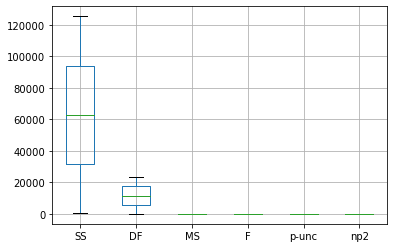

In [36]:
aov.boxplot()

In [37]:
print(f"Visu d'une ANOVA pour le Nutriscore et les additifs :")
print("")
aov = pg.anova(data=Data, dv='additives_n', between='nutrition-score-fr_100g', detailed=True)
aov

Visu d'une ANOVA pour le Nutriscore et les additifs :



,Source,SS,DF,MS,F,p-unc,np2
0,nutrition-score-fr_100g,7212.500045,38,189.802633,37.198691,1.166905e-263,0.057376
1,Within,118493.056012,23223,5.102401,NaN,NaN,NaN


P value quasi nulle TRACER UN GRAPH

# Analyses multivariés :

#### Automatisation de MANOVA :

In [38]:
def MANOVA(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT

# Formule eta_squared

### MANOVA +Boxplot :

#### nutrigrade et énergie :

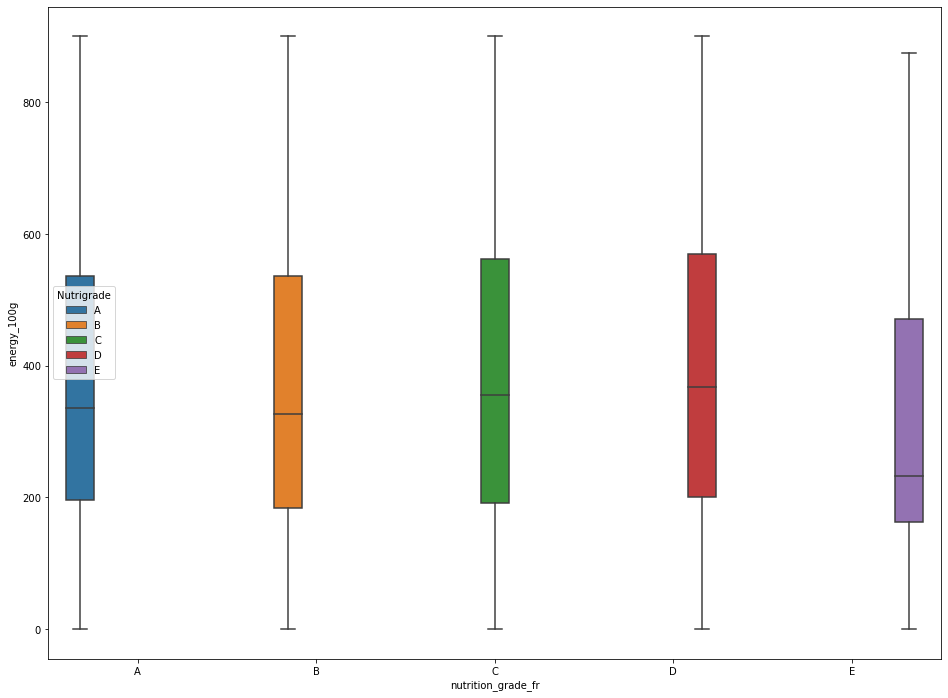

In [39]:
plt.figure(figsize=(16,12))
sns.boxplot(data=Data, x="nutrition_grade_fr", y="energy_100g", hue=Data.nutrition_grade_fr.tolist())
legend = plt.legend(title = "Nutrigrade",loc='best')

On peut voir ici que les produits énergétiques sont plutôt bien représenté pour le nutrigrade.

In [40]:
# Print du résultat de l'ANOVA
print("Le rapport de corrélation pour le nutrigrade et l'énergie est de",round(MANOVA(Data ['nutrition-score-fr_100g'],Data ['energy_100g']),2))

# Phrase explicative
print("Il y a une faible corrélation entre le nutrigrade et l'énergie")

Le rapport de corrélation pour le nutrigrade et l'énergie est de 0.14
Il y a une faible corrélation entre le nutrigrade et l'énergie


#### Nutrigrade et gras :

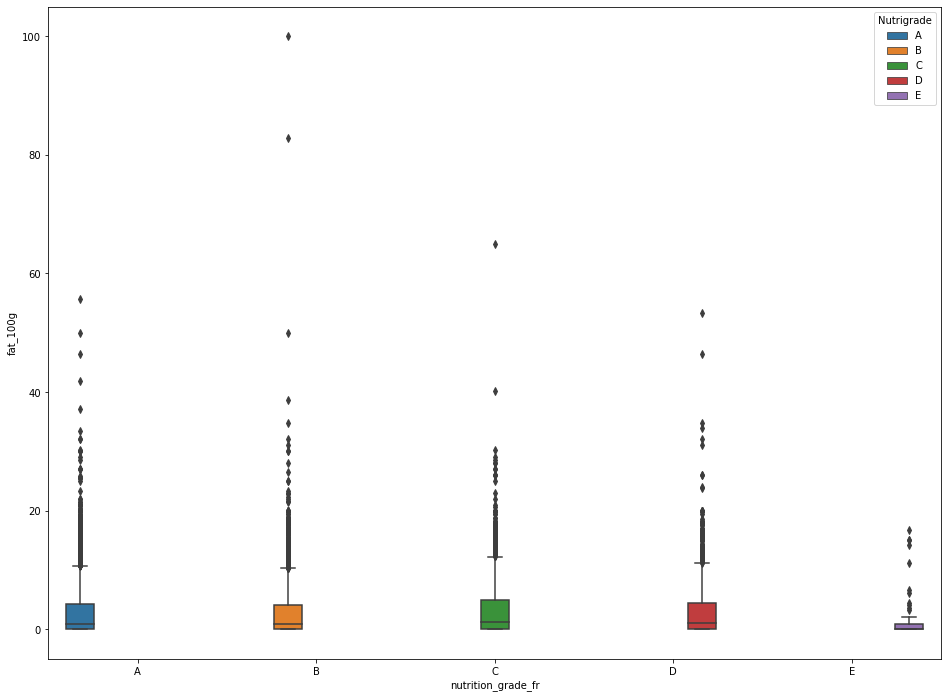

In [41]:
plt.figure(figsize=(16,12))
sns.boxplot(data=Data, x="nutrition_grade_fr", y="fat_100g", hue=Data.nutrition_grade_fr.tolist())
legend = plt.legend(title = "Nutrigrade",loc='best')

In [42]:
# Print du résultat de l'ANOVA
print(f'Le rapport de corrélation entre le nutrigrade et la graisse est de :',round(MANOVA(Data ['nutrition-score-fr_100g'],Data ['fat_100g']),2))

# Phrase explicative
print('Il y a une faible corrélation entre le nutrigrade et la graisse.')

Le rapport de corrélation entre le nutrigrade et la graisse est de : 0.12
Il y a une faible corrélation entre le nutrigrade et la graisse.


#### Nutrigrade et sucre :

<AxesSubplot:xlabel='nutrition_grade_fr', ylabel='sugars_100g'>

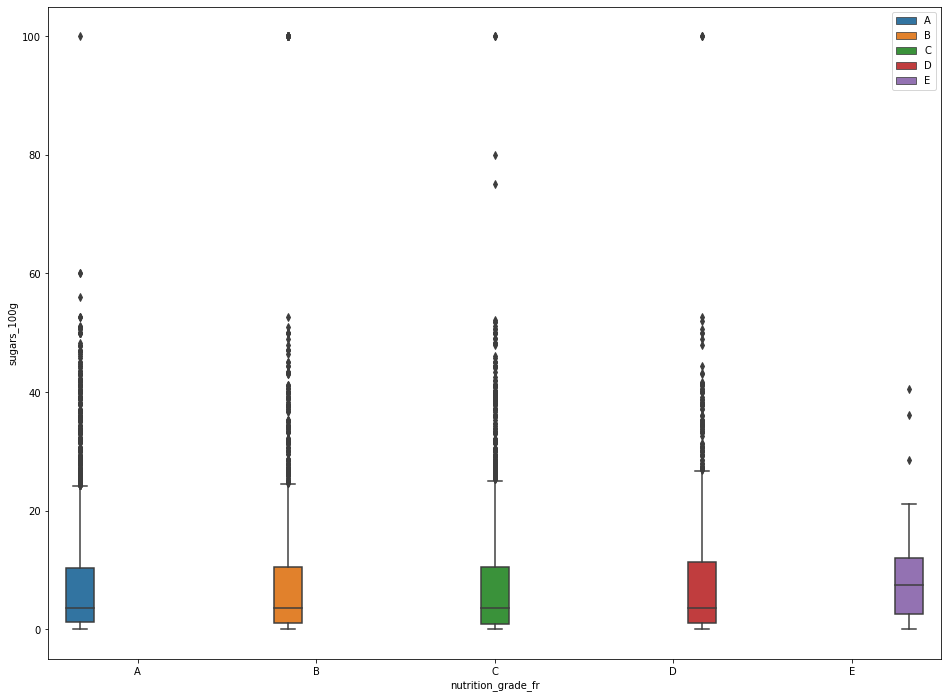

In [43]:
plt.figure(figsize=(16,12))
sns.boxplot(data=Data, x="nutrition_grade_fr", y="sugars_100g", hue=Data.nutrition_grade_fr.tolist())

In [44]:
# Print du résultat de l'ANOVA
print('Le rapport de corrélation pour le nutrigrade et le sucre est de :',round(MANOVA(Data ['nutrition-score-fr_100g'],Data ['sugars_100g']),2))

# Phrase explicative
print('Il existe une corrélation entre le nutrigrade et le sucre.')

Le rapport de corrélation pour le nutrigrade et le sucre est de : 0.1
Il existe une corrélation entre le nutrigrade et le sucre.


#### Nutrigrade et sel :

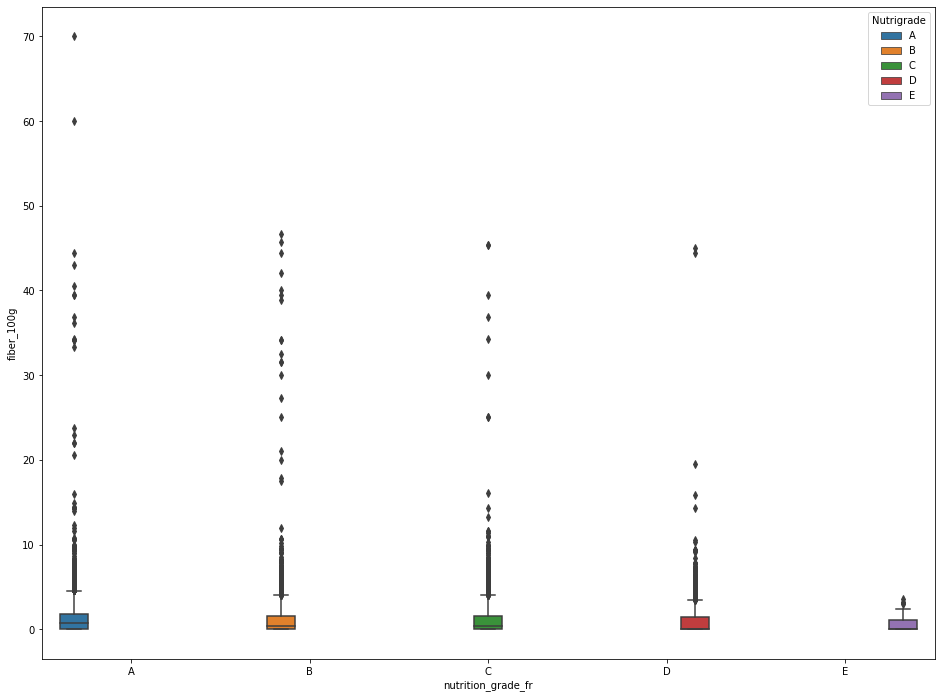

In [45]:
plt.figure(figsize=(16,12))
sns.boxplot(data=Data, x="nutrition_grade_fr", y="fiber_100g", hue=Data.nutrition_grade_fr.tolist())
legend = plt.legend(title = "Nutrigrade",loc='best')

In [46]:
# Print du résultat de l'ANOVA
print('Le rapport de corrélation pour les fibres et le nutrigrade est de :',round(MANOVA(Data ['nutrition-score-fr_100g'],Data ['fiber_100g']),2))

# Phrase explicative
print('Il existe une corrélation entre les fibres et le nutrigrade.')

Le rapport de corrélation pour les fibres et le nutrigrade est de : 0.17
Il existe une corrélation entre les fibres et le nutrigrade.


#### Nutrigrade et fibres :

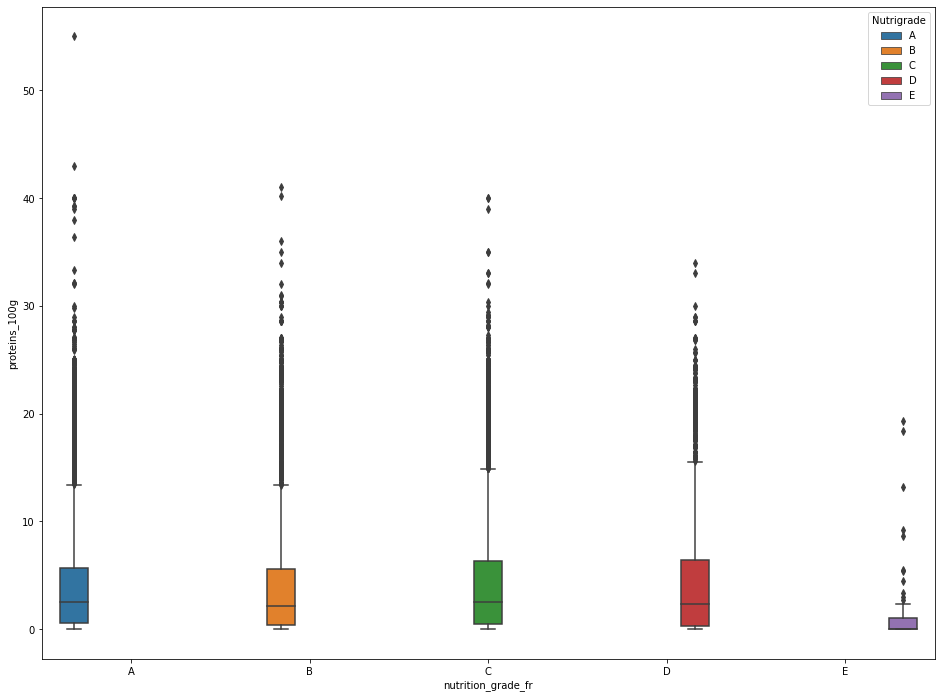

In [47]:
plt.figure(figsize=(16,12))
sns.boxplot(data=Data, x="nutrition_grade_fr", y="proteins_100g", hue=Data.nutrition_grade_fr.tolist())
legend = plt.legend(title = "Nutrigrade",loc='best')

In [48]:
# Print du résultat de l'ANOVA
print('Le rapport de corrélation pour le nutrigrade et les protéines est de :',round(MANOVA(Data ['nutrition-score-fr_100g'],Data ['proteins_100g']),2))

# Phrase explicative
print('Il y a donc pas de corrélation entre le nutrigrade et les protéines.')

Le rapport de corrélation pour le nutrigrade et les protéines est de : 0.05
Il y a donc pas de corrélation entre le nutrigrade et les protéines.


#### Nutrigrade et protéines :

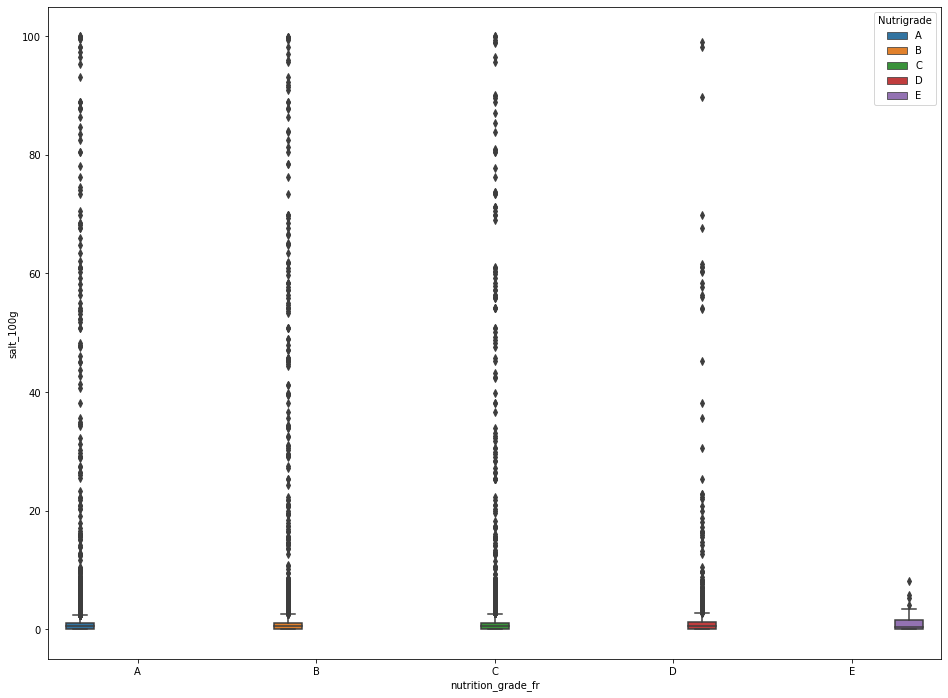

In [49]:
plt.figure(figsize=(16,12))
sns.boxplot(data=Data, x="nutrition_grade_fr", y="salt_100g", hue=Data.nutrition_grade_fr.tolist())
legend = plt.legend(title = "Nutrigrade",loc='best')

In [50]:
# Print du résultat de l'ANOVA
print('Le rapport de corrélation pour le nutrigrade et le sel est de :',round(MANOVA(Data ['nutrition-score-fr_100g'],Data ['salt_100g']),2))

# Phrase explicative
print('Il y a donc pas de corrélation entre le nutrigrade et le sel.')

Le rapport de corrélation pour le nutrigrade et le sel est de : 0.07
Il y a donc pas de corrélation entre le nutrigrade et le sel.


### Matrice de corrélation :

<AxesSubplot:>

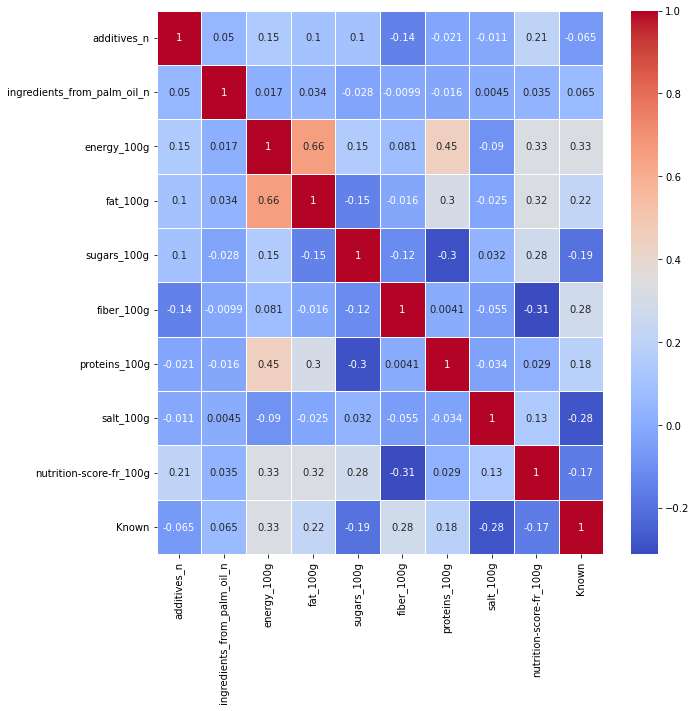

In [51]:
f, ax = plt.subplots(figsize=(10,10))
plt.xticks(rotation=45)
sns.heatmap(Data.corr(), annot = True,  linewidths = .5, ax = ax, cmap ='coolwarm')

___Forte corrélation entre  :___

- l'énergie et la graisse.

__Corrélation entre :__

-  le nutriscore et l'énergie
-  le nutriscore et les graisses
-  l'énergie et les protéines

__Faible corrélation entre :__

- Le nutriscore et le sucre
- La graisse et les protéines

En utilisant notre heatmap, nous allons afficher un lmplot pour visualiser les régressions.

## Visualisation des regressions qualitatives :

Les limites du lmplot se fera à partir des min(), max(), des données que nous utiliserons.

#### Visualisation de l'énergie sur la graisse :

In [52]:
"""
sns.lmplot(x="energy_100g", y="fat_100g", data=Data)
plt.title("lmplot entre l'énergie et les graisses")
plt.xlim(Data["energy_100g"].min(), Data["energy_100g"].max())
plt.ylim(Data["fat_100g"].min(), Data["fat_100g"].max())
plt.show()
"""

'\nsns.lmplot(x="energy_100g", y="fat_100g", data=Data)\nplt.title("lmplot entre l\'énergie et les graisses")\nplt.xlim(Data["energy_100g"].min(), Data["energy_100g"].max())\nplt.ylim(Data["fat_100g"].min(), Data["fat_100g"].max())\nplt.show()\n'

In [53]:
pg.linear_regression(X=Data["energy_100g"], y=Data["fat_100g"],alpha=0.05)

,names,coef,se,T,pval,r2,adj_r2,CI[2.5%],CI[97.5%]
0,Intercept,-1.646155,0.041229,-39.926941,0.0,0.429243,0.429219,-1.726967,-1.565343
1,energy_100g,0.012151,0.000092,132.260792,0.0,0.429243,0.429219,0.011971,0.012331


#### Visualisation du nutriscore sur l'énergie :

In [54]:
"""
sns.lmplot(x="energy_100g", y="nutrition-score-fr_100g", data=Data)
plt.title("lmplot entre l'énergie en Kcal et le nutriscore")
plt.xlim(Data["energy_100g"].min(), Data["energy_100g"].max())
plt.ylim(Data["nutrition-score-fr_100g"].min(), Data["nutrition-score-fr_100g"].max())
plt.show()
"""

'\nsns.lmplot(x="energy_100g", y="nutrition-score-fr_100g", data=Data)\nplt.title("lmplot entre l\'énergie en Kcal et le nutriscore")\nplt.xlim(Data["energy_100g"].min(), Data["energy_100g"].max())\nplt.ylim(Data["nutrition-score-fr_100g"].min(), Data["nutrition-score-fr_100g"].max())\nplt.show()\n'

In [55]:
pg.linear_regression(X=Data["energy_100g"], y=Data["nutrition-score-fr_100g"],alpha=0.05)

,names,coef,se,T,pval,r2,adj_r2,CI[2.5%],CI[97.5%]
0,Intercept,-0.637458,0.062637,-10.177088,2.821550e-24,0.105687,0.105648,-0.760229,-0.514686
1,energy_100g,0.007318,0.000140,52.428817,0.000000e+00,0.105687,0.105648,0.007044,0.007591


#### Visualisation du nutriscore et des graisses :

In [56]:
"""
sns.lmplot(x="fat_100g", y="nutrition-score-fr_100g", data=Data)
plt.title("lmplot entre les graisses et le nutriscore")
plt.xlim(Data["fat_100g"].min(), Data["fat_100g"].max())
plt.ylim(Data["nutrition-score-fr_100g"].min(), Data["nutrition-score-fr_100g"].max())
plt.show()
"""

'\nsns.lmplot(x="fat_100g", y="nutrition-score-fr_100g", data=Data)\nplt.title("lmplot entre les graisses et le nutriscore")\nplt.xlim(Data["fat_100g"].min(), Data["fat_100g"].max())\nplt.ylim(Data["nutrition-score-fr_100g"].min(), Data["nutrition-score-fr_100g"].max())\nplt.show()\n'

In [57]:
pg.linear_regression(X=Data["fat_100g"], y=Data["nutrition-score-fr_100g"],alpha=0.05)

,names,coef,se,T,pval,r2,adj_r2,CI[2.5%],CI[97.5%]
0,Intercept,0.973821,0.040022,24.332127,3.688772e-129,0.10554,0.105501,0.895375,1.052267
1,fat_100g,0.394287,0.007526,52.388095,0.000000e+00,0.10554,0.105501,0.379535,0.409039


#### Visualisation de l'énergie et des protéines  :

In [58]:
"""
sns.lmplot(x="energy_100g", y="proteins_100g", data=Data)
plt.title("lmplot entre les graisses et le nutriscore")
plt.xlim(Data["energy_100g"].min(), Data["energy_100g"].max())
plt.ylim(Data["proteins_100g"].min(), Data["proteins_100g"].max())
plt.show()
"""

'\nsns.lmplot(x="energy_100g", y="proteins_100g", data=Data)\nplt.title("lmplot entre les graisses et le nutriscore")\nplt.xlim(Data["energy_100g"].min(), Data["energy_100g"].max())\nplt.ylim(Data["proteins_100g"].min(), Data["proteins_100g"].max())\nplt.show()\n'

In [59]:
pg.linear_regression(X=Data["proteins_100g"], y=Data["energy_100g"],alpha=0.05)

,names,coef,se,T,pval,r2,adj_r2,CI[2.5%],CI[97.5%]
0,Intercept,300.015723,1.739403,172.482021,0.0,0.203881,0.203847,296.606378,303.425067
1,proteins_100g,17.504816,0.226805,77.179941,0.0,0.203881,0.203847,17.060263,17.949370


Pvalue = 0

Ce n'est pas une corrélation linéaire.

## Test de normalité :

#### Entre les additifs et les ingrédients avec huile de palme :

In [60]:
pg.multivariate_normality((Data[['additives_n', 'ingredients_from_palm_oil_n']]), alpha=0.05) # alpha = 0.05 pour vérifier l'hypothése

HZResults(hz=4682.377653666812, pval=0.0, normal=False)

In [61]:
#sns.jointplot(data=Data, x='additives_n', y='ingredients_from_palm_oil_n', kind='reg')

L'hypothése est fausse.

#### Entre les graisses et les ingrédients avec huile de palme :

In [62]:
pg.multivariate_normality((Data[['fat_100g', 'ingredients_from_palm_oil_n']]), alpha=0.05) # alpha = 0.05 pour vérifier l'hypothése

HZResults(hz=6827.810965219764, pval=0.0, normal=False)

In [63]:
#sns.jointplot(data=Data, x='fat_100g', y='ingredients_from_palm_oil_n', kind='reg')

L'hypothése est fausse.

#### Entre le nutriscore et les ingrédients avec huile de palme :

In [64]:
pg.multivariate_normality((Data[['nutrition-score-fr_100g', 'ingredients_from_palm_oil_n']]), alpha=0.05) # alpha = 0.05 pour vérifier l'hypothése

HZResults(hz=3416.520259160847, pval=0.0, normal=False)

In [65]:
#sns.jointplot(data=Data, x='nutrition-score-fr_100g', y='ingredients_from_palm_oil_n', kind='reg')

L'hypothése est fausse.

#### Entre les additifs et le nutriscore :

In [66]:
pg.multivariate_normality((Data[['additives_n', 'nutrition-score-fr_100g']]), alpha=0.05) # alpha = 0.05 pour vérifier l'hypothése

HZResults(hz=440.7017195801215, pval=1.0272075040505612e-286, normal=False)

In [67]:
#sns.jointplot(data=Data, x='nutrition-score-fr_100g', y='additives_n', kind='reg')

L'hypothése est fausse.

### Pairplot produit avec/sans huile de palme :

In [68]:
#sns.pairplot(Data , hue='ingredients_from_palm_oil_n', corner=True, height=5, diag_kind="hist")
#plt.show()

## ACP :

In [69]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler # classe pour standardisation
from sklearn import preprocessing
from sklearn import decomposition

In [70]:
Data.dtypes

url                             object
product_name                    object
brands                          object
countries_fr                    object
pnns_groups_1                   object
additives_n                    float64
ingredients_from_palm_oil_n    float64
energy_100g                    float64
fat_100g                       float64
sugars_100g                    float64
fiber_100g                     float64
proteins_100g                  float64
salt_100g                      float64
nutrition-score-fr_100g        float64
Known                          float64
nutrition_grade_fr              object
dtype: object

#### Standardisation et transformation de Data en Z_scaled :

In [71]:
Data_ACP = Data.select_dtypes(include='float64')
Data_ACP

,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known
0,0.0,0.0,144.0,0.90,2.50,1.8,3.60,0.00000,-4.333333,5.0
1,0.0,0.0,75.0,0.00,25.00,0.0,0.00,3.08356,-3.555556,2.0
2,2.0,0.0,79.0,0.00,3.08,0.8,0.77,0.56642,1.000000,5.0
3,2.0,0.0,427.0,6.78,4.24,1.7,1.69,1.50622,4.000000,6.0
4,2.0,0.0,372.0,3.80,0.00,1.3,8.86,0.00000,-5.000000,4.0
...,...,...,...,...,...,...,...,...,...,...
23257,2.0,0.0,307.0,4.80,4.40,0.5,1.20,0.77000,3.000000,6.0
23258,3.0,0.0,586.0,0.60,26.00,0.0,0.80,1.70000,13.000000,5.0
23259,5.0,0.0,787.0,12.20,0.10,0.0,11.10,1.90000,13.000000,5.0
23260,7.0,0.0,197.0,0.00,0.10,3.1,3.12,0.39624,13.000000,4.0


Cette fonction provient d'un cours OpenClassrooms et qui permet de créer une ACP à partir de fonction automatisée. Parfait pour nous !

__Source :__
https://openclassrooms.com/fr/courses/4525281-realisez-une-analyse-exploratoire-de-donnees/5345201-tp-realisez-une-acp

In [72]:
from matplotlib.collections import LineCollection


def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks: # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(7,6))

            # détermination des limites du graphique
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                   pcs[d1,:], pcs[d2,:], 
                   angles='xy', scale_units='xy', scale=1, color="grey")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            
            # affichage des noms des variables  
            if labels is not None:  
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', rotation=label_rotation, color="blue", alpha=0.5)
            
            # affichage du cercle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)
        
            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
        
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # initialisation de la figure       
            fig = plt.figure(figsize=(7,6))
        
            # affichage des points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # affichage des labels des points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)

def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)

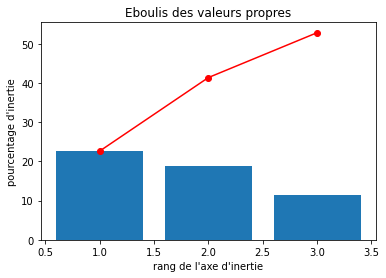

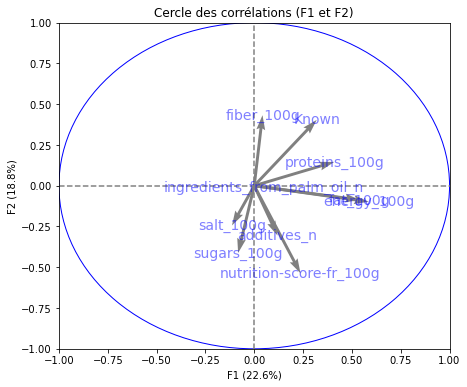

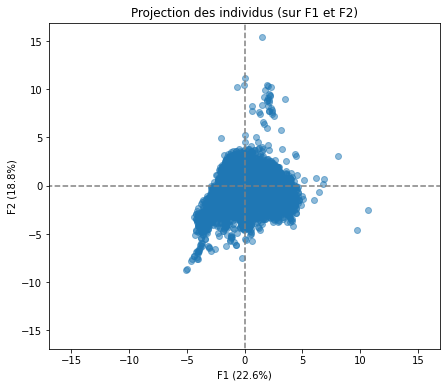

In [73]:
import pandas as pd
import numpy as np
from sklearn import decomposition
from sklearn import preprocessing 

# choix du nombre de composantes à calculer
n_comp = 3

# préparation des données pour l'ACP
X = Data_ACP.values
features = Data_ACP.columns

# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

# Calcul des composantes principales
pca = decomposition.PCA(n_components=n_comp)
pca.fit(X_scaled)

# Eboulis des valeurs propres
display_scree_plot(pca)

# Cercle des corrélations
pcs = pca.components_
display_circles(pcs, n_comp, pca, [(0,1),(2,3),(4,5)], labels = np.array(features))

# Projection des individus
X_projected = pca.transform(X_scaled)
display_factorial_planes(X_projected, n_comp, pca, [(0,1),(2,3),(4,5)], alpha = 0.5)

plt.show()

In [74]:
print(f'La variance de la PCA est de',pca.explained_variance_ratio_*100, '%')
print(f'La somme de la variance de la PCA est de',round(pca.explained_variance_ratio_.sum()*100,2),'%')

La variance de la PCA est de [22.63364351 18.76026163 11.44833384] %
La somme de la variance de la PCA est de 52.84 %


Avec Ncomp = 3, on atteint donc 57% de variance expliquée.

On crée également un DF pour montrer visuellement dans un tableau l'éboulis.

In [75]:
PCA_DF_var= pd.DataFrame(
    {
        "Dimension" : ["Dim" + str(x + 1) for x in range(3)], 
        "Valeur propre" : pca.explained_variance_ratio_,
        "% variance expliquée" : np.round(pca.explained_variance_ratio_ * 100),
        "% cumsum variance expliquée" : np.round(np.cumsum(pca.explained_variance_ratio_) * 100)
    },
    columns = ["Dimension", "Valeur propre", "% variance expliquée", "% cumsum variance expliquée"]
)
PCA_DF_var

,Dimension,Valeur propre,% variance expliquée,% cumsum variance expliquée
0,Dim1,0.226336,23.0,23.0
1,Dim2,0.187603,19.0,41.0
2,Dim3,0.114483,11.0,53.0


On crée également un graphique plus précis que le graphique automatisé.

Text(0.5, 0.98, 'Variance expliquée par dimension')

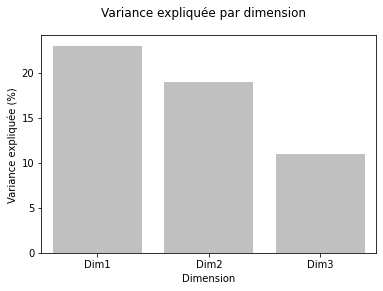

In [76]:
PCA_DF_var_graph = sns.barplot(x = "Dimension", 
                y = "% variance expliquée",
                palette = ["Silver"],
                data = PCA_DF_var)
PCA_DF_var_graph.set(ylabel = "Variance expliquée (%)")
PCA_DF_var_graph.figure.suptitle("Variance expliquée par dimension")

#### Transformation de X_projected en DF :

In [77]:
pd.DataFrame(X_projected)

,0,1,2
0,-1.147006,1.504036,0.216073
1,-2.653399,-1.056141,-0.332696
2,-1.301563,0.443130,-0.043476
3,0.815535,0.274026,-0.331151
4,-0.028491,1.002628,0.778219
...,...,...,...
23257,0.186450,0.237263,-0.291107
23258,0.354799,-2.411794,-1.676305
23259,3.313683,-1.501464,0.673693
23260,-0.230060,-1.122659,-0.228169


#### Visualisation des composantes de l'ACP sur un Scatterplot :

In [78]:
fig =  px.scatter( x= X_projected[:,0], y = X_projected[:,1])
fig.update_layout(width=800, height=800, title = 'Composante 1 et 2',
                  xaxis=dict(title='1ere composante à 27%'),
                  yaxis=dict(title='2eme composante à 18%')
                           )

Au vu des changements effectués dans mon nettoyage, ma régression Linéaire n'a plus lieu d'être.

## Régression Linéaire Multiple :

In [79]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [80]:
x = Data.select_dtypes(include='float64')
y = Data['nutrition-score-fr_100g']
xtrain, xtest, ytrain, ytest = train_test_split(x, y, train_size = 0.8 ,random_state = 1 )

In [81]:
lr = LinearRegression().fit(xtrain, ytrain)
print("R² sur le score d'entraînement : ", round(lr.score(xtrain,ytrain),2))
print("R² sur le score de test", round(lr.score(xtest,ytest),2))
print("Coefficient de chaque variable dans la régression Linéaire",lr.coef_)
print('Interception dans la regression Linéaire', lr.intercept_)

R² sur le score d'entraînement :  1.0
R² sur le score de test 1.0
Coefficient de chaque variable dans la régression Linéaire [ 1.52274625e-14  3.23838178e-14 -5.55111512e-17  9.51766877e-16
  1.22796738e-15  2.16677804e-16  4.14056810e-16  3.35994253e-16
  1.00000000e+00  8.90265509e-17]
Interception dans la regression Linéaire -2.1316282072803006e-14


La regression nous montre que l'équation de la droite de régression n'est pas capable de déterminer 100 % de la distribution des points.

In [82]:
lr = LinearRegression().fit(xtrain, ytrain)
lr.fit(xtrain, ytrain)
lr.score(xtrain, ytrain)

1.0

In [83]:
print('Test Score :',round(lr.score(xtest, ytest)*100,2))
print('Train Score :',round(lr.score(xtrain, ytrain)*100,2))

Test Score : 100.0
Train Score : 100.0


Les scores sont bons.

#### Testons les prédictions :

In [84]:
Visu = pd.DataFrame({'Nutriscore_DF' : ytest, 'prediction' : lr.predict(xtest)}).reset_index()
Visu

,index,Nutriscore_DF,prediction
0,10622,1.0,1.000000e+00
1,4391,-2.0,-2.000000e+00
2,9013,1.0,1.000000e+00
3,1657,0.0,7.681462e-15
4,16317,-4.0,-4.000000e+00
...,...,...,...
4648,8866,-5.0,-5.000000e+00
4649,11329,10.0,1.000000e+01
4650,20722,-5.0,-5.000000e+00
4651,6068,-3.0,-3.000000e+00


On a confirmation qu'entre le nutriscore réel et ce qu'on a dans notre DF, il y a des differences.

#### Displot de la visu Régression Linéaire entre la prédiction et la réalité :

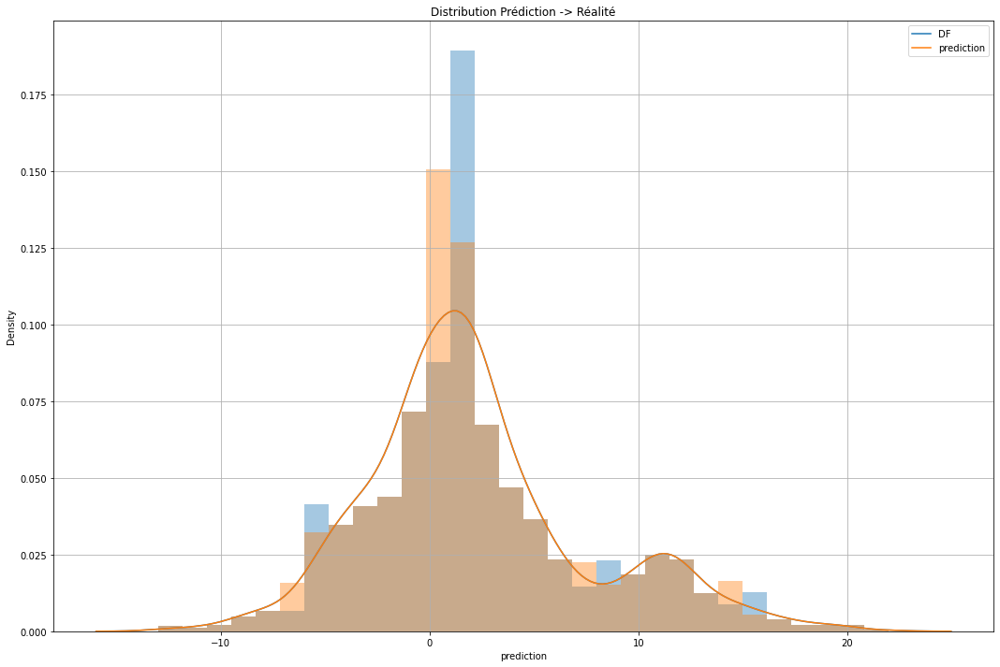

In [85]:
plt.figure(figsize=(18,12))
plt.title('Distribution Prédiction -> Réalité')
sns.distplot(Visu['Nutriscore_DF'], bins=30)
sns.distplot(Visu['prediction'], bins = 30)
plt.grid(True)
plt.legend(['DF', 'prediction'])

Les 2 sont étroitements liés.

## Visualisation sur le top des marques par critéres :

## Critére Label Organic : 

In [86]:
Organic = Data[Data['product_name'].str.contains('Organic')]
Organic

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr
140,http://world-fr.openfoodfacts.org/produit/0011...,Organic Broccoli Florets,Simple Truth Organic,États-Unis,Inconnu,0.0,0.0,192.0,0.00,11.25,0.0,0.00,0.03810,2.0,3.0,A
442,http://world-fr.openfoodfacts.org/produit/0011...,Diced Pears In Organic Pear Juice From Concent...,Simple Truth Organic,États-Unis,Inconnu,0.0,0.0,71.0,0.00,1.67,1.7,0.83,0.84582,1.0,5.0,A
675,http://world-fr.openfoodfacts.org/produit/0011...,Organic Pinto Beans,Simple Truth Organic,États-Unis,Inconnu,6.0,0.0,540.0,11.29,3.23,0.0,1.61,1.31064,7.0,5.0,A
933,http://world-fr.openfoodfacts.org/produit/0011...,Organic Tofu Extra Firm,Simple Truth Organic,États-Unis,Inconnu,3.0,0.0,452.0,1.54,16.92,0.8,1.54,0.41148,5.0,6.0,B
934,http://world-fr.openfoodfacts.org/produit/0011...,"Organic Medium Salsa, Medium",Simple Truth Organic,États-Unis,Inconnu,1.0,0.0,297.0,0.29,0.00,0.0,15.29,0.77724,-2.0,4.0,C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21737,http://world-fr.openfoodfacts.org/produit/5051...,Organic Baby Tomato & Kale Salad,Fresh & Easy,États-Unis,Inconnu,4.0,0.0,688.0,7.50,2.20,0.0,3.20,0.82600,-1.0,4.0,A
21788,http://world-fr.openfoodfacts.org/produit/5052...,Organic baked beans,Tesco,Royaume-Uni,Inconnu,10.0,1.0,642.0,6.20,4.30,0.9,5.30,1.32000,4.0,6.0,C
22037,http://world-fr.openfoodfacts.org/produit/6882...,Organic Celery Hearts,Ahold,États-Unis,Inconnu,2.0,0.0,410.0,0.50,22.00,0.9,0.50,1.10000,-4.0,5.0,B
22045,http://world-fr.openfoodfacts.org/produit/6882...,Organic Original Barbecue Sauce,Ahold,États-Unis,Inconnu,0.0,0.0,293.0,0.50,0.00,2.0,2.00,0.00000,-8.0,4.0,B


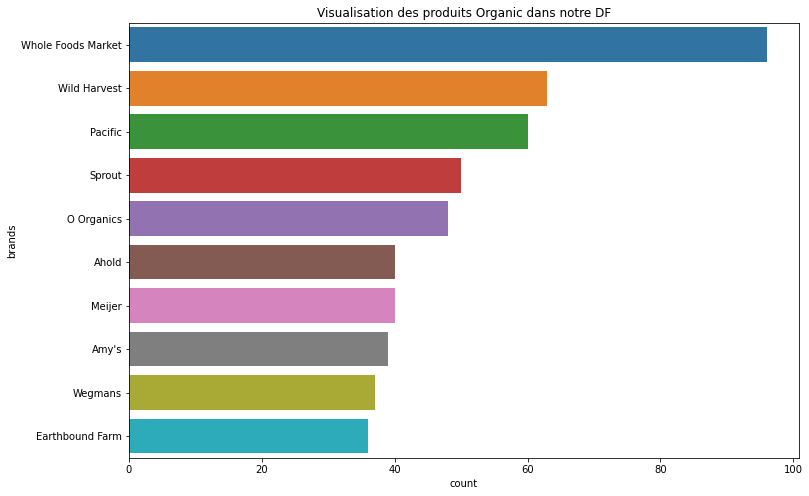

In [87]:
plt.figure(figsize=(12,8))
sns.countplot(y="brands", data=Organic, order=pd.value_counts(Organic['brands']).iloc[:10].index)
plt.ylabel("brands")
plt.title("Visualisation des produits Organic dans notre DF")
plt.show()

Il n'y a que ses marques qui proposent des produits Organic.

#### Pourcentage de produits dits 'Organic' :

In [88]:
print(f'Le pourcentage de produits avec le label Organic dans le total des produits de la marque 365 Everyday Value est : ',round(Organic[Organic['brands']== '365 Everyday Value'].count().sum() / Data.brands.count().sum()*100,2)  ,'%')
print(f'Le pourcentage de produits avec le label Organic dans le total des produits de la marque Wild Harvest est :',round(Organic[Organic['brands']== 'Wild Harvest'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits avec le label Organic dans le total des produits de la marque Pacific est :',round(Organic[Organic['brands']== 'Pacific'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits avec le label Organic dans le total des produits de la marque Sprout est :',round(Organic[Organic['brands']== 'Sprout'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits avec le label Organic dans le total des produits de la marque O Organics est :',round(Organic[Organic['brands']== 'O Organics'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits avec le label Organic dans le total des produits de la marque Meijer est :',round(Organic[Organic['brands']== 'Meijer'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits avec le label Organic dans le total des produits de la marque Ahold est :',round(Organic[Organic['brands']== 'Ahold'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f"Le pourcentage de produits avec le label Organic dans le total des produits de la marque Amy's est :",round(Organic[Organic['brands']== "Amy's"].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f"Le pourcentage de produits avec le label Organic dans le total des produits de la marque Wegmans est :",round(Organic[Organic['brands']== "Wegmans"].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits avec le label Organic dans le total des produits de la marque Earthbound Farm est :',round(Organic[Organic['brands']== 'Earthbound Farm'].count().sum() / Data.brands.count().sum()*100,2),'%')

Le pourcentage de produits avec le label Organic dans le total des produits de la marque 365 Everyday Value est :  0.0 %
Le pourcentage de produits avec le label Organic dans le total des produits de la marque Wild Harvest est : 4.33 %
Le pourcentage de produits avec le label Organic dans le total des produits de la marque Pacific est : 4.13 %
Le pourcentage de produits avec le label Organic dans le total des produits de la marque Sprout est : 3.44 %
Le pourcentage de produits avec le label Organic dans le total des produits de la marque O Organics est : 3.3 %
Le pourcentage de produits avec le label Organic dans le total des produits de la marque Meijer est : 2.75 %
Le pourcentage de produits avec le label Organic dans le total des produits de la marque Ahold est : 2.75 %
Le pourcentage de produits avec le label Organic dans le total des produits de la marque Amy's est : 2.68 %
Le pourcentage de produits avec le label Organic dans le total des produits de la marque Wegmans est : 2.54 

On peut donc voir ici les marques les plus interessantes pour le Label Organic.

In [89]:
print(f'Le pourcentage de produit avec le label Organic est de :', round(Organic.product_name.count().sum() / Data.product_name.count().sum()*100,2), '%')

Le pourcentage de produit avec le label Organic est de : 4.5 %


C'est donc un chiffre relativement faible pour notre Analyse.

## Par critére BIO : 

In [90]:
# On renomme les produits pour le bio.
Data = Data.replace({ 
    "bio" : "BIO",
})

In [91]:
Data_Bio = Data[Data['product_name'].str.contains("Bio")]
Data_bio = Data[Data['product_name'].str.contains("bio")]
BIO = pd.merge(Data_Bio, Data_bio,
                   how='outer')
BIO

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr
0,http://world-fr.openfoodfacts.org/produit/0024...,Purée Tradition Bio,Del Monte,France,Produits gras et Sauces,2.0,0.0,201.0,0.00,9.68,0.8,0.81,0.01016,1.0,5.0,A
1,http://world-fr.openfoodfacts.org/produit/2000...,Saveurs Bio au Chaudron Friases Pommes,Lucien Georgelin,France,Fruits et Légumes,0.0,0.0,359.0,1.30,13.00,0.0,3.50,0.14000,1.0,5.0,C
2,http://world-fr.openfoodfacts.org/produit/2019...,Bio Frische fettarme Milch,Milbona,Allemagne,Produits Laitiers,0.0,0.0,267.0,3.50,4.80,0.0,3.30,0.13000,1.0,5.0,A
3,http://world-fr.openfoodfacts.org/produit/2024...,Bio Frische Voll-Milch,Milbona,Allemagne,Produits Laitiers,0.0,0.0,457.0,2.11,9.59,0.0,19.10,0.12200,-1.0,5.0,A
4,http://world-fr.openfoodfacts.org/produit/2072...,Bio Speisequark Zubereitung Magerstufe,Milbona,Allemagne,Produits Laitiers,0.0,0.0,201.0,0.00,4.80,0.0,7.30,0.10000,-3.0,4.0,B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299,http://world-fr.openfoodfacts.org/produit/4104...,Jus de pomme bio non filtré,Alnatura,Suisse,Boissons,0.0,0.0,451.0,4.70,12.00,0.7,3.70,0.10000,4.0,6.0,C
300,http://world-fr.openfoodfacts.org/produit/4104...,Boisson bio à base d'épeautre non sucrée Sans ...,Alnatura,Suisse,Inconnu,3.0,0.0,519.0,5.30,14.00,0.0,5.00,0.20000,4.0,5.0,C
301,http://world-fr.openfoodfacts.org/produit/4104...,sauce tomate bio au piment piquante,Alnatura,Suisse,Inconnu,0.0,0.0,227.0,1.50,4.90,0.0,5.20,0.10000,-2.0,5.0,A
302,http://world-fr.openfoodfacts.org/produit/6238...,"100 % pur fruit pressé, Jus de pomme bio",Carrefour,France,Boissons,0.0,0.0,201.0,0.00,13.70,0.9,5.40,0.20000,3.0,4.0,A


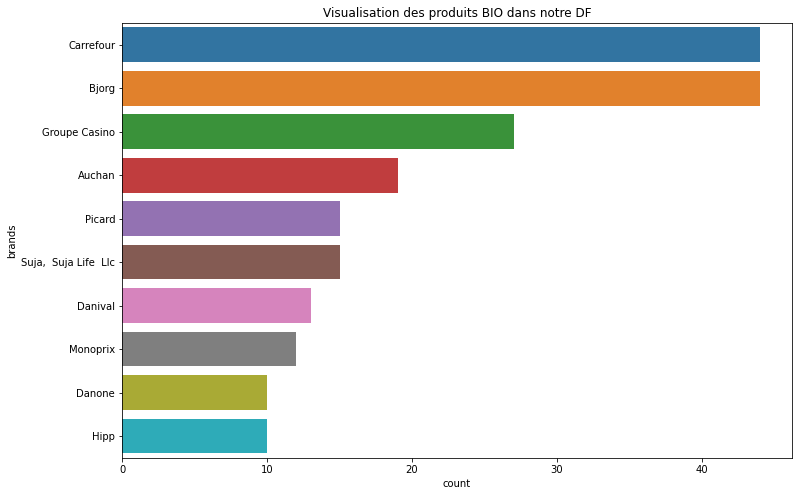

In [92]:
plt.figure(figsize=(12,8))
sns.countplot(y="brands", data=BIO, order=pd.value_counts(BIO['brands']).iloc[:10].index)
plt.ylabel("brands")
plt.title("Visualisation des produits BIO dans notre DF")
plt.show()

In [93]:
print(f'Le pourcentage de produits avec le label BIO dans le total des produits de la marque Carrefour est : ',round(BIO[BIO['brands']== 'Carrefour'].count().sum() / Data.brands.count().sum()*100,2)  ,'%')
print(f'Le pourcentage de produits avec le label BIO dans le total des produits de la marque Bjorg est :',round(BIO[BIO['brands']== 'Bjorg'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits avec le label BIO dans le total des produits de la marque Auchan est :',round(BIO[BIO['brands']== 'Auchan'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits avec le label BIO dans le total des produits de la marque Picard est :',round(BIO[BIO['brands']== 'Picard'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits avec le label BIO dans le total des produits de la marque Suja, Suja Life Llc est :',round(BIO[BIO['brands']== 'Suja, Suja Life Llc'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits avec le label BIO dans le total des produits de la marque Groupe Casino est :',round(BIO[BIO['brands']== 'Groupe Casino'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits avec le label BIO dans le total des produits de la marque Leader Price est :',round(BIO[BIO['brands']== 'Leader Price'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits avec le label BIO dans le total des produits de la marque Danival est :',round(BIO[BIO['brands']== 'Danival'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f"Le pourcentage de produits avec le label BIO dans le total des produits de la marque Monoprix est :",round(BIO[BIO['brands']== "Monoprix"].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f"Le pourcentage de produits avec le label BIO dans le total des produits de la marque Danone est :",round(BIO[BIO['brands']== "Danone"].count().sum() / Data.brands.count().sum()*100,2),'%')

Le pourcentage de produits avec le label BIO dans le total des produits de la marque Carrefour est :  3.03 %
Le pourcentage de produits avec le label BIO dans le total des produits de la marque Bjorg est : 3.03 %
Le pourcentage de produits avec le label BIO dans le total des produits de la marque Auchan est : 1.31 %
Le pourcentage de produits avec le label BIO dans le total des produits de la marque Picard est : 1.03 %
Le pourcentage de produits avec le label BIO dans le total des produits de la marque Suja, Suja Life Llc est : 0.0 %
Le pourcentage de produits avec le label BIO dans le total des produits de la marque Groupe Casino est : 1.86 %
Le pourcentage de produits avec le label BIO dans le total des produits de la marque Leader Price est : 0.0 %
Le pourcentage de produits avec le label BIO dans le total des produits de la marque Danival est : 0.89 %
Le pourcentage de produits avec le label BIO dans le total des produits de la marque Monoprix est : 0.83 %
Le pourcentage de produit

In [94]:
print(f'Le pourcentage de produit BIO est de', round((BIO.product_name.count().sum() / Data.product_name.count().sum())*100,2), '%')

Le pourcentage de produit BIO est de 1.31 %


## Par critére Additifs :

#### Produit avec Additifs :

In [95]:
Data_additifs_plus = Data[Data['additives_n'] > 0]
Data_additifs_plus

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr
2,http://world-fr.openfoodfacts.org/produit/0000...,Cornichons,Trader Joe's,États-Unis,Inconnu,2.0,0.0,79.0,0.00,3.08,0.8,0.77,0.56642,1.0,5.0,C
3,http://world-fr.openfoodfacts.org/produit/0001...,Diced In Tomato Juice,Trader Joe's,États-Unis,Inconnu,2.0,0.0,427.0,6.78,4.24,1.7,1.69,1.50622,4.0,6.0,A
4,http://world-fr.openfoodfacts.org/produit/0001...,Vindaloo Sauce,Kroger,États-Unis,Inconnu,2.0,0.0,372.0,3.80,0.00,1.3,8.86,0.00000,-5.0,4.0,A
8,http://world-fr.openfoodfacts.org/produit/0001...,Whole Kernel Corn,Trader Joe's,États-Unis,Inconnu,1.0,0.0,347.0,8.33,5.60,0.0,0.00,3.38582,0.0,3.0,A
10,http://world-fr.openfoodfacts.org/produit/0001...,Marinara Sauce,Trader Joe's,États-Unis,Inconnu,9.0,0.0,837.0,16.67,6.67,0.0,3.33,1.44018,17.0,5.0,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23253,http://world-fr.openfoodfacts.org/produit/8712...,Secrets de Grand-Mère Soupe au pistou et pâtes...,Knorr,France,Aliments composés,1.0,1.0,21.0,0.50,0.50,0.5,0.50,1.20000,5.0,6.0,A
23257,http://world-fr.openfoodfacts.org/produit/8712...,Douceur de courgettes au chèvre frais,Knorr,France,Aliments composés,2.0,0.0,307.0,4.80,4.40,0.5,1.20,0.77000,3.0,6.0,A
23258,http://world-fr.openfoodfacts.org/produit/8712...,Mouliné de tomates au basilic,Knorr,France,Aliments composés,3.0,0.0,586.0,0.60,26.00,0.0,0.80,1.70000,13.0,5.0,B
23259,http://world-fr.openfoodfacts.org/produit/8712...,Sensations Crème Forestière à l'huile aromatis...,Knorr,"Belgique,France",Aliments composés,5.0,0.0,787.0,12.20,0.10,0.0,11.10,1.90000,13.0,5.0,B


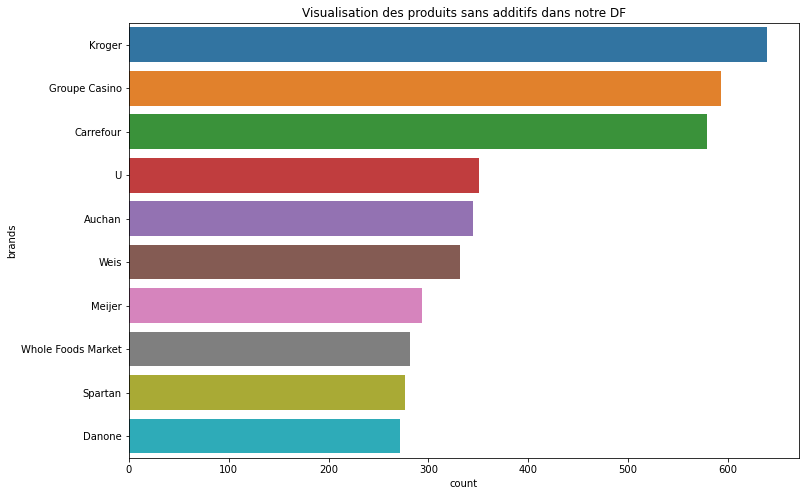

In [96]:
plt.figure(figsize=(12,8))
sns.countplot(y="brands", data=Data_additifs_plus, order=pd.value_counts(Data_additifs_plus['brands'],ascending=False).iloc[:10].index)
plt.ylabel("brands")
plt.title("Visualisation des produits sans additifs dans notre DF")
plt.show()

#### Produit sans additifs :

In [97]:
Data_additives_0 = Data[Data['additives_n'] == 0]
Data_additives_0

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr
0,http://world-fr.openfoodfacts.org/produit/0000...,Cauliflower,"Sainsbury's,by sainsbury's",Royaume-Uni,Fruits et Légumes,0.0,0.0,144.0,0.90,2.50,1.8,3.60,0.00000,-4.333333,5.0,A
1,http://world-fr.openfoodfacts.org/produit/0000...,Sweet 'N' Hot Salad Peppers,Mt. Olive,États-Unis,Inconnu,0.0,0.0,75.0,0.00,25.00,0.0,0.00,3.08356,-3.555556,2.0,B
5,http://world-fr.openfoodfacts.org/produit/0001...,Tofu Firm,Simple Truth Organic,États-Unis,Inconnu,0.0,0.0,138.0,0.00,3.33,0.0,0.00,2.20218,-5.000000,3.0,A
6,http://world-fr.openfoodfacts.org/produit/0001...,Salsa Autentica,Trader Joe's,États-Unis,Inconnu,0.0,0.0,172.0,0.00,8.20,1.6,0.00,0.01016,-1.000000,4.0,A
7,http://world-fr.openfoodfacts.org/produit/0001...,"First Crush, Unsweetened Gravenstein Apple Sauce",Trader Joe's,États-Unis,Inconnu,0.0,0.0,201.0,1.20,5.60,1.6,1.60,0.40640,0.000000,6.0,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23252,http://world-fr.openfoodfacts.org/produit/8712...,"Boisson aux extraits de thé vert, jus d'orange...",Lipton,"Belgique,France",Boissons,0.0,0.0,350.0,3.00,5.50,0.1,4.50,1.04000,5.000000,6.0,A
23254,http://world-fr.openfoodfacts.org/produit/8712...,Secrets de Grand-Mère Potiron Carottes fondant...,Knorr,France,Aliments composés,0.0,0.0,152.0,1.60,1.60,0.8,1.00,0.72000,2.000000,6.0,D
23255,http://world-fr.openfoodfacts.org/produit/8712...,Tomato al Gusto Tomaten-Bolognese,Knorr,Allemagne,Produits gras et Sauces,0.0,0.0,123.0,1.00,0.90,1.0,1.00,0.72000,1.000000,6.0,D
23256,http://world-fr.openfoodfacts.org/produit/8712...,Velouté de tomates,Knorr,France,Fruits et Légumes,0.0,0.0,130.0,1.00,0.90,0.8,1.50,0.73660,2.000000,6.0,A


In [98]:
print(f'Le pourcentage de produit sans additif est de', round((Data_additives_0['additives_n'].count() / Data.additives_n.count().sum())*100,2), '%')

Le pourcentage de produit sans additif est de 34.86 %


#### Visualisation des brands :

##### Top des 10 meilleurs marques :

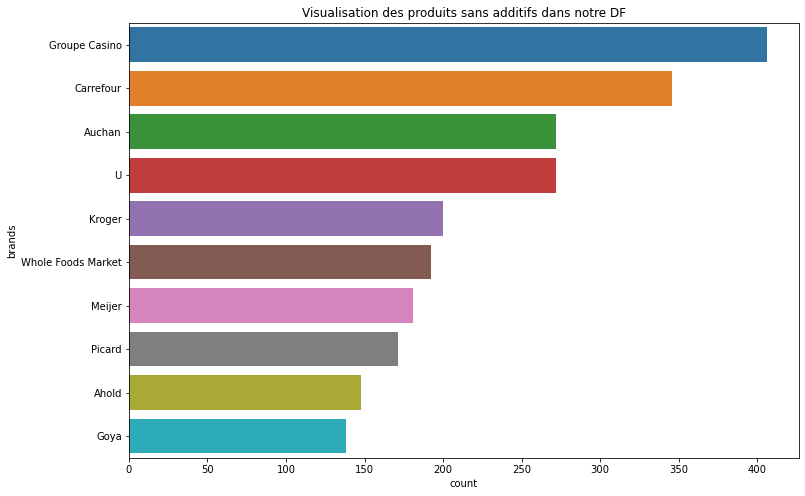

In [99]:
plt.figure(figsize=(12,8))
sns.countplot(y="brands", data=Data_additives_0, order=pd.value_counts(Data_additives_0['brands'],ascending=False).iloc[:10].index)
plt.ylabel("brands")
plt.title("Visualisation des produits sans additifs dans notre DF")
plt.show()

##### Boxplot de visu

#### Pourcentage de produits sans additifs dans la gamme de produit total de marques ayant le plus de référence  :

In [100]:
print(f'Le pourcentage de produits sans additifs dans le total des produits de la marque Carrefour est de :',round(Data_additives_0[Data_additives_0['brands']== 'Carrefour'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans additifs dans le total des produits de la marque U est de :',round(Data_additives_0[Data_additives_0['brands']== 'U'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans additifs dans le total des produits de la marque Auchan est de :',round(Data_additives_0[Data_additives_0['brands']== 'Auchan'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans additifs dans le total des produits de la marque Leader Price est de :',round(Data_additives_0[Data_additives_0['brands']== 'Leader Price'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans additifs dans le total des produits de la marque Groupe Casino est de :',round(Data_additives_0[Data_additives_0['brands']== 'Groupe Casino'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans additifs dans le total des produits de la marque Kroger est de :',round(Data_additives_0[Data_additives_0['brands']== 'Kroger'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans additifs dans le total des produits de la marque Meijer est de :',round(Data_additives_0[Data_additives_0['brands']== 'Meijer'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans additifs dans le total des produits de la marque Picard est de :',round(Data_additives_0[Data_additives_0['brands']== 'Picard'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans additifs dans le total des produits de la marque Ahold est de :',round(Data_additives_0[Data_additives_0['brands']== 'Ahold'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans additifs dans le total des produits de la marque Goya est de :',round(Data_additives_0[Data_additives_0['brands']== 'Goya'].count().sum() / Data.brands.count().sum()*100,2),'%')

Le pourcentage de produits sans additifs dans le total des produits de la marque Carrefour est de : 23.8 %
Le pourcentage de produits sans additifs dans le total des produits de la marque U est de : 18.71 %
Le pourcentage de produits sans additifs dans le total des produits de la marque Auchan est de : 18.71 %
Le pourcentage de produits sans additifs dans le total des produits de la marque Leader Price est de : 0.0 %
Le pourcentage de produits sans additifs dans le total des produits de la marque Groupe Casino est de : 27.93 %
Le pourcentage de produits sans additifs dans le total des produits de la marque Kroger est de : 13.76 %
Le pourcentage de produits sans additifs dans le total des produits de la marque Meijer est de : 12.45 %
Le pourcentage de produits sans additifs dans le total des produits de la marque Picard est de : 11.76 %
Le pourcentage de produits sans additifs dans le total des produits de la marque Ahold est de : 10.18 %
Le pourcentage de produits sans additifs dans le

## Par critére sur l'huile de palme :

In [101]:
Data_oil_palm= Data[Data['ingredients_from_palm_oil_n'] == 0.0]
Data_oil_palm

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr
0,http://world-fr.openfoodfacts.org/produit/0000...,Cauliflower,"Sainsbury's,by sainsbury's",Royaume-Uni,Fruits et Légumes,0.0,0.0,144.0,0.90,2.50,1.8,3.60,0.00000,-4.333333,5.0,A
1,http://world-fr.openfoodfacts.org/produit/0000...,Sweet 'N' Hot Salad Peppers,Mt. Olive,États-Unis,Inconnu,0.0,0.0,75.0,0.00,25.00,0.0,0.00,3.08356,-3.555556,2.0,B
2,http://world-fr.openfoodfacts.org/produit/0000...,Cornichons,Trader Joe's,États-Unis,Inconnu,2.0,0.0,79.0,0.00,3.08,0.8,0.77,0.56642,1.000000,5.0,C
3,http://world-fr.openfoodfacts.org/produit/0001...,Diced In Tomato Juice,Trader Joe's,États-Unis,Inconnu,2.0,0.0,427.0,6.78,4.24,1.7,1.69,1.50622,4.000000,6.0,A
4,http://world-fr.openfoodfacts.org/produit/0001...,Vindaloo Sauce,Kroger,États-Unis,Inconnu,2.0,0.0,372.0,3.80,0.00,1.3,8.86,0.00000,-5.000000,4.0,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23257,http://world-fr.openfoodfacts.org/produit/8712...,Douceur de courgettes au chèvre frais,Knorr,France,Aliments composés,2.0,0.0,307.0,4.80,4.40,0.5,1.20,0.77000,3.000000,6.0,A
23258,http://world-fr.openfoodfacts.org/produit/8712...,Mouliné de tomates au basilic,Knorr,France,Aliments composés,3.0,0.0,586.0,0.60,26.00,0.0,0.80,1.70000,13.000000,5.0,B
23259,http://world-fr.openfoodfacts.org/produit/8712...,Sensations Crème Forestière à l'huile aromatis...,Knorr,"Belgique,France",Aliments composés,5.0,0.0,787.0,12.20,0.10,0.0,11.10,1.90000,13.000000,5.0,B
23260,http://world-fr.openfoodfacts.org/produit/8712...,Douceur de légumes du soleil avec une pointe d...,Knorr,France,Aliments composés,7.0,0.0,197.0,0.00,0.10,3.1,3.12,0.39624,13.000000,4.0,C


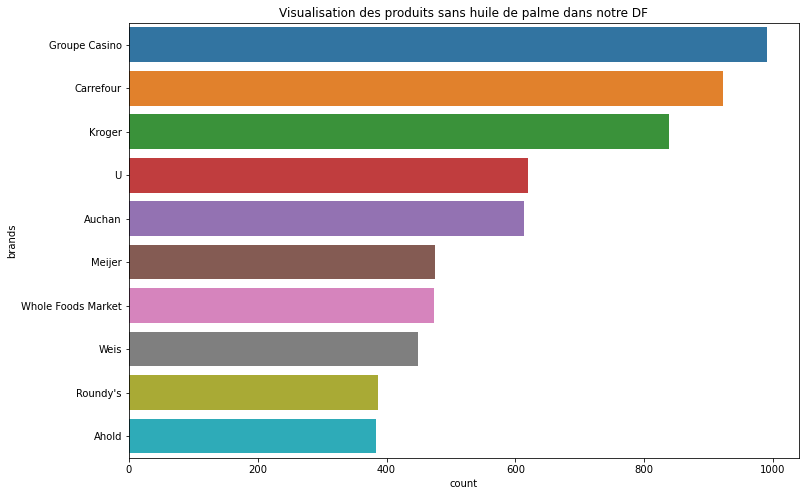

In [102]:
plt.figure(figsize=(12,8))
sns.countplot(y="brands", data=Data_oil_palm, order=pd.value_counts(Data_oil_palm['brands'],ascending=False).iloc[:10].index)
plt.ylabel("brands")
plt.title("Visualisation des produits sans huile de palme dans notre DF")
plt.show()

In [103]:
print(f'Le pourcentage de produits sans huile de palme dans le total des produits de la marque Carrefour est de :', round(Data_oil_palm[Data_oil_palm['brands']== 'Carrefour'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans huile de palme dans le total des produits de la marque Kroger est de :', round(Data_oil_palm[Data_oil_palm['brands']== 'Kroger'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans huile de palme dans le total des produits de la marque U est de :', round(Data_oil_palm[Data_oil_palm['brands']== 'U'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans huile de palme dans le total des produits de la marque Auchan est de :', round(Data_oil_palm[Data_oil_palm['brands']== 'Auchan'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans huile de palme dans le total des produits de la marque Leader Price est de :', round(Data_oil_palm[Data_oil_palm['brands']== 'Leader Price'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans huile de palme dans le total des produits de la marque Meijer est de :', round(Data_oil_palm[Data_oil_palm['brands']== 'Meijer'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans huile de palme dans le total des produits de la marque Weis est de :', round(Data_oil_palm[Data_oil_palm['brands']== 'Weis'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans huile de palme dans le total des produits de la marque Groupe Casino est de :', round(Data_oil_palm[Data_oil_palm['brands']== 'Groupe Casino'].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f"Le pourcentage de produits sans huile de palme dans le total des produits de la marque Roundy's est de :", round(Data_oil_palm[Data_oil_palm['brands']== "Roundy's"].count().sum() / Data.brands.count().sum()*100,2),'%')
print(f'Le pourcentage de produits sans huile de palme dans le total des produits de la marque Ahold est de :', round(Data_oil_palm[Data_oil_palm['brands']== 'Ahold'].count().sum() / Data.brands.count().sum()*100,2),'%')

Le pourcentage de produits sans huile de palme dans le total des produits de la marque Carrefour est de : 63.42 %
Le pourcentage de produits sans huile de palme dans le total des produits de la marque Kroger est de : 57.71 %
Le pourcentage de produits sans huile de palme dans le total des produits de la marque U est de : 42.64 %
Le pourcentage de produits sans huile de palme dans le total des produits de la marque Auchan est de : 42.23 %
Le pourcentage de produits sans huile de palme dans le total des produits de la marque Leader Price est de : 0.0 %
Le pourcentage de produits sans huile de palme dans le total des produits de la marque Meijer est de : 32.67 %
Le pourcentage de produits sans huile de palme dans le total des produits de la marque Weis est de : 30.88 %
Le pourcentage de produits sans huile de palme dans le total des produits de la marque Groupe Casino est de : 68.09 %
Le pourcentage de produits sans huile de palme dans le total des produits de la marque Roundy's est de : 

In [104]:
print(f'Le pourcentage de produit sans huile de palme est de', round(((Data_oil_palm['ingredients_from_palm_oil_n']).count() / Data.ingredients_from_palm_oil_n.count().sum())*100,2), '%')

Le pourcentage de produit sans huile de palme est de 99.28 %


## Khi - 2  :

### Entre les marques et le Nutriscore :

In [105]:
import scipy.stats as st
from scipy.stats import ks_2samp 

In [106]:
Data

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr
0,http://world-fr.openfoodfacts.org/produit/0000...,Cauliflower,"Sainsbury's,by sainsbury's",Royaume-Uni,Fruits et Légumes,0.0,0.0,144.0,0.90,2.50,1.8,3.60,0.00000,-4.333333,5.0,A
1,http://world-fr.openfoodfacts.org/produit/0000...,Sweet 'N' Hot Salad Peppers,Mt. Olive,États-Unis,Inconnu,0.0,0.0,75.0,0.00,25.00,0.0,0.00,3.08356,-3.555556,2.0,B
2,http://world-fr.openfoodfacts.org/produit/0000...,Cornichons,Trader Joe's,États-Unis,Inconnu,2.0,0.0,79.0,0.00,3.08,0.8,0.77,0.56642,1.000000,5.0,C
3,http://world-fr.openfoodfacts.org/produit/0001...,Diced In Tomato Juice,Trader Joe's,États-Unis,Inconnu,2.0,0.0,427.0,6.78,4.24,1.7,1.69,1.50622,4.000000,6.0,A
4,http://world-fr.openfoodfacts.org/produit/0001...,Vindaloo Sauce,Kroger,États-Unis,Inconnu,2.0,0.0,372.0,3.80,0.00,1.3,8.86,0.00000,-5.000000,4.0,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23257,http://world-fr.openfoodfacts.org/produit/8712...,Douceur de courgettes au chèvre frais,Knorr,France,Aliments composés,2.0,0.0,307.0,4.80,4.40,0.5,1.20,0.77000,3.000000,6.0,A
23258,http://world-fr.openfoodfacts.org/produit/8712...,Mouliné de tomates au basilic,Knorr,France,Aliments composés,3.0,0.0,586.0,0.60,26.00,0.0,0.80,1.70000,13.000000,5.0,B
23259,http://world-fr.openfoodfacts.org/produit/8712...,Sensations Crème Forestière à l'huile aromatis...,Knorr,"Belgique,France",Aliments composés,5.0,0.0,787.0,12.20,0.10,0.0,11.10,1.90000,13.000000,5.0,B
23260,http://world-fr.openfoodfacts.org/produit/8712...,Douceur de légumes du soleil avec une pointe d...,Knorr,France,Aliments composés,7.0,0.0,197.0,0.00,0.10,3.1,3.12,0.39624,13.000000,4.0,C


Création d'un tableau de contingeance :

In [107]:
X = "brands"
Y = "nutrition_grade_fr"
cont = Data[[X, Y]].pivot_table(index=X, columns=Y, aggfunc=len,margins=True,margins_name="Total").fillna(0).copy().astype(int)
cont

nutrition_grade_fr,A,B,C,D,E,Total
brands,,,,,,
Ahold,143,91,90,60,1,385
Aldi-Benner Company,5,19,7,0,0,31
"Alipende,//Propiedad de://,AhorraMas S.A.",23,6,30,7,0,66
Alnatura,44,20,30,24,0,118
Amora,7,5,8,6,0,26
...,...,...,...,...,...,...
Yoplait,46,13,31,9,0,99
Zapetti,26,0,23,2,0,51
d'aucy,45,1,6,0,1,53


In [108]:
tx = cont.loc[:,["Total"]]
ty = cont.loc[["Total"],:]
n = len(Data)
indep = tx.dot(ty) / n

c = cont.fillna(0) # On remplace les valeurs nulles par 0
measure = (c-indep)**2/indep
xi_n = measure.sum().sum()
table = measure/xi_n

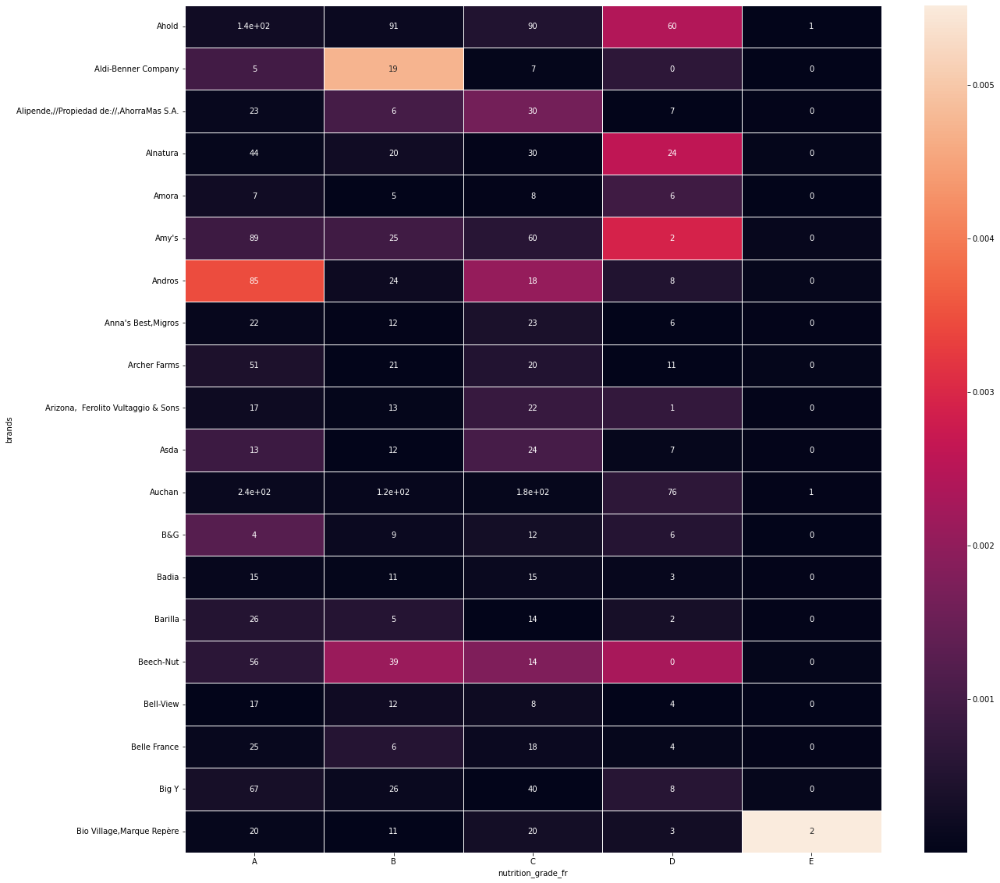

In [109]:
plt.figure(figsize=(20,20))
sns.heatmap(table.iloc[:20,:-1],annot=c.iloc[:20,:-1],linewidths=.5)
plt.show()

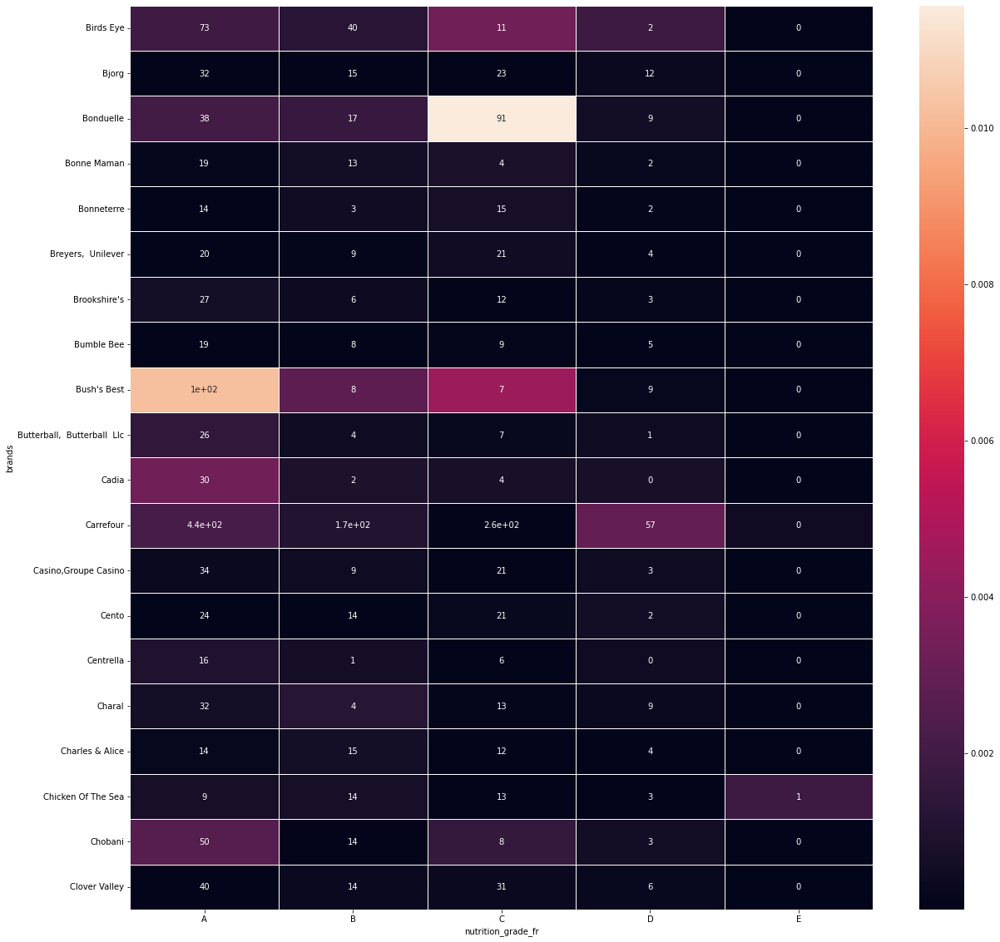

In [110]:
plt.figure(figsize=(20,20))
sns.heatmap(table.iloc[20:40,:-1],annot=c.iloc[20:40,:-1],linewidths=.5)
plt.show()

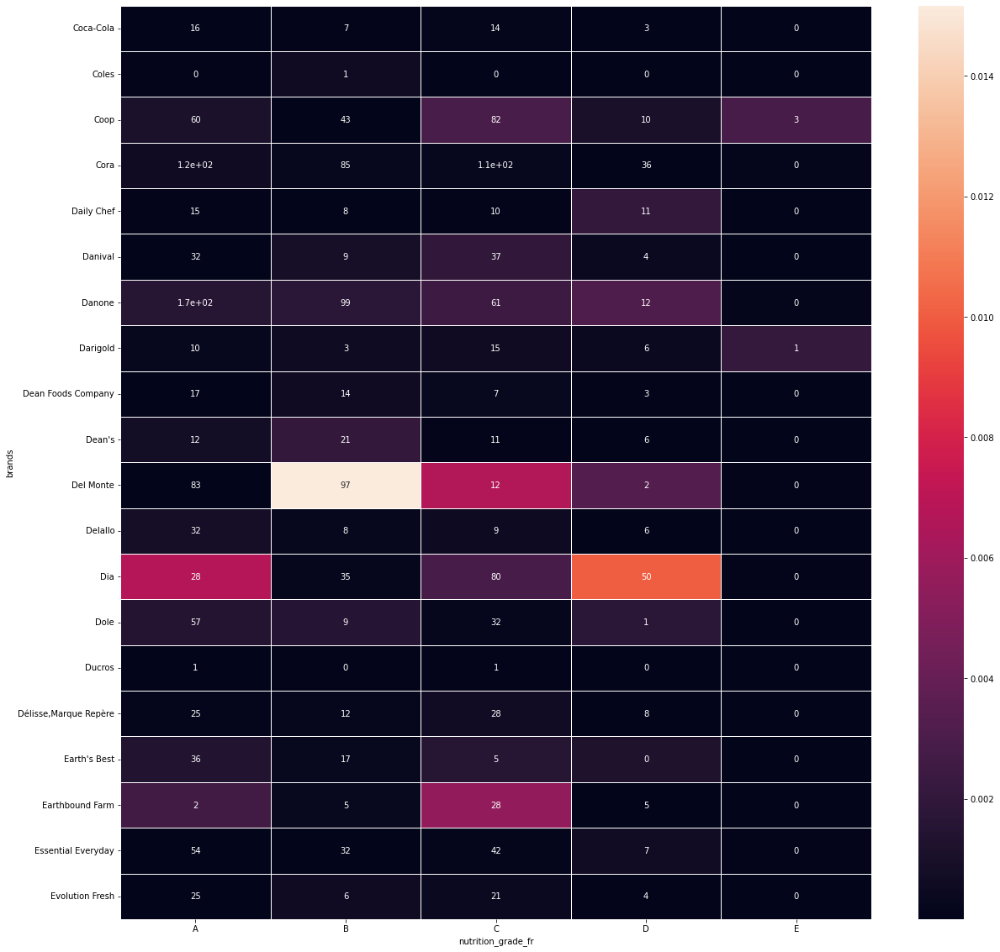

In [111]:
plt.figure(figsize=(20,20))
sns.heatmap(table.iloc[40:60,:-1],annot=c.iloc[40:60,:-1],linewidths=.5)
plt.show()

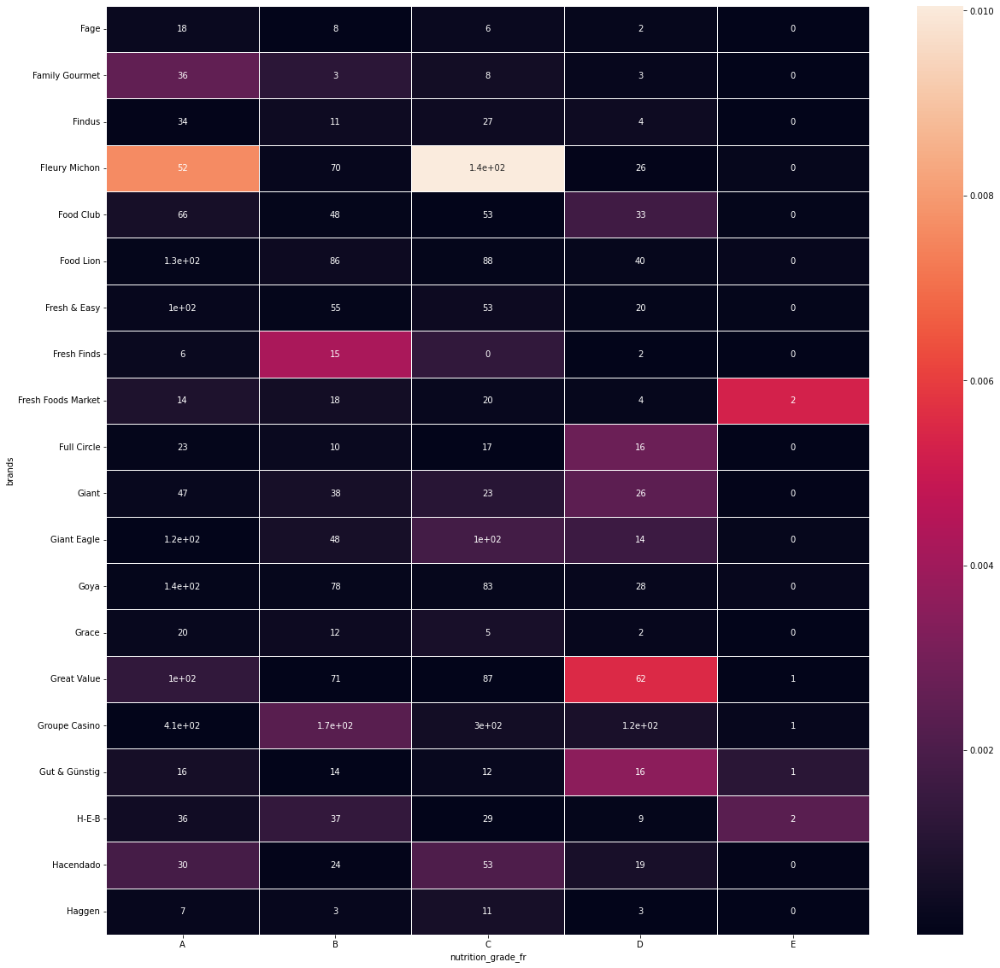

In [112]:
plt.figure(figsize=(20,20))
sns.heatmap(table.iloc[60:80,:-1],annot=c.iloc[60:80,:-1],linewidths=.5)
plt.show()

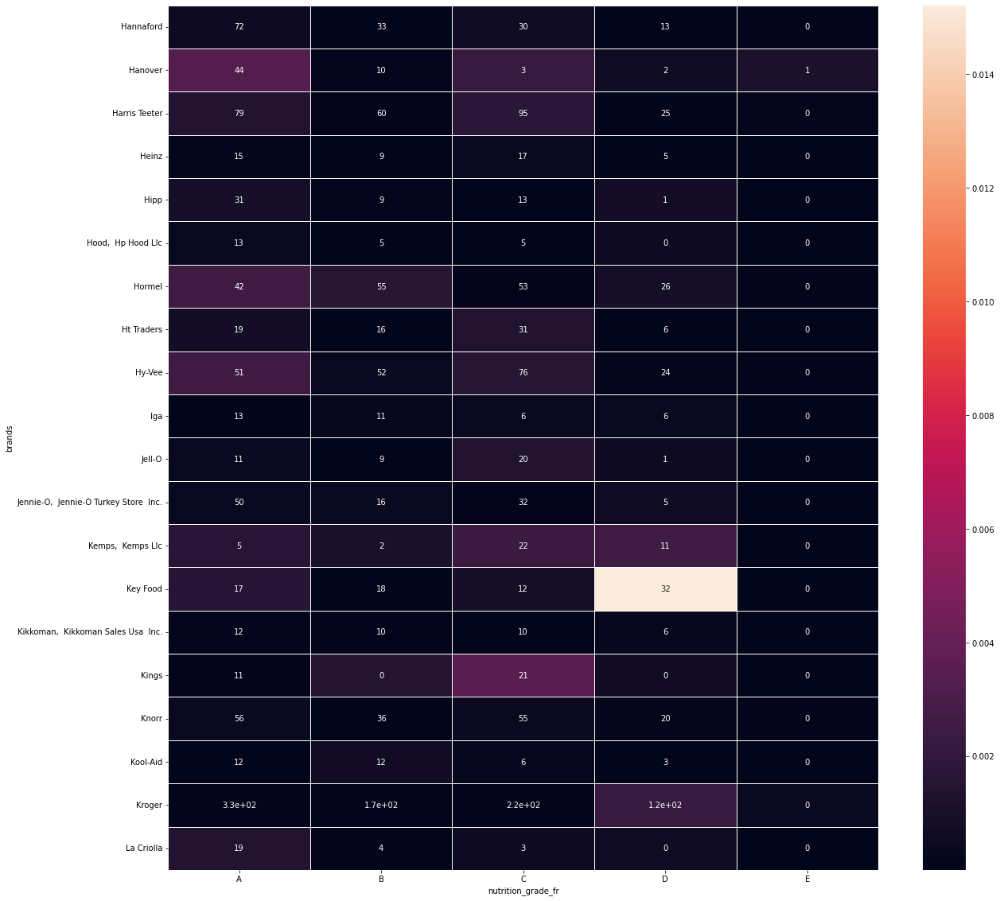

In [113]:
plt.figure(figsize=(20,20))
sns.heatmap(table.iloc[80:100,:-1],annot=c.iloc[80:100,:-1],linewidths=.5)
plt.show()

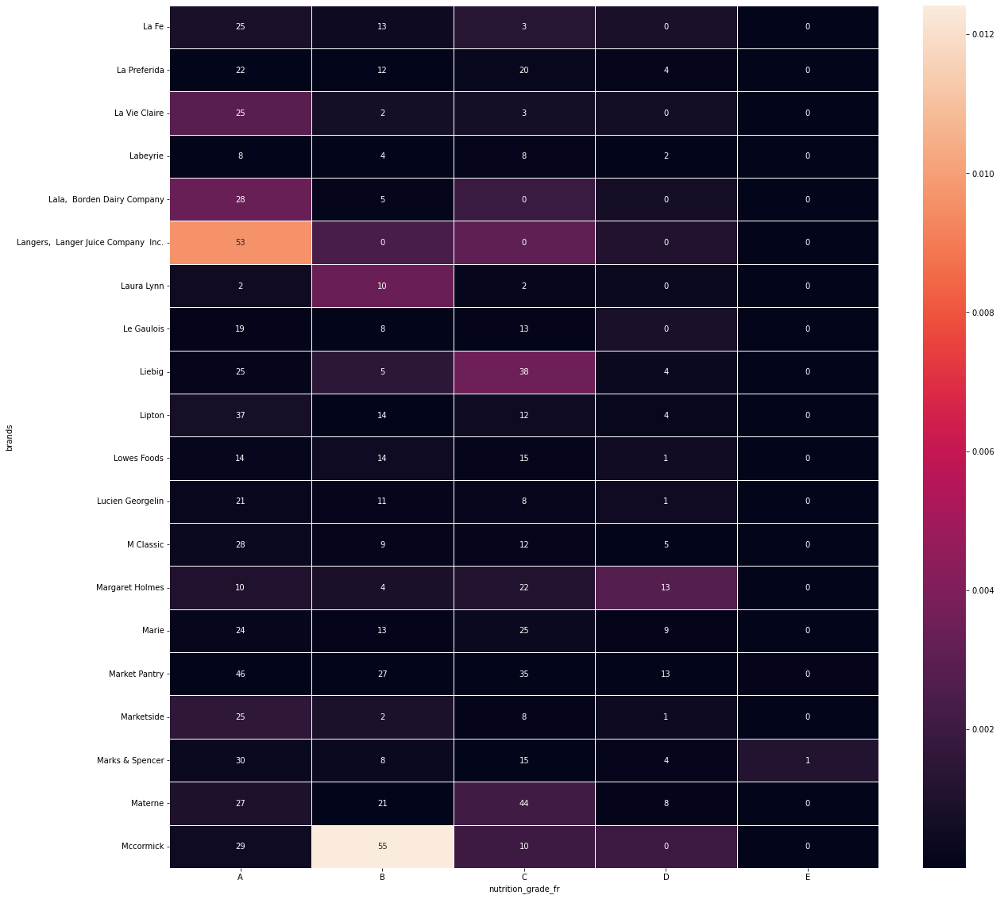

In [114]:
plt.figure(figsize=(20,20))
sns.heatmap(table.iloc[100:120,:-1],annot=c.iloc[100:120,:-1],linewidths=.5)
plt.show()

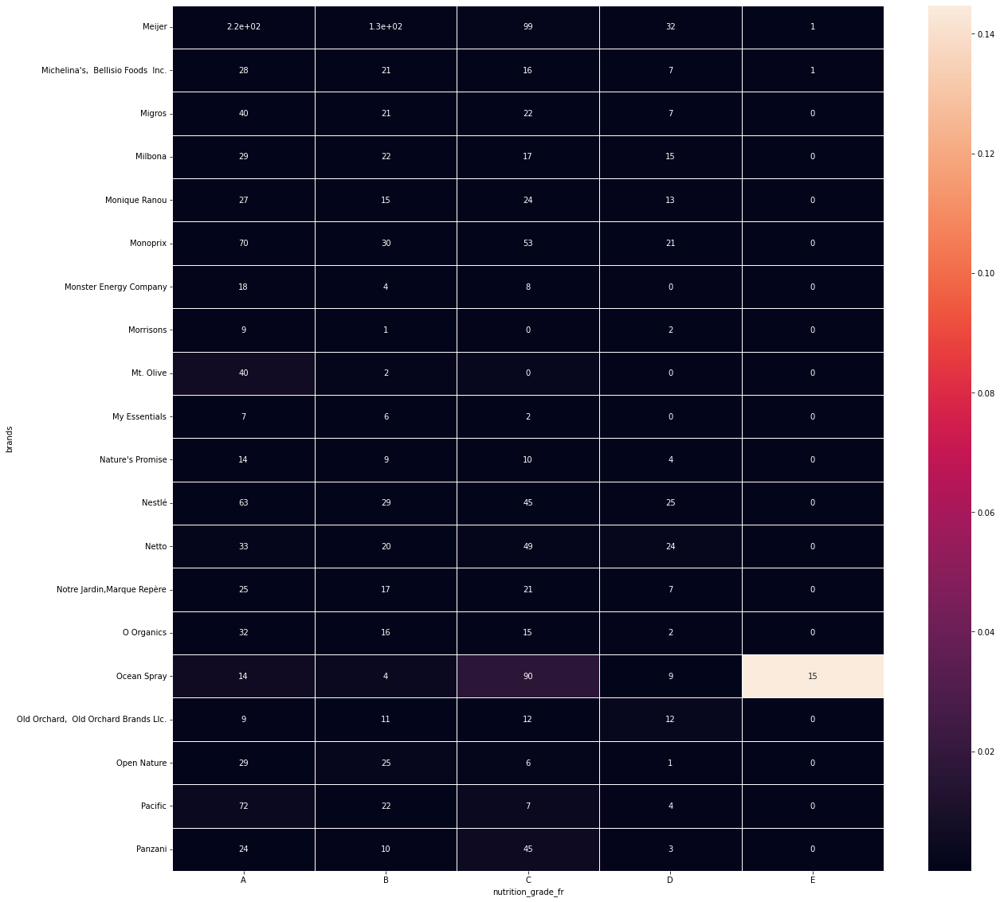

In [115]:
plt.figure(figsize=(20,20))
sns.heatmap(table.iloc[120:140,:-1],annot=c.iloc[120:140,:-1],linewidths=.5)
plt.show()

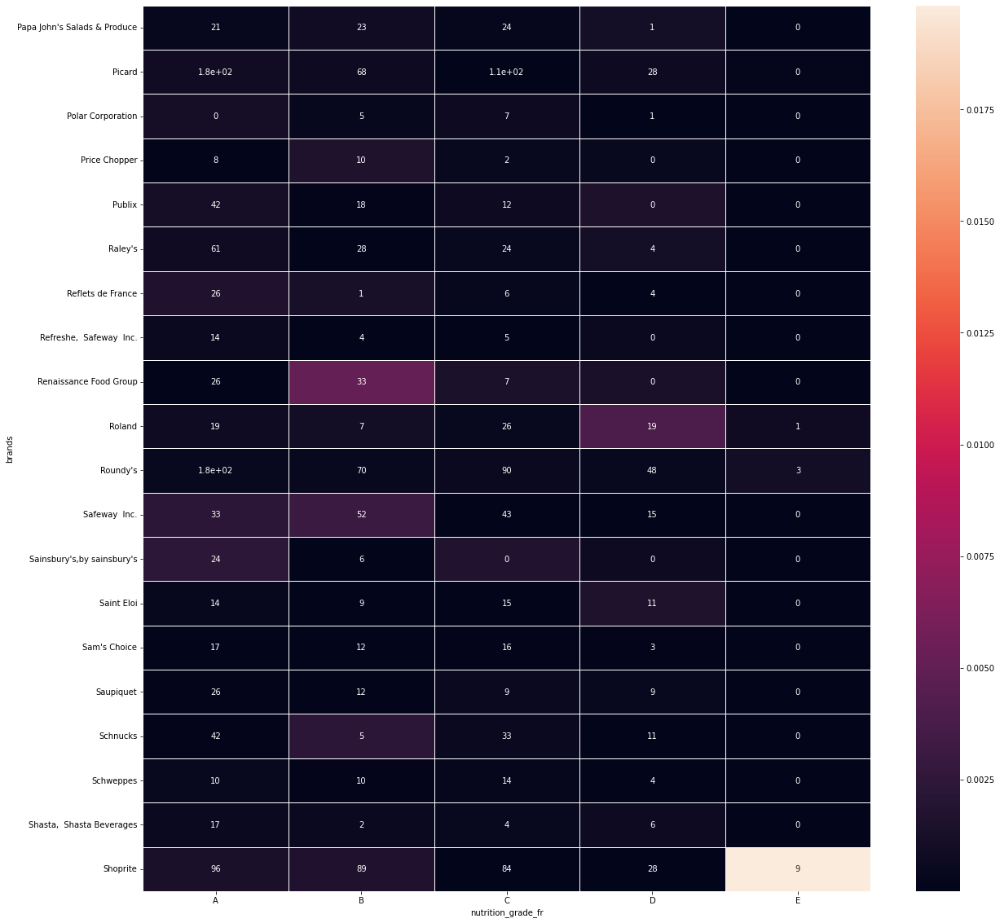

In [116]:
plt.figure(figsize=(20,20))
sns.heatmap(table.iloc[140:160,:-1],annot=c.iloc[140:160,:-1],linewidths=.5)
plt.show()

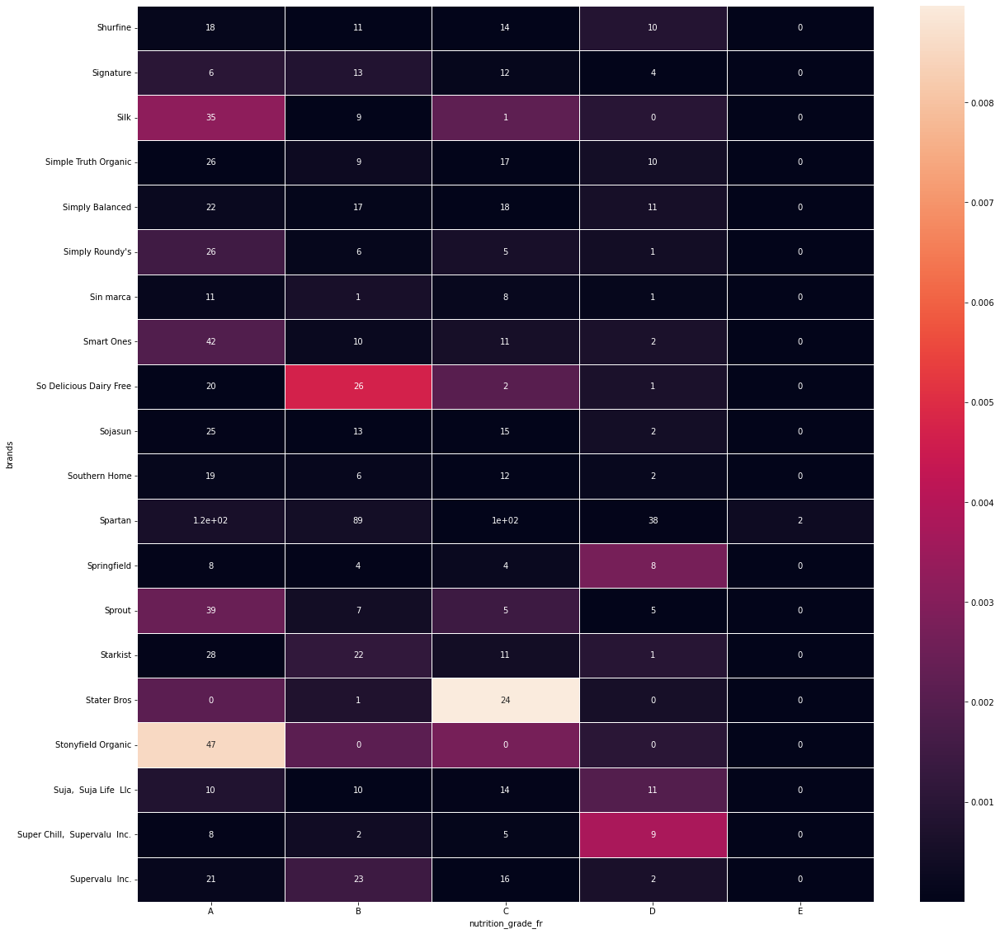

In [117]:
plt.figure(figsize=(20,20))
sns.heatmap(table.iloc[160:180,:-1],annot=c.iloc[160:180,:-1],linewidths=.5)
plt.show()

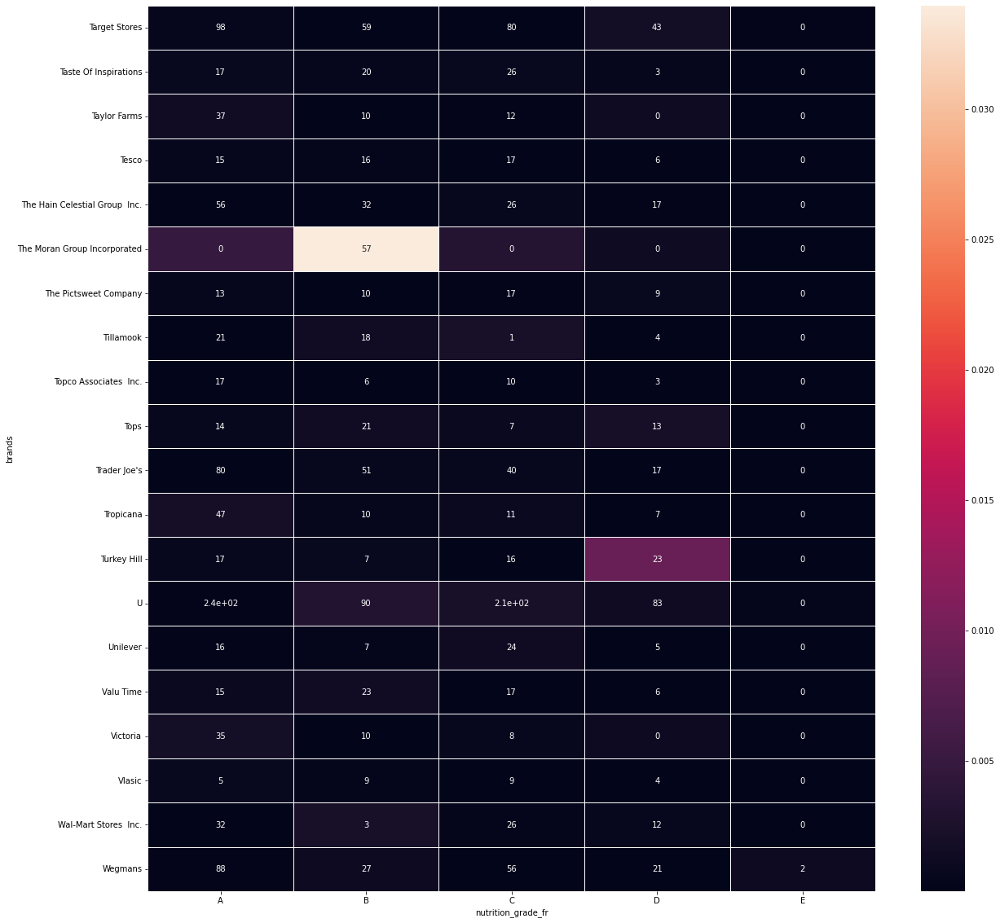

In [118]:
plt.figure(figsize=(20,20))
sns.heatmap(table.iloc[180:200,:-1],annot=c.iloc[180:200,:-1],linewidths=.5)
plt.show()

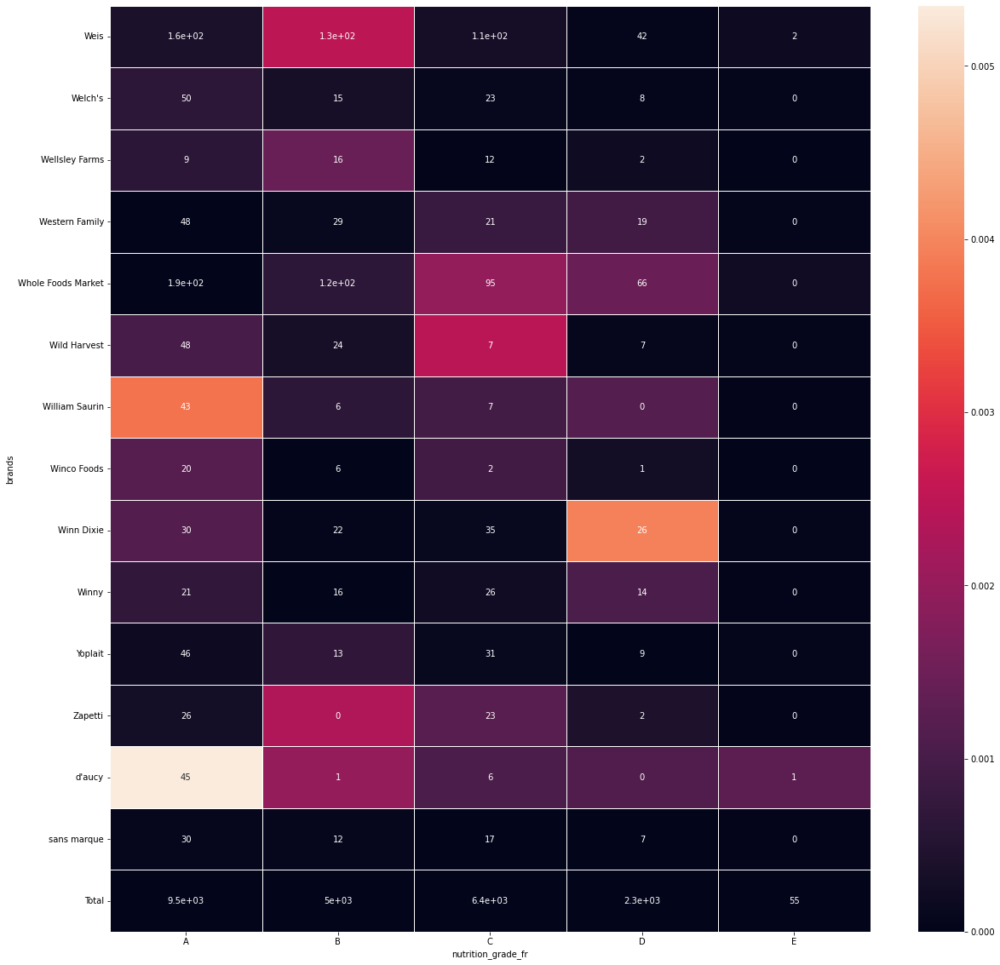

In [119]:
plt.figure(figsize=(20,20))
sns.heatmap(table.iloc[200:220,:-1],annot=c.iloc[200:220,:-1],linewidths=.5)
plt.yticks(rotation=360)
plt.show()

In [120]:
st_chi2, st_p, st_dof, st_exp = st.chi2_contingency(cont)

Le degré de liberté est égal au nombre d'observations moins le nombre de relations entre ces observations.

In [121]:
# degrés de liberté
print(f'Le degré de liberté est de :',st_dof)
 
# P-value 
print(f'La p-value est de :',st_p)

Le degré de liberté est de : 1070
La p-value est de : 0.0


La P-value est inférieur à 0,05 on refute l'hypothése du coup

#### Boxplot de visualisation des nutriscore :

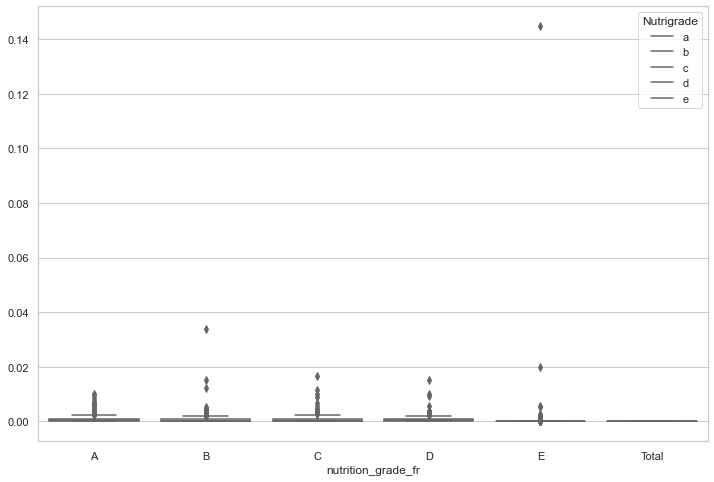

In [122]:
sns.set_theme(style="whitegrid")
plt.figure(figsize=(12,8))
ax = sns.boxplot(data=table,palette="Set3")
legend = plt.legend(['a','b','c','d','e'], title = "Nutrigrade")

On voit que la plus grande partie des produits font partie de la catégorie 1,2 et 3 donc des produits dits sains ou potentiellements sains.

### Entre les marques et le nutriscore pour les produits BIO :

In [123]:
X = "brands"
Y = "nutrition_grade_fr"
cont = BIO[[X, Y]].pivot_table(index=X, columns=Y, aggfunc=len,margins=True,margins_name="Total").fillna(0).copy().astype(int)
cont

nutrition_grade_fr,A,B,C,D,Total
brands,,,,,
Alnatura,3,0,2,1,6
Auchan,6,4,7,2,19
Belle France,1,0,0,0,1
"Bio Village,Marque Repère",3,0,4,0,7
Bjorg,17,9,13,5,44
Bonduelle,0,1,1,0,2
Bonneterre,0,1,2,0,3
Carrefour,23,10,7,4,44
Charal,1,0,0,0,1


In [124]:
tx = cont.loc[:,["Total"]]
ty = cont.loc[["Total"],:]
n = len(Data)
indep = tx.dot(ty) / n

c = cont.fillna(0) # On remplace les valeurs nulles par 0
measure = (c-indep)**2/indep
xi_n = measure.sum().sum()
table = measure/xi_n

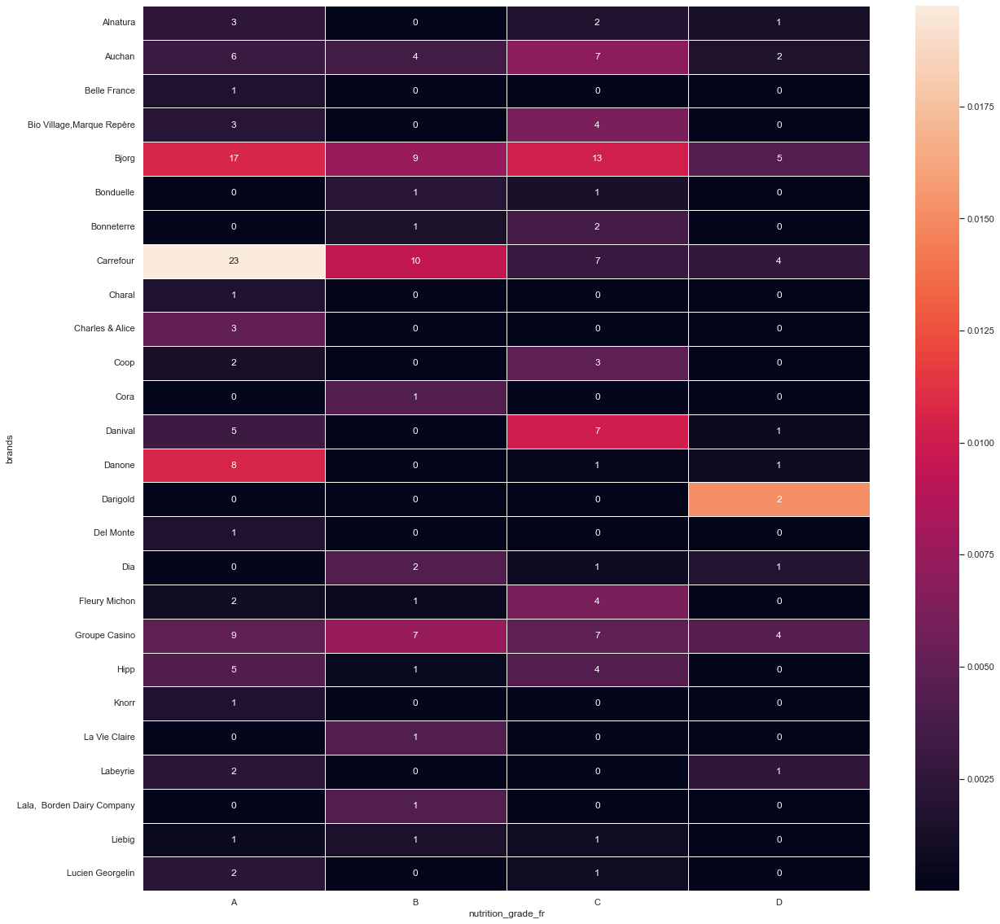

In [125]:
plt.figure(figsize=(20,20))
sns.heatmap(table.iloc[:26,:-1],annot=c.iloc[:26,:-1],linewidths=.5)
plt.show()

### Entre les marques et le nutriscore pour les produits Organic :

In [126]:
X = "brands"
Y = "nutrition_grade_fr"
cont = Organic[[X, Y]].pivot_table(index=X, columns=Y, aggfunc=len,margins=True,margins_name="Total").fillna(0).copy().astype(int)
cont

nutrition_grade_fr,A,B,C,D,E,Total
brands,,,,,,
Ahold,11,6,16,7,0,40
Aldi-Benner Company,2,2,0,0,0,4
Amy's,20,6,11,2,0,39
Archer Farms,1,0,0,0,0,1
Asda,0,1,0,0,0,1
...,...,...,...,...,...,...
Wellsley Farms,1,2,2,0,0,5
Whole Foods Market,32,30,16,18,0,96
Wild Harvest,36,18,5,4,0,63


In [127]:
tx = cont.loc[:,["Total"]]
ty = cont.loc[["Total"],:]
n = len(Data)
indep = tx.dot(ty) / n

c = cont.fillna(0) # On remplace les valeurs nulles par 0
measure = (c-indep)**2/indep
xi_n = measure.sum().sum()
table = measure/xi_n

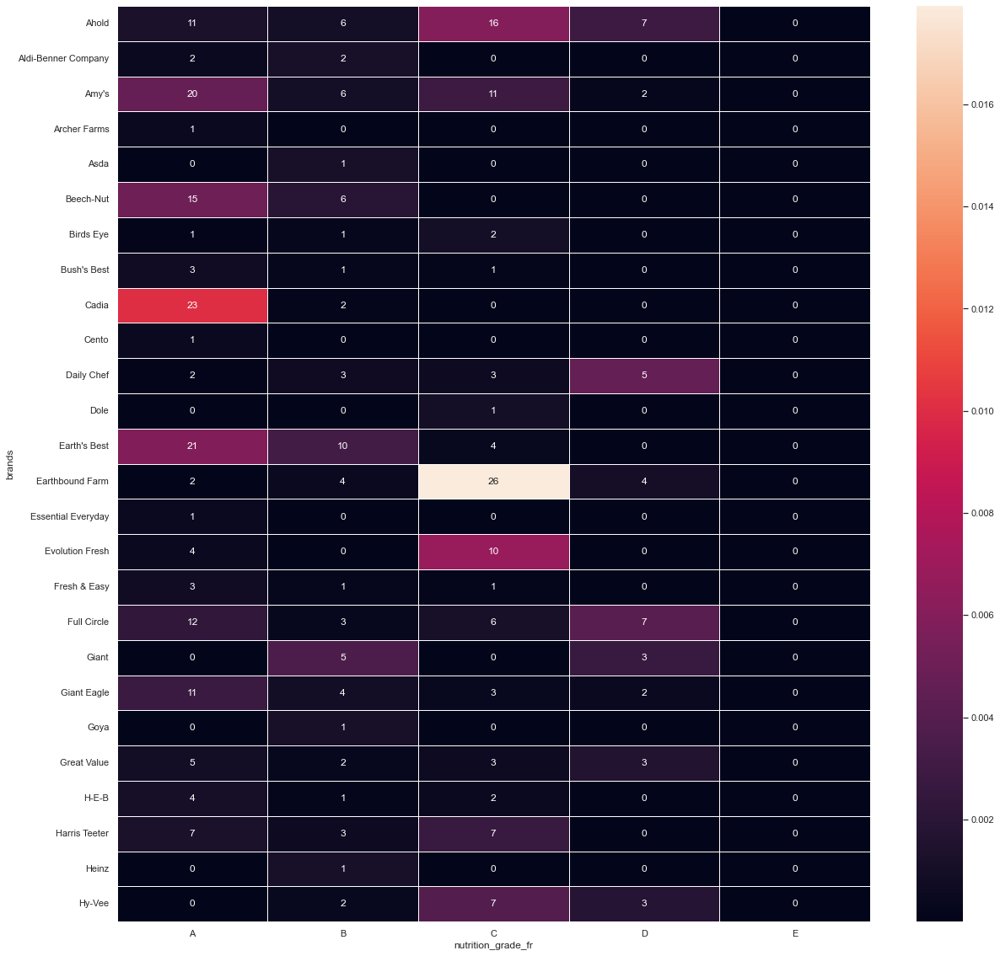

In [128]:
plt.figure(figsize=(20,20))
sns.heatmap(table.iloc[:26,:-1],annot=c.iloc[:26,:-1],linewidths=.5)
plt.show()

In [129]:
st_chi2, st_p, st_dof, st_exp = st.chi2_contingency(cont)

In [130]:
# degrés de liberté
print(f'Le degré de liberté est de :',st_dof)
 
# P-value 
print(f'La p-value est de :',st_p)

Le degré de liberté est de : 310
La p-value est de : 1.2144801808849332e-07


La P-value est inférieur à 0,05 on refute l'hypothése du coup

#### Visualisation des nutriscore :

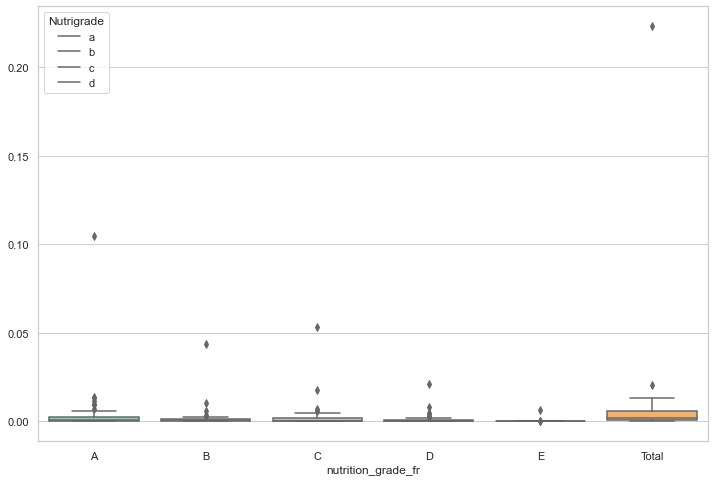

In [131]:
sns.set_theme(style="whitegrid")
plt.figure(figsize=(12,8))
ax = sns.boxplot(data=table,palette="Set3")
legend = plt.legend(['a','b','c','d'], title = "Nutrigrade")

On remarque que dans les produits Organic, il n'y a que 4 colonnes et non pas 5 comme dans le DF principal.

On remarque également que les principaux produits organics font partie de la catégorie 1 et 2 (a et b) dans notre DF et donc des produits sains.

<AxesSubplot:xlabel='brands'>

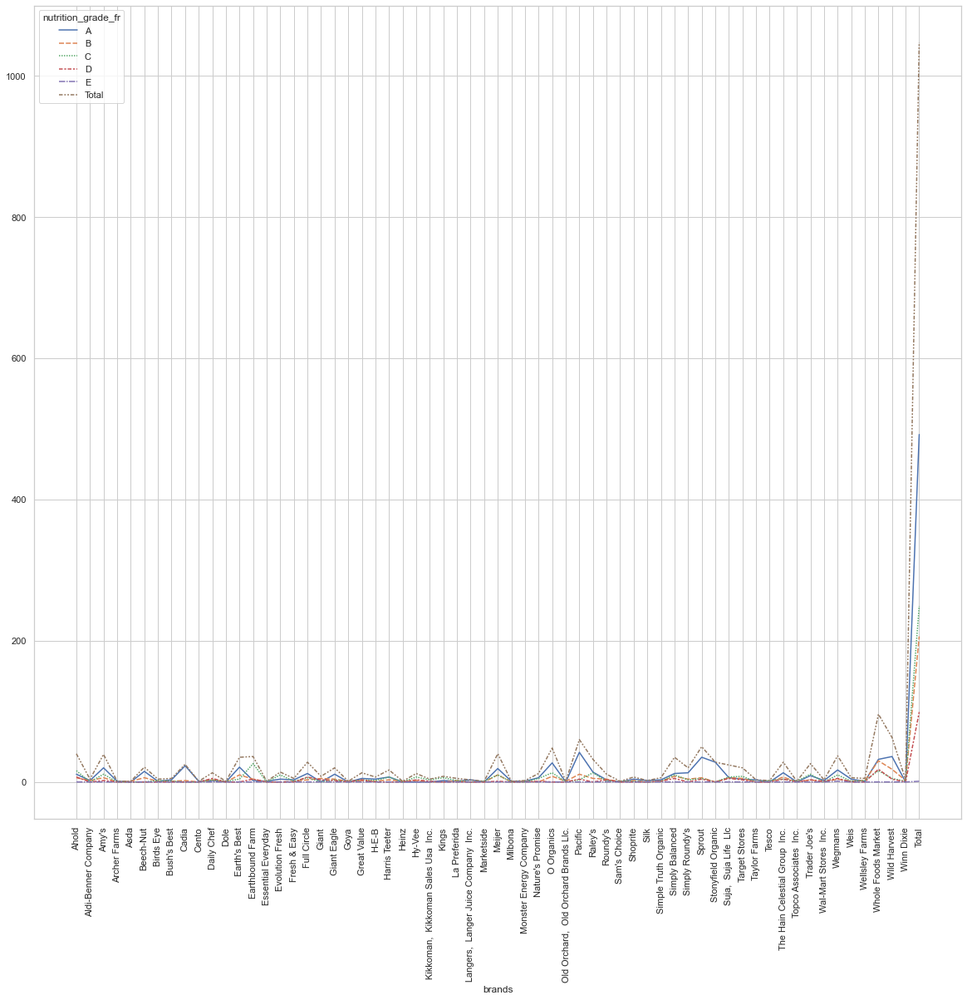

In [132]:
plt.figure(figsize=(20,18))
plt.xticks(rotation=90)
sns.lineplot(data = cont, 
             )

### Entre les marques et le nutriscore pour les produits sans huile de palme :

In [133]:
X = "brands"
Y = "nutrition_grade_fr"
cont = Data_oil_palm[[X, Y]].pivot_table(index=X, columns=Y, aggfunc=len,margins=True,margins_name="Total").fillna(0).copy().astype(int)
cont

nutrition_grade_fr,A,B,C,D,E,Total
brands,,,,,,
Ahold,142,91,90,60,1,384
Aldi-Benner Company,5,19,7,0,0,31
"Alipende,//Propiedad de://,AhorraMas S.A.",23,6,30,7,0,66
Alnatura,44,20,30,24,0,118
Amora,6,5,8,5,0,24
...,...,...,...,...,...,...
Yoplait,42,12,31,7,0,92
Zapetti,26,0,23,2,0,51
d'aucy,45,1,6,0,1,53


In [134]:
tx = cont.loc[:,["Total"]]
ty = cont.loc[["Total"],:]
n = len(Data)
indep = tx.dot(ty) / n

c = cont.fillna(0) # On remplace les valeurs nulles par 0
measure = (c-indep)**2/indep
xi_n = measure.sum().sum()
table = measure/xi_n

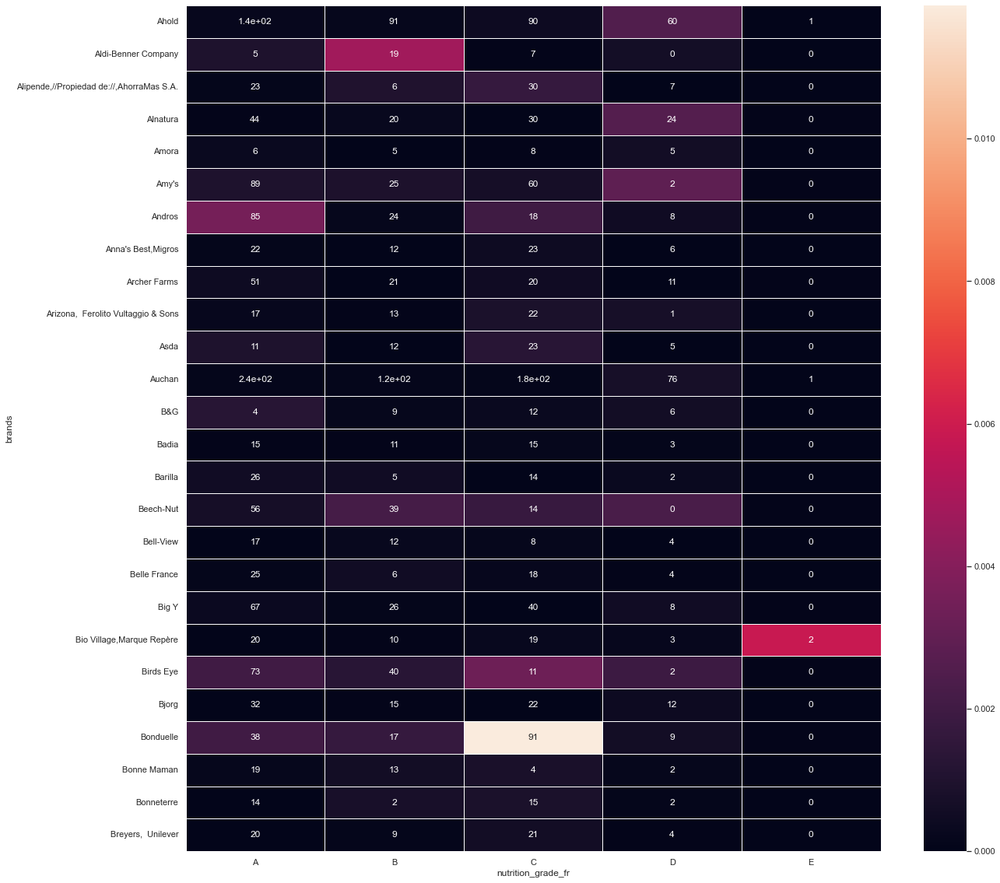

In [135]:
plt.figure(figsize=(20,20))
sns.heatmap(table.iloc[:26,:-1],annot=c.iloc[:26,:-1],linewidths=.5)
plt.show()

In [136]:
st_chi2, st_p, st_dof, st_exp = st.chi2_contingency(cont)

In [137]:
# degrés de liberté
print(f'Le degré de liberté est de :',st_dof)
 
# P-value 
print(f'La p-value est de :',st_p)

Le degré de liberté est de : 1070
La p-value est de : 0.0


La P-value est supérieur à 0,05, notre hypothése est vérifiée

#### Visualisation des nutriscore :

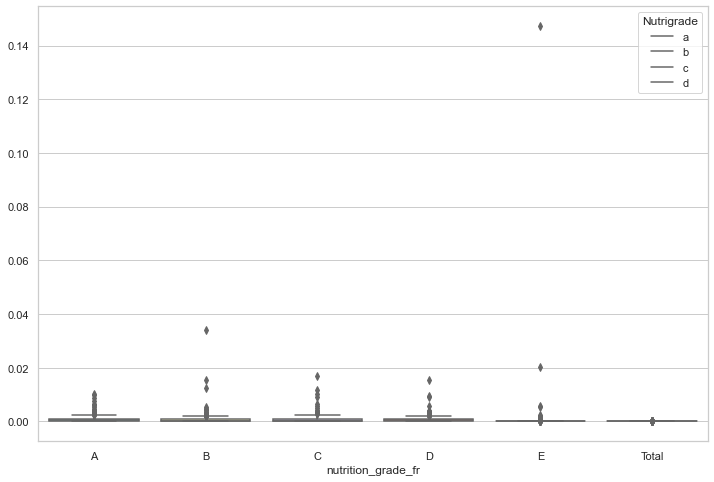

In [138]:
sns.set_theme(style="whitegrid")
plt.figure(figsize=(12,8))
ax = sns.boxplot(data=table,palette="Set3")
legend = plt.legend(['a','b','c','d'], title = "Nutrigrade")

On remarque que dans les produits Organic, il n'y a que 4 colonnes et non pas 5 comme dans le DF principal.

On remarque également que les principaux produits sans huile de palme font partie de la catégorie 2 et 3 (b et  c) dans notre DF et donc des produits potentiellement sains ou peu dangereux.

<AxesSubplot:title={'center':"Les marques et leur Nutriscore si ils n'ont pas d'huile de palme "}, xlabel='brands'>

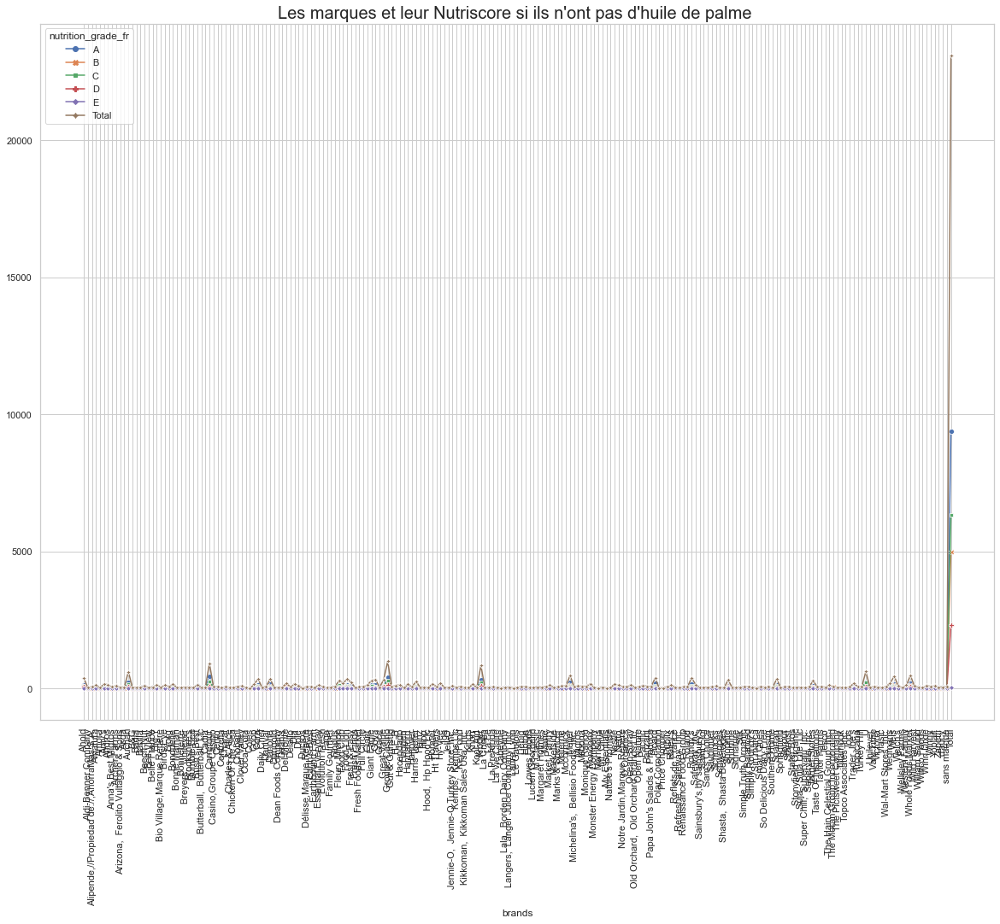

In [139]:
plt.figure(figsize=(20,15))
plt.title("Les marques et leur Nutriscore si ils n'ont pas d'huile de palme ", fontsize=20)
plt.xticks(rotation=90)
sns.lineplot(data = cont, 
             markers=True, dashes=False )

## Top des marques :

In [140]:
Data_A = Data[Data['nutrition_grade_fr'].str.contains('A')]

In [141]:
Data_A

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr
0,http://world-fr.openfoodfacts.org/produit/0000...,Cauliflower,"Sainsbury's,by sainsbury's",Royaume-Uni,Fruits et Légumes,0.0,0.0,144.0,0.90,2.50,1.8,3.60,0.00000,-4.333333,5.0,A
3,http://world-fr.openfoodfacts.org/produit/0001...,Diced In Tomato Juice,Trader Joe's,États-Unis,Inconnu,2.0,0.0,427.0,6.78,4.24,1.7,1.69,1.50622,4.000000,6.0,A
4,http://world-fr.openfoodfacts.org/produit/0001...,Vindaloo Sauce,Kroger,États-Unis,Inconnu,2.0,0.0,372.0,3.80,0.00,1.3,8.86,0.00000,-5.000000,4.0,A
5,http://world-fr.openfoodfacts.org/produit/0001...,Tofu Firm,Simple Truth Organic,États-Unis,Inconnu,0.0,0.0,138.0,0.00,3.33,0.0,0.00,2.20218,-5.000000,3.0,A
6,http://world-fr.openfoodfacts.org/produit/0001...,Salsa Autentica,Trader Joe's,États-Unis,Inconnu,0.0,0.0,172.0,0.00,8.20,1.6,0.00,0.01016,-1.000000,4.0,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23251,http://world-fr.openfoodfacts.org/produit/8712...,Croq'vert Aux 5 Epices & Aromates Extra fins O...,Amora,France,Fruits et Légumes,2.0,1.0,490.0,9.00,5.00,1.5,2.50,21.00000,14.000000,6.0,A
23252,http://world-fr.openfoodfacts.org/produit/8712...,"Boisson aux extraits de thé vert, jus d'orange...",Lipton,"Belgique,France",Boissons,0.0,0.0,350.0,3.00,5.50,0.1,4.50,1.04000,5.000000,6.0,A
23253,http://world-fr.openfoodfacts.org/produit/8712...,Secrets de Grand-Mère Soupe au pistou et pâtes...,Knorr,France,Aliments composés,1.0,1.0,21.0,0.50,0.50,0.5,0.50,1.20000,5.000000,6.0,A
23256,http://world-fr.openfoodfacts.org/produit/8712...,Velouté de tomates,Knorr,France,Fruits et Légumes,0.0,0.0,130.0,1.00,0.90,0.8,1.50,0.73660,2.000000,6.0,A


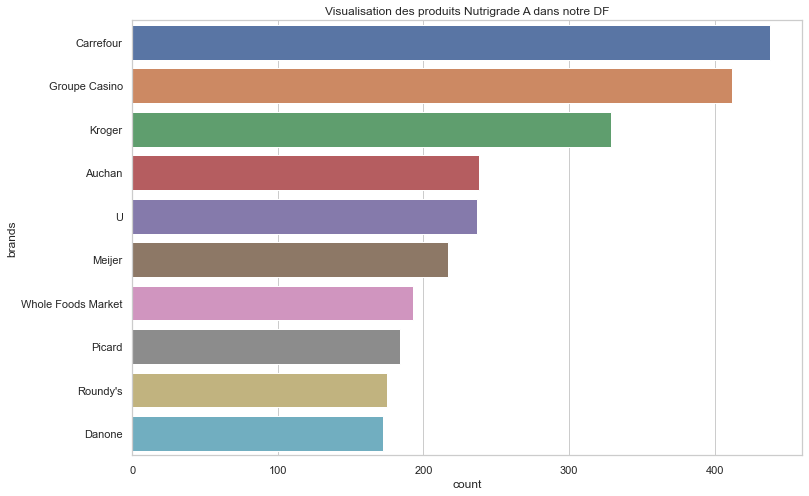

In [142]:
plt.figure(figsize=(12,8))
sns.countplot(y="brands", data=Data_A, order=pd.value_counts(Data_A['brands'],ascending=False).iloc[:10].index)
plt.ylabel("brands")
plt.title("Visualisation des produits Nutrigrade A dans notre DF")
plt.show()

In [143]:
Data_B =  Data[Data['nutrition_grade_fr'].str.contains('B')]

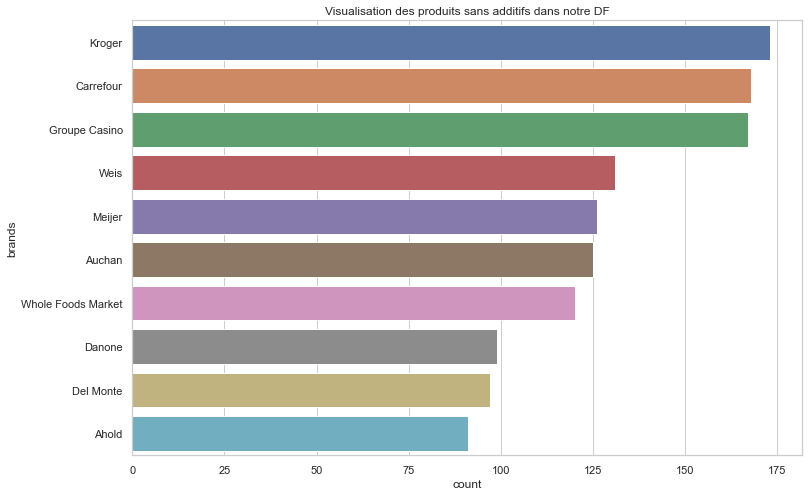

In [144]:
plt.figure(figsize=(12,8))
sns.countplot(y="brands", data=Data_B, order=pd.value_counts(Data_B['brands'],ascending=False).iloc[:10].index)
plt.ylabel("brands")
plt.title("Visualisation des produits sans additifs dans notre DF")
plt.show()

In [145]:
Data_C =  Data[Data['nutrition_grade_fr'].str.contains('C')]

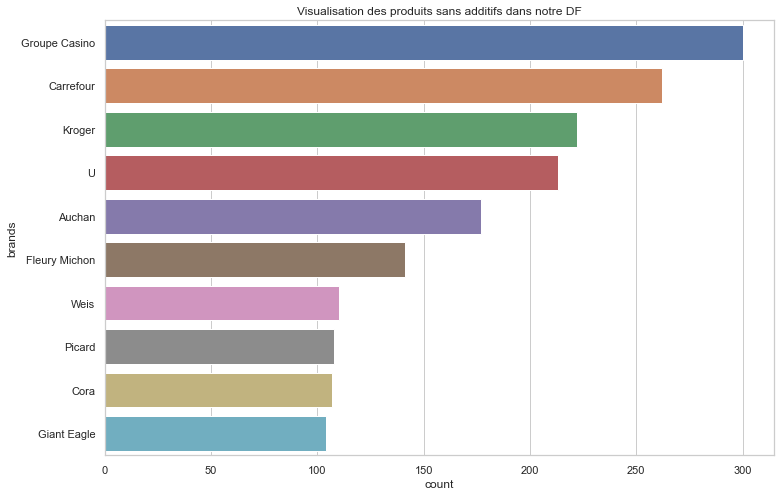

In [146]:
plt.figure(figsize=(12,8))
sns.countplot(y="brands", data=Data_C, order=pd.value_counts(Data_C['brands'],ascending=False).iloc[:10].index)
plt.ylabel("brands")
plt.title("Visualisation des produits sans additifs dans notre DF")
plt.show()

In [147]:
Data_D =  Data[Data['nutrition_grade_fr'].str.contains('D')]

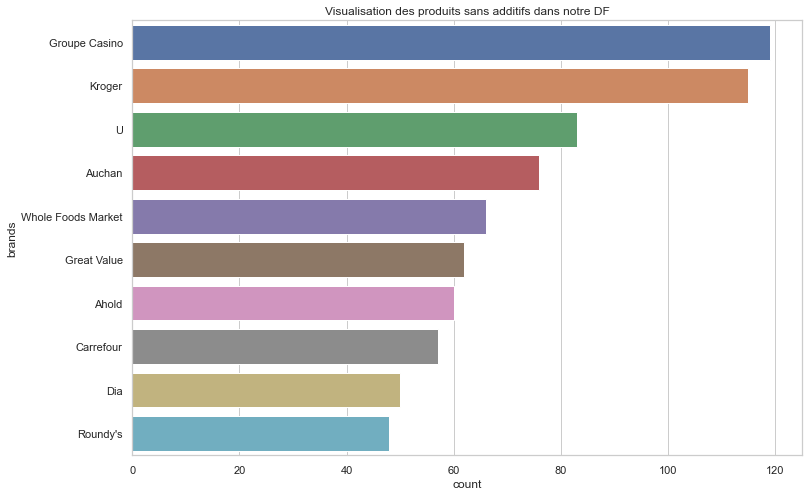

In [148]:
plt.figure(figsize=(12,8))
sns.countplot(y="brands", data=Data_D, order=pd.value_counts(Data_D['brands'],ascending=False).iloc[:10].index)
plt.ylabel("brands")
plt.title("Visualisation des produits sans additifs dans notre DF")
plt.show()

In [149]:
Data_E =  Data[Data['nutrition_grade_fr'].str.contains('E')]

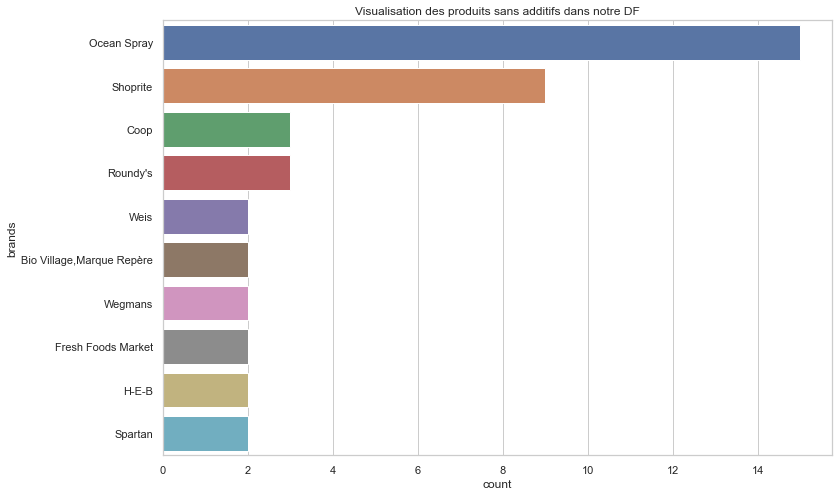

In [150]:
plt.figure(figsize=(12,8))
sns.countplot(y="brands", data=Data_E, order=pd.value_counts(Data_E['brands'],ascending=False).iloc[:10].index)
plt.ylabel("brands")
plt.title("Visualisation des produits sans additifs dans notre DF")
plt.show()

Pour indiquer quels sont les top Marques il convient de vérifier nos résultats précédent pour optimiser les résultats de ceux-ci.

### Visu des marques les plus représentés :

In [151]:
Carrefour = Data[Data['brands']=='Carrefour']
Kroger = Data[Data['brands']=='Kroger']
Auchan = Data[Data['brands']=='Auchan']
Ocean_Spray = Data[Data['brands']=='Ocean Spray']

 Catégorie A TOP : 

__Carrefour :__

<AxesSubplot:>

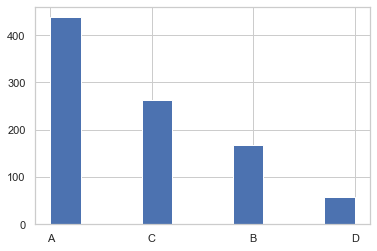

In [152]:
Carrefour['nutrition_grade_fr'].hist()

array([[<AxesSubplot:title={'center':'additives_n'}>,
        <AxesSubplot:title={'center':'ingredients_from_palm_oil_n'}>,
        <AxesSubplot:title={'center':'energy_100g'}>],
       [<AxesSubplot:title={'center':'fat_100g'}>,
        <AxesSubplot:title={'center':'sugars_100g'}>,
        <AxesSubplot:title={'center':'fiber_100g'}>],
       [<AxesSubplot:title={'center':'proteins_100g'}>,
        <AxesSubplot:title={'center':'salt_100g'}>,
        <AxesSubplot:title={'center':'nutrition-score-fr_100g'}>],
       [<AxesSubplot:title={'center':'Known'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

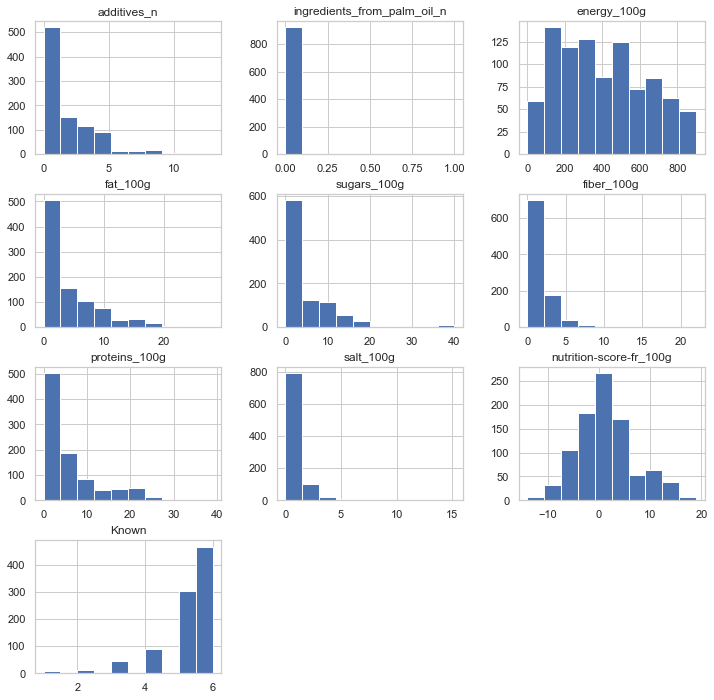

In [153]:
Carrefour.hist(figsize=(12,12))

__Kroger :__

<AxesSubplot:>

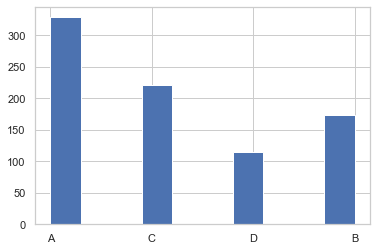

In [154]:
Kroger['nutrition_grade_fr'].hist()

array([[<AxesSubplot:title={'center':'additives_n'}>,
        <AxesSubplot:title={'center':'ingredients_from_palm_oil_n'}>,
        <AxesSubplot:title={'center':'energy_100g'}>],
       [<AxesSubplot:title={'center':'fat_100g'}>,
        <AxesSubplot:title={'center':'sugars_100g'}>,
        <AxesSubplot:title={'center':'fiber_100g'}>],
       [<AxesSubplot:title={'center':'proteins_100g'}>,
        <AxesSubplot:title={'center':'salt_100g'}>,
        <AxesSubplot:title={'center':'nutrition-score-fr_100g'}>],
       [<AxesSubplot:title={'center':'Known'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

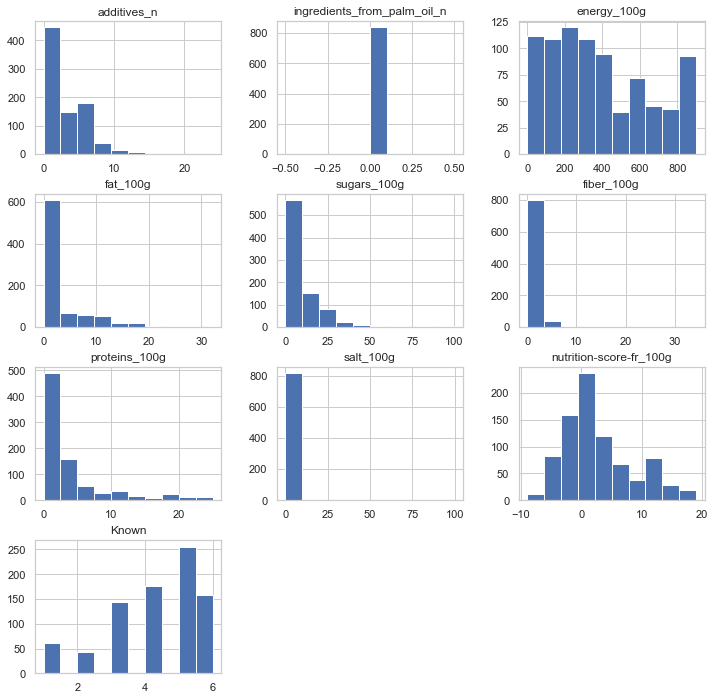

In [155]:
Kroger.hist(figsize=(12,12))

__Auchan :__

<AxesSubplot:>

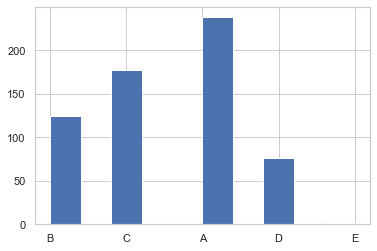

In [156]:
Auchan['nutrition_grade_fr'].hist()

array([[<AxesSubplot:title={'center':'additives_n'}>,
        <AxesSubplot:title={'center':'ingredients_from_palm_oil_n'}>,
        <AxesSubplot:title={'center':'energy_100g'}>],
       [<AxesSubplot:title={'center':'fat_100g'}>,
        <AxesSubplot:title={'center':'sugars_100g'}>,
        <AxesSubplot:title={'center':'fiber_100g'}>],
       [<AxesSubplot:title={'center':'proteins_100g'}>,
        <AxesSubplot:title={'center':'salt_100g'}>,
        <AxesSubplot:title={'center':'nutrition-score-fr_100g'}>],
       [<AxesSubplot:title={'center':'Known'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

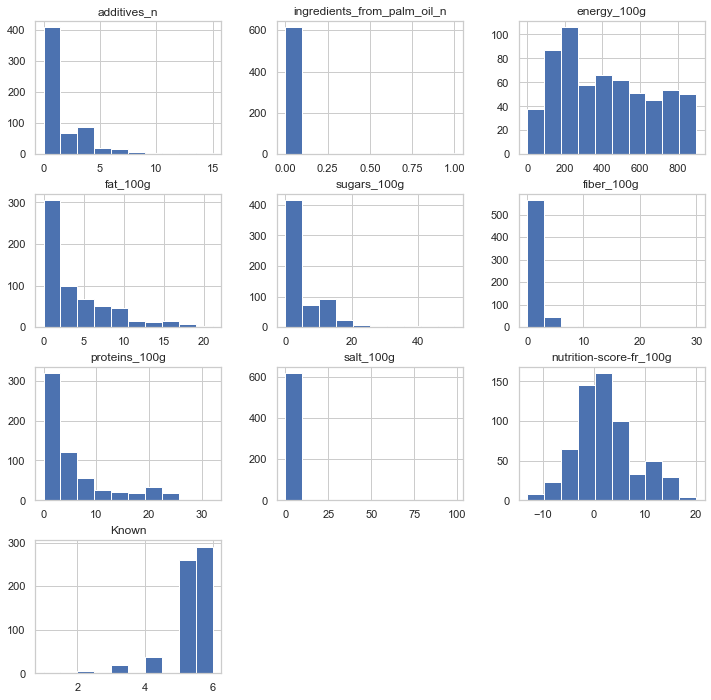

In [157]:
Auchan.hist(figsize=(12,12))

Utilisation de plotly pour la visualisation des Nutrigrade :

In [158]:
fig = px.bar(Data, y='nutrition_grade_fr', x='brands',color='nutrition_grade_fr')
fig.show()

Mon ordinateur ne doit pas être assez puissant, néanmoins, ce graph permet de visualiser les données des nutrigrades avec Zoom.

In [159]:
print(f"PRODUIT SANS ADDITIFS :")
df_add = round((pd.value_counts(Data_additives_0['brands']) / pd.value_counts(Data['brands']))*100,2).dropna()
#df_palm  = pd.DataFrame(df_palm )
df_add  = df_add.sort_values(ascending= False)
df_add.head(30)

PRODUIT SANS ADDITIFS :


Bonneterre                      82.35
Hipp                            81.48
La Vie Claire                   80.00
Beech-Nut                       71.56
Butterball,  Butterball  Llc    71.05
Hanover                         70.00
Winco Foods                     68.97
Liebig                          68.06
Le Gaulois                      67.50
Alnatura                        65.25
Wellsley Farms                  64.10
Chobani                         64.00
Family Gourmet                  64.00
Renaissance Food Group          63.64
Evolution Fresh                 60.71
Milbona                         59.04
Morrisons                       58.33
Délisse,Marque Repère           54.79
Saupiquet                       53.57
Dole                            53.54
Charles & Alice                 53.33
Monster Energy Company          53.33
Suja,  Suja Life  Llc           53.33
sans marque                     53.03
Raley's                         52.99
Gut & Günstig                   52.54
Sin marca   

In [160]:
print(f"PRODUIT SANS HUILE DE PALME :")
df_palm = round((pd.value_counts(Data_oil_palm['brands']) / pd.value_counts(Data['brands']))*100,2).dropna()
#df_palm  = pd.DataFrame(df_palm )
df_palm  = df_palm.sort_values(ascending= False)
df_palm

PRODUIT SANS HUILE DE PALME :


Le Gaulois                    100.00
Saupiquet                     100.00
My Essentials                 100.00
Nature's Promise              100.00
Notre Jardin,Marque Repère    100.00
                               ...  
Amora                          92.31
Dia                            91.19
Asda                           91.07
Sin marca                      85.71
Coop                           76.26
Name: brands, Length: 214, dtype: float64

In [161]:
print(f"PRODUIT BIO :")
df_BIO = round((pd.value_counts(BIO['brands']) / pd.value_counts(Data['brands']))*100,2).dropna()
#df_BIO = pd.DataFrame(df_BIO)
df_BIO = df_BIO.sort_values(ascending= True)
df_BIO

PRODUIT BIO :


Cora                            0.29
Weis                            0.45
Del Monte                       0.52
Wegmans                         0.52
Knorr                           0.60
Nestlé                          0.62
U                               0.80
Shoprite                        0.98
Yoplait                         1.01
Bonduelle                       1.29
sans marque                     1.52
Charal                          1.72
Belle France                    1.89
Saint Eloi                      2.04
Dia                             2.07
Migros                          2.22
Fleury Michon                   2.42
Panzani                         2.44
Coop                            2.53
Groupe Casino                   2.70
Danone                          2.91
Lala,  Borden Dairy Company     3.03
Auchan                          3.08
La Vie Claire                   3.33
Picard                          3.87
Tropicana                       4.00
Liebig                          4.17
C

In [162]:
print(f" PRODUIT ORGANIC :")
ORGANIC = round((pd.value_counts(Organic['brands']) / pd.value_counts(Data['brands']))*100,2).dropna()
ORGANIC = ORGANIC.sort_values(ascending= False)
ORGANIC

 PRODUIT ORGANIC :


Earthbound Farm       90.00
Sprout                89.29
O Organics            73.85
Wild Harvest          73.26
Cadia                 69.44
                      ...  
Milbona                1.20
Dole                   1.01
Archer Farms           0.97
Essential Everyday     0.74
Goya                   0.30
Name: brands, Length: 62, dtype: float64

In [163]:
print(f"Pourcentages de produits Nutrigrade A :")
Nutrigrade_A  = round((pd.value_counts(Data_A['brands']) / pd.value_counts(Data['brands']))*100,2).dropna()
#Nutrigrade_A  = pd.DataFrame(Nutrigrade_A)
Nutrigrade_A = Nutrigrade_A.sort_values(ascending= False)
Nutrigrade_A.head(30)

Pourcentages de produits Nutrigrade A :


Stonyfield Organic                      100.00
Langers,  Langer Juice Company  Inc.    100.00
Mt. Olive                                95.24
d'aucy                                   84.91
Lala,  Borden Dairy Company              84.85
Cadia                                    83.33
La Vie Claire                            83.33
Bush's Best                              80.65
Sainsbury's,by sainsbury's               80.00
Silk                                     77.78
William Saurin                           76.79
Morrisons                                75.00
Hanover                                  73.33
La Criolla                               73.08
Family Gourmet                           72.00
Reflets de France                        70.27
Sprout                                   69.64
Centrella                                69.57
Marketside                               69.44
Winco Foods                              68.97
Pacific                                  68.57
Butterball,  

In [164]:
print(f"Pourcentages de produits Nutrigrade B :")
Nutrigrade_B  = round((pd.value_counts(Data_B['brands']) / pd.value_counts(Data['brands']))*100,2).dropna()
#Nutrigrade_B  = pd.DataFrame(Nutrigrade_B)
Nutrigrade_B = Nutrigrade_B.sort_values(ascending= False)
Nutrigrade_B.head(30)

Pourcentages de produits Nutrigrade B :


Coles                           100.00
The Moran Group Incorporated    100.00
Laura Lynn                       71.43
Fresh Finds                      65.22
Aldi-Benner Company              61.29
Mccormick                        58.51
So Delicious Dairy Free          53.06
Renaissance Food Group           50.00
Price Chopper                    50.00
Del Monte                        50.00
Dean's                           42.00
Wellsley Farms                   41.03
Open Nature                      40.98
Tillamook                        40.91
My Essentials                    40.00
Polar Corporation                38.46
Tops                             38.18
Valu Time                        37.70
Signature                        37.14
Supervalu  Inc.                  37.10
Safeway  Inc.                    36.36
Kool-Aid                         36.36
Beech-Nut                        35.78
Starkist                         35.48
Chicken Of The Sea               35.00
Bonne Maman              

In [165]:
print(f"Pourcentages de produits Nutrigrade C :")
Nutrigrade_C = round((pd.value_counts(Data_C['brands']) / pd.value_counts(Data['brands']))*100,2)
#Nutrigrade_C  = pd.DataFrame(Nutrigrade_C)
Nutrigrade_C = Nutrigrade_C.sort_values(ascending= False).dropna()
Nutrigrade_C.head(30)

Pourcentages de produits Nutrigrade C :


Stater Bros                                  96.00
Earthbound Farm                              70.00
Ocean Spray                                  68.18
Kings                                        65.62
Bonduelle                                    58.71
Kemps,  Kemps Llc                            55.00
Panzani                                      54.88
Polar Corporation                            53.85
Liebig                                       52.78
Ducros                                       50.00
Fleury Michon                                48.79
Jell-O                                       48.78
Unilever                                     46.15
Haggen                                       45.83
Alipende,//Propiedad de://,AhorraMas S.A.    45.45
Danival                                      45.12
Zapetti                                      45.10
Margaret Holmes                              44.90
Bonneterre                                   44.12
Materne                        

In [166]:
print(f"Pourcentages de produits Nutrigrade D :")
Nutrigrade_D = round((pd.value_counts(Data_D['brands']) / pd.value_counts(Data['brands']))*100,2).dropna()
#Nutrigrade_D = pd.DataFrame(Nutrigrade_D).dropna()
Nutrigrade_D = Nutrigrade_D.sort_values(ascending= False).dropna()
Nutrigrade_D.head(30)

Pourcentages de produits Nutrigrade D :


Key Food                                 40.51
Super Chill,  Supervalu  Inc.            37.50
Turkey Hill                              36.51
Springfield                              33.33
Kemps,  Kemps Llc                        27.50
Old Orchard,  Old Orchard Brands Llc.    27.27
Gut & Günstig                            27.12
Margaret Holmes                          26.53
Roland                                   26.39
Dia                                      25.91
Daily Chef                               25.00
Suja,  Suja Life  Llc                    24.44
Full Circle                              24.24
Tops                                     23.64
Amora                                    23.08
Winn Dixie                               23.01
Saint Eloi                               22.45
Shasta,  Shasta Beverages                20.69
Alnatura                                 20.34
Giant                                    19.40
B&G                                      19.35
Great Value  

In [167]:
print(f"Pourcentages de produits Nutrigrade E :")
Nutrigrade_E = round((pd.value_counts(Data_E['brands']) / pd.value_counts(Data['brands']))*100,2).dropna()
#Nutrigrade_E = pd.DataFrame(Nutrigrade_E)
Nutrigrade_E = Nutrigrade_E.sort_values(ascending= True).dropna()
Nutrigrade_E

Pourcentages de produits Nutrigrade E :


Groupe Casino                          0.10
Auchan                                 0.16
Meijer                                 0.21
Ahold                                  0.26
Great Value                            0.31
Weis                                   0.45
Spartan                                0.57
Roundy's                               0.78
Wegmans                                1.03
Michelina's,  Bellisio Foods  Inc.     1.37
Roland                                 1.39
Coop                                   1.52
Hanover                                1.67
Gut & Günstig                          1.69
Marks & Spencer                        1.72
H-E-B                                  1.77
d'aucy                                 1.89
Chicken Of The Sea                     2.50
Darigold                               2.86
Shoprite                               2.94
Fresh Foods Market                     3.45
Bio Village,Marque Repère              3.57
Ocean Spray                     

### Données pour le placement des marques :

In [168]:
Data[Data['brands'].str.contains('Coles')]

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr
22070,http://world-fr.openfoodfacts.org/produit/7302...,Baby Peas,Coles,Australie,Inconnu,2.0,0.0,190.0,0.5,5.0,0.0,1.5,1.2,-5.0,3.0,B


In [169]:
Data[Data['brands'].str.contains('Stonyfield Organic')]

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr
8162,http://world-fr.openfoodfacts.org/produit/0052...,Smooth & Milk Plain Whole Milk Yogurt,Stonyfield Organic,États-Unis,Inconnu,2.0,0.0,469.0,3.53,15.29,0.0,3.53,0.20828,4.0,5.0,A
8163,http://world-fr.openfoodfacts.org/produit/0052...,"Organic Whole Milk Yogurt, French Vanilla",Stonyfield Organic,États-Unis,Inconnu,2.0,0.0,418.0,3.53,12.35,0.6,3.53,0.18034,3.0,6.0,A
8164,http://world-fr.openfoodfacts.org/produit/0052...,Smooth & Creamy Nonfat Yogurt,Stonyfield Organic,États-Unis,Inconnu,2.0,0.0,418.0,3.53,12.35,0.6,3.53,0.19304,3.0,6.0,A
8165,http://world-fr.openfoodfacts.org/produit/0052...,Organic Smooth & Creamy Banilla Lowfat Yogurt,Stonyfield Organic,États-Unis,Inconnu,2.0,0.0,469.0,3.53,15.88,0.6,3.53,0.18796,4.0,6.0,A
8166,http://world-fr.openfoodfacts.org/produit/0052...,"Organic Nonfat Yogurt, Chocolate",Stonyfield Organic,États-Unis,Inconnu,2.0,0.0,469.0,3.53,15.29,0.6,3.53,0.18034,4.0,6.0,A
8167,http://world-fr.openfoodfacts.org/produit/0052...,"Yokids, Organic Squeezers Lowfat Yogurt, Cherr...",Stonyfield Organic,États-Unis,Inconnu,2.0,0.0,448.0,1.79,14.29,0.0,3.57,0.15748,2.0,5.0,A
8168,http://world-fr.openfoodfacts.org/produit/0052...,Frozen Nonfat Yougurt,Stonyfield Organic,États-Unis,Inconnu,2.0,0.0,494.0,4.12,14.12,0.6,4.12,0.15748,4.0,6.0,A
8169,http://world-fr.openfoodfacts.org/produit/0052...,Frozen Nonfat Yogurt,Stonyfield Organic,États-Unis,Inconnu,1.0,0.0,406.0,3.08,8.37,0.0,8.81,0.14478,-2.0,5.0,A
8170,http://world-fr.openfoodfacts.org/produit/0052...,Frozen Low Fat Yogurt,Stonyfield Organic,États-Unis,Inconnu,0.0,0.0,418.0,3.00,10.00,0.0,8.00,0.22098,0.0,5.0,A
8171,http://world-fr.openfoodfacts.org/produit/0052...,Frozen Low Fat Yogurt,Stonyfield Organic,États-Unis,Inconnu,2.0,0.0,389.0,3.00,8.67,0.7,8.00,0.17018,-1.0,6.0,A


In [170]:
Data[Data['brands'].str.contains('365')]

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr


In [171]:
Flop_additif = Data[Data['additives_n'] > 8]
Flop_additif.brands.unique().tolist()

["Trader Joe's",
 'Kroger',
 'Simple Truth Organic',
 "Roundy's",
 'Shurfine',
 'Spartan',
 'Birds Eye',
 'Western Family',
 'Safeway  Inc.',
 'Refreshe,  Safeway  Inc.',
 'Smart Ones',
 'Cora',
 'Giant Eagle',
 'Taylor Farms',
 'Ocean Spray',
 'Badia',
 'The Hain Celestial Group  Inc.',
 'Food Lion',
 'Danone',
 'Food Club',
 'Full Circle',
 'Hormel',
 'Dole',
 "Bush's Best",
 'Super Chill,  Supervalu  Inc.',
 'Shoprite',
 'H-E-B',
 'Roland',
 'Schnucks',
 'Kemps,  Kemps Llc',
 'Weis',
 "Welch's",
 "Dean's",
 'Dean Foods Company',
 'Jell-O',
 'The Moran Group Incorporated',
 'Vlasic',
 'La Criolla',
 'Harris Teeter',
 'Fresh Foods Market',
 'Key Food',
 'Hy-Vee',
 'Breyers,  Unilever',
 'Signature',
 'Barilla',
 'Unilever',
 'Wegmans',
 'Wal-Mart Stores  Inc.',
 'Great Value',
 "Sam's Choice",
 'O Organics',
 'Open Nature',
 'Starkist',
 'Market Pantry',
 'Archer Farms',
 "Brookshire's",
 'Ahold',
 'Winn Dixie',
 'Tesco',
 'Arizona,  Ferolito Vultaggio & Sons',
 'Pacific',
 'Giant',
 

In [172]:
Flop_additif[Flop_additif['nutrition_grade_fr'].str.contains('A')]

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr
64,http://world-fr.openfoodfacts.org/produit/0009...,Black Beans,Trader Joe's,États-Unis,Inconnu,10.0,0.0,874.0,2.33,2.33,11.6,9.30,0.797560,-5.0,6.0,A
204,http://world-fr.openfoodfacts.org/produit/0011...,Fat Free Cottage Cheese,Kroger,États-Unis,Inconnu,10.0,0.0,146.0,0.88,1.76,0.0,5.29,0.223520,-3.0,5.0,A
207,http://world-fr.openfoodfacts.org/produit/0011...,"Fred Meyer, Lowfat Cottage Cheese",Kroger,États-Unis,Inconnu,9.0,0.0,146.0,0.88,1.76,0.0,5.29,0.165100,-3.0,5.0,A
222,http://world-fr.openfoodfacts.org/produit/0011...,"Lite Nonfat Yogurt, Peach",Kroger,États-Unis,Inconnu,9.0,0.0,146.0,0.88,1.76,0.0,5.29,0.180340,-3.0,5.0,A
232,http://world-fr.openfoodfacts.org/produit/0011...,"Greek Nonfat Yogurt, Vanilla",Kroger,États-Unis,Inconnu,12.0,0.0,837.0,16.67,3.33,0.0,3.33,1.607820,19.0,5.0,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22712,http://world-fr.openfoodfacts.org/produit/8076...,Puttanesca,Barilla,Suisse,Produits gras et Sauces,9.0,0.0,337.0,0.00,19.50,0.2,0.10,0.000000,5.0,4.0,A
22899,http://world-fr.openfoodfacts.org/produit/8480...,Ciclamato y sacarina,Hacendado,Espagne,Inconnu,9.0,0.0,368.0,0.40,17.40,0.0,0.30,0.010008,4.0,5.0,A
22926,http://world-fr.openfoodfacts.org/produit/8480...,Bebida de zumo y soja &quot;Hacendado&quot; Me...,Hacendado,Espagne,Boissons,9.0,0.0,674.0,8.90,16.00,0.0,2.20,0.120000,9.0,5.0,A
22927,http://world-fr.openfoodfacts.org/produit/8480...,Bebida de zumo y soja &quot;Hacendado&quot; Fr...,Hacendado,Espagne,Boissons,9.0,0.0,388.0,2.70,11.20,1.6,3.20,0.130000,1.0,6.0,A


In [173]:
Flop_additif[Flop_additif['nutrition_grade_fr'].str.contains('B')]

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr
101,http://world-fr.openfoodfacts.org/produit/0011...,"Pasta Sauce Flavored With Beef, Traditional",Kroger,États-Unis,Inconnu,9.0,0.0,364.0,0.00,20.65,0.00,0.00,0.000000,2.0,2.0,B
205,http://world-fr.openfoodfacts.org/produit/0011...,Cottage Cheese,Kroger,États-Unis,Inconnu,10.0,0.0,146.0,0.88,1.76,0.00,5.29,0.149860,-3.0,5.0,B
236,http://world-fr.openfoodfacts.org/produit/0011...,E-Z Squeeze Sour Cream,Kroger,États-Unis,Inconnu,9.0,0.0,146.0,0.88,1.76,0.00,5.29,0.142240,-3.0,5.0,B
279,http://world-fr.openfoodfacts.org/produit/0011...,"Nonfat Greek Yogurt, Black Cherry",Kroger,États-Unis,Inconnu,10.0,0.0,812.0,5.97,23.88,0.00,4.48,0.190500,8.0,5.0,B
402,http://world-fr.openfoodfacts.org/produit/0011...,Chicken Broth,Kroger,États-Unis,Inconnu,10.0,0.0,569.0,6.43,2.86,1.40,1.43,1.287780,6.0,6.0,B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21738,http://world-fr.openfoodfacts.org/produit/5051...,Mini Turkey & Provolone Sandwich,Fresh & Easy,États-Unis,Inconnu,14.0,1.0,383.0,4.50,4.00,0.90,4.50,0.889000,4.0,6.0,B
21930,http://world-fr.openfoodfacts.org/produit/5410...,Yaourt à la grecque Caramel Oikos,Danone,Belgique,Produits Laitiers,11.0,0.0,693.0,13.60,1.10,1.20,3.50,1.214374,5.0,6.0,B
22281,http://world-fr.openfoodfacts.org/produit/7611...,Knorr Suprême Rüebli Carotte à l'orange et au...,Knorr,Suisse,Inconnu,11.0,1.0,281.0,3.20,5.20,0.00,1.30,0.060000,2.0,5.0,B
22340,http://world-fr.openfoodfacts.org/produit/7613...,LC1 Fruit de la passion,Nestlé,Suisse,Inconnu,9.0,0.0,280.0,3.30,5.30,0.41,1.40,0.050000,2.0,6.0,B


In [174]:
Flop_additif[Flop_additif['nutrition_grade_fr'].str.contains('C')]

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr
89,http://world-fr.openfoodfacts.org/produit/0011...,"Deluxe Ice Cream, Artisan Vanilla Bean",Kroger,États-Unis,Inconnu,10.0,0.0,766.0,3.52,29.58,0.0,4.23,0.30480,8.0,5.0,C
141,http://world-fr.openfoodfacts.org/produit/0011...,Vegetable Medley,Simple Truth Organic,États-Unis,Inconnu,9.0,0.0,778.0,1.16,4.65,9.3,9.30,1.23952,-2.0,6.0,C
209,http://world-fr.openfoodfacts.org/produit/0011...,Lowfat Cottage Cheese,Kroger,États-Unis,Inconnu,10.0,0.0,146.0,0.88,1.76,0.0,5.29,0.15748,-3.0,5.0,C
300,http://world-fr.openfoodfacts.org/produit/0011...,1% Lowfat Milk,Kroger,États-Unis,Inconnu,10.0,0.0,895.0,10.00,25.71,0.0,2.86,0.21844,12.0,5.0,C
322,http://world-fr.openfoodfacts.org/produit/0011...,"Country Club, Ice Cream, Orange Vanilla Swirl",Kroger,États-Unis,Inconnu,12.0,0.0,243.0,0.00,2.33,2.3,0.00,0.00000,-3.0,3.0,C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22958,http://world-fr.openfoodfacts.org/produit/8480...,Habas congeladas &quot;Hacendado&quot;,Hacendado,Espagne,Fruits et Légumes,13.0,0.0,601.0,0.00,0.00,0.0,0.00,0.00000,2.0,1.0,C
22966,http://world-fr.openfoodfacts.org/produit/8480...,Garrofón congelado &quot;Hacendado&quot;,Hacendado,Espagne,Céréales et pomme de terres,12.0,0.0,858.0,8.70,28.00,0.3,1.90,0.10160,15.0,6.0,C
22981,http://world-fr.openfoodfacts.org/produit/8480...,Granizado de limón,Hacendado,Espagne,Inconnu,10.0,0.0,766.0,12.00,4.00,0.0,4.50,1.30000,5.0,5.0,C
23007,http://world-fr.openfoodfacts.org/produit/8480...,Panna Cotta sur lit de fruits rouges (x 4),Dia,France,Produits Laitiers,9.0,0.0,415.0,4.90,1.10,0.0,3.60,0.75000,3.0,5.0,C


In [175]:
Flop_additif[Flop_additif['nutrition_grade_fr'].str.contains('D')]

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr
10,http://world-fr.openfoodfacts.org/produit/0001...,Marinara Sauce,Trader Joe's,États-Unis,Inconnu,9.0,0.0,837.0,16.67,6.67,0.0,3.33,1.44018,17.0,5.0,D
102,http://world-fr.openfoodfacts.org/produit/0011...,"Homestyle Pasta Sauce, Parmesan & Romano",Kroger,États-Unis,Inconnu,9.0,0.0,322.0,0.00,20.51,0.0,0.00,0.00000,2.0,2.0,D
301,http://world-fr.openfoodfacts.org/produit/0011...,Ice Cream,Kroger,États-Unis,Inconnu,9.0,0.0,590.0,0.00,24.71,0.0,1.18,0.08890,6.0,4.0,D
304,http://world-fr.openfoodfacts.org/produit/0011...,"Deluxe Ice Cream, French Vanilla Magnifique",Kroger,États-Unis,Inconnu,11.0,0.0,590.0,0.00,24.71,0.0,1.18,0.08890,6.0,4.0,D
320,http://world-fr.openfoodfacts.org/produit/0011...,Ice Cream,Kroger,États-Unis,Inconnu,11.0,0.0,393.0,0.00,22.35,0.0,0.00,0.00000,5.0,2.0,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22536,http://world-fr.openfoodfacts.org/produit/7613...,Namaste India Sauce froide aux oignons et menthe,Migros,Suisse,Inconnu,10.0,0.0,772.0,4.00,1.00,1.5,10.00,1.70000,3.0,6.0,D
22915,http://world-fr.openfoodfacts.org/produit/8480...,Cebollas encurtidas &quot;Hacendado&quot;,Hacendado,Espagne,Fruits et Légumes,13.0,0.0,875.0,7.50,3.50,2.3,9.30,1.95580,8.0,6.0,D
22957,http://world-fr.openfoodfacts.org/produit/8480...,Acelgas en hojas congeladas &quot;Hacendado&qu...,Hacendado,Espagne,Fruits et Légumes,12.0,0.0,720.0,0.00,0.00,0.0,1.40,0.00000,2.0,2.0,D
23021,http://world-fr.openfoodfacts.org/produit/8480...,Thon Albacore (à l'huile d'olive vierge extra),Dia,France,"Poissons,Viandes et Oeufs",11.0,0.0,591.0,6.30,1.30,0.0,3.80,0.81000,2.0,5.0,D


In [176]:
Flop_additif[Flop_additif['nutrition_grade_fr'].str.contains('E')]

,url,product_name,brands,countries_fr,pnns_groups_1,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known,nutrition_grade_fr
5407,http://world-fr.openfoodfacts.org/produit/0041...,"Low Fat Chocolate Milk, Chocolate",Shoprite,États-Unis,Inconnu,12.0,0.0,699.0,6.17,2.2,1.3,13.22,0.92964,1.0,6.0,E


In [177]:
Data[Data['brands'].str.contains("Bonneterre")].mean()

additives_n                      0.294118
ingredients_from_palm_oil_n      0.029412
energy_100g                    386.573529
fat_100g                         3.194412
sugars_100g                      6.644118
fiber_100g                       2.214706
proteins_100g                    2.400000
salt_100g                        0.772148
nutrition-score-fr_100g          1.970588
Known                            5.529412
dtype: float64

In [178]:
Data[Data['brands'].str.contains("Hipp")].mean()

additives_n                      0.203704
ingredients_from_palm_oil_n      0.000000
energy_100g                    357.037037
fat_100g                         2.637037
sugars_100g                      9.068519
fiber_100g                       1.570370
proteins_100g                    3.200000
salt_100g                        0.328057
nutrition-score-fr_100g          0.907407
Known                            5.833333
dtype: float64

In [179]:
Data[Data['brands'].str.contains("La Vie Claire")].mean()

additives_n                      0.366667
ingredients_from_palm_oil_n      0.000000
energy_100g                    298.233333
fat_100g                         2.676667
sugars_100g                      1.936667
fiber_100g                       2.633333
proteins_100g                    3.180000
salt_100g                        0.265383
nutrition-score-fr_100g         -5.566667
Known                            5.666667
dtype: float64

In [180]:
Data[Data['brands'].str.contains("Beech-Nut")].mean()

additives_n                      0.568807
ingredients_from_palm_oil_n      0.000000
energy_100g                    200.807339
fat_100g                         0.463697
sugars_100g                      5.225596
fiber_100g                       1.455202
proteins_100g                    1.415872
salt_100g                        1.360195
nutrition-score-fr_100g          1.027523
Known                            4.091743
dtype: float64

In [181]:
Data[Data['brands'].str.contains("Butterball")].mean()

additives_n                      0.789474
ingredients_from_palm_oil_n      0.000000
energy_100g                    456.473684
fat_100g                         3.091316
sugars_100g                      1.653684
fiber_100g                       3.394737
proteins_100g                   10.141053
salt_100g                        0.824230
nutrition-score-fr_100g         -1.447368
Known                            4.526316
dtype: float64

In [182]:
Data[Data['brands'].str.contains("Langers")].mean()

additives_n                      2.094340
ingredients_from_palm_oil_n      0.000000
energy_100g                    213.490566
fat_100g                         0.004528
sugars_100g                     12.272642
fiber_100g                       0.009434
proteins_100g                    0.114151
salt_100g                        0.028323
nutrition-score-fr_100g          0.509434
Known                            3.283019
dtype: float64

In [183]:
Data[Data['brands'].str.contains("Mt. Olive")].mean()

additives_n                      4.023810
ingredients_from_palm_oil_n      0.000000
energy_100g                    224.238095
fat_100g                         0.104762
sugars_100g                     16.486667
fiber_100g                       0.180952
proteins_100g                    0.229048
salt_100g                        1.834261
nutrition-score-fr_100g         -7.275132
Known                            2.523810
dtype: float64

In [184]:
Data[Data['brands'].str.contains("d'aucy")].mean()

additives_n                      1.660377
ingredients_from_palm_oil_n      0.000000
energy_100g                    375.792453
fat_100g                         2.609434
sugars_100g                      6.267925
fiber_100g                       1.111321
proteins_100g                    3.418868
salt_100g                        0.719744
nutrition-score-fr_100g          0.584906
Known                            5.773585
dtype: float64

In [185]:
Data[Data['brands'].str.contains("Lala")].mean()

additives_n                      2.181818
ingredients_from_palm_oil_n      0.000000
energy_100g                    424.787879
fat_100g                         2.161818
sugars_100g                     10.017273
fiber_100g                       0.873636
proteins_100g                    7.661515
salt_100g                        0.114347
nutrition-score-fr_100g         -1.484848
Known                            5.242424
dtype: float64

In [186]:
Data[Data['brands'].str.contains("Kroger")].mean()

additives_n                      3.023838
ingredients_from_palm_oil_n      0.000000
energy_100g                    384.183313
fat_100g                         2.874076
sugars_100g                      8.833540
fiber_100g                       0.843571
proteins_100g                    3.772164
salt_100g                        2.170360
nutrition-score-fr_100g          2.758045
Known                            4.187128
dtype: float64

In [187]:
Data[Data['brands'].str.contains("Auchan")].mean()

additives_n                      1.533225
ingredients_from_palm_oil_n      0.004862
energy_100g                    415.192869
fat_100g                         3.805229
sugars_100g                      5.218739
fiber_100g                       1.094425
proteins_100g                    5.684768
salt_100g                        0.953888
nutrition-score-fr_100g          2.286872
Known                            5.299838
dtype: float64

In [188]:
Data[Data['brands'].str.contains("Carrefour")].mean()

additives_n                      1.717838
ingredients_from_palm_oil_n      0.003243
energy_100g                    402.162022
fat_100g                         4.088148
sugars_100g                      4.888386
fiber_100g                       1.405990
proteins_100g                    5.875490
salt_100g                        0.819909
nutrition-score-fr_100g          1.383784
Known                            5.235676
dtype: float64

In [189]:
Data[Data['brands'].str.contains("Roundy's")].mean()

additives_n                      2.464623
ingredients_from_palm_oil_n      0.000000
energy_100g                    383.023585
fat_100g                         2.284906
sugars_100g                      7.623821
fiber_100g                       1.691038
proteins_100g                    4.227594
salt_100g                        2.538703
nutrition-score-fr_100g          2.235849
Known                            4.323113
dtype: float64

In [190]:
Data[Data['brands'].str.contains("Key Food")].mean()

additives_n                      2.784810
ingredients_from_palm_oil_n      0.000000
energy_100g                    391.645570
fat_100g                         2.740886
sugars_100g                     16.448101
fiber_100g                       1.356962
proteins_100g                    2.594937
salt_100g                        1.508599
nutrition-score-fr_100g          4.341772
Known                            4.126582
dtype: float64

In [191]:
Data[Data['brands'].str.contains("Roundy's")].mean()

additives_n                      2.464623
ingredients_from_palm_oil_n      0.000000
energy_100g                    383.023585
fat_100g                         2.284906
sugars_100g                      7.623821
fiber_100g                       1.691038
proteins_100g                    4.227594
salt_100g                        2.538703
nutrition-score-fr_100g          2.235849
Known                            4.323113
dtype: float64

In [192]:
Data[Data['brands'].str.contains("Super Chill")].mean()

additives_n                      2.458333
ingredients_from_palm_oil_n      0.000000
energy_100g                    392.458333
fat_100g                         2.177500
sugars_100g                     11.354167
fiber_100g                       0.445833
proteins_100g                    4.678333
salt_100g                        0.350732
nutrition-score-fr_100g          2.416667
Known                            3.791667
dtype: float64

In [193]:
Data[Data['brands'].str.contains("Turkey Hill")].mean()           

additives_n                      2.825397
ingredients_from_palm_oil_n      0.000000
energy_100g                    546.269841
fat_100g                         5.120952
sugars_100g                     13.320000
fiber_100g                       0.857143
proteins_100g                    2.353333
salt_100g                        0.542391
nutrition-score-fr_100g          5.539683
Known                            4.396825
dtype: float64

In [194]:
Data[Data['brands'].str.contains("Springfield")].mean()

additives_n                      2.583333
ingredients_from_palm_oil_n      0.000000
energy_100g                    420.750000
fat_100g                         0.396667
sugars_100g                     14.170000
fiber_100g                       0.066667
proteins_100g                    4.997917
salt_100g                        8.847667
nutrition-score-fr_100g          6.000000
Known                            3.708333
dtype: float64

In [195]:
Data[Data['brands'].str.contains("Groupe Casino")].mean()

additives_n                      1.720450
ingredients_from_palm_oil_n      0.008443
energy_100g                    439.633490
fat_100g                         4.241489
sugars_100g                      5.039988
fiber_100g                       1.200343
proteins_100g                    6.106961
salt_100g                        0.760772
nutrition-score-fr_100g          1.977486
Known                            5.077861
dtype: float64

In [196]:
Data_XX = Data.groupby(by=['brands']).mean()
Data_XX

,additives_n,ingredients_from_palm_oil_n,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,Known
brands,,,,,,,,,,
Ahold,1.553247,0.002597,418.581818,3.518519,7.064364,1.013766,5.017325,1.657471,3.090909,4.592208
Aldi-Benner Company,2.387097,0.000000,363.774194,1.941290,11.960645,0.680645,2.290323,0.431800,4.032258,4.290323
"Alipende,//Propiedad de://,AhorraMas S.A.",1.606061,0.000000,314.400000,2.334545,5.946061,1.150000,2.450606,1.006413,1.348485,5.045455
Alnatura,0.737288,0.000000,334.188220,2.443814,5.339576,0.929661,5.915339,0.956485,1.847458,4.872881
Amora,1.692308,0.076923,431.769231,5.303846,6.198731,0.463731,5.620769,2.871238,7.076923,5.269231
...,...,...,...,...,...,...,...,...,...,...
Winny,2.246753,0.038961,254.623247,0.889610,9.942208,1.124675,1.292601,0.148718,4.376623,4.025974
Yoplait,1.474747,0.070707,468.333333,3.012879,14.760354,1.021515,3.492929,0.505774,3.616162,5.151515
Zapetti,1.235294,0.000000,316.843137,0.589216,14.864706,0.333333,0.582157,0.016740,-1.627451,5.215686
